In [1]:
import os
import cv2
import numpy as np
from tqdm import tqdm

def remove_bg(image_path, threshold=240):
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    if image is None:
        print(f"Warning: Cannot read {image_path}")
        return None

    if image.shape[2] == 4:
        image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return None
    largest_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))
    result_rgba = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
    result_rgba[:, :, 3] = mask
    return result_rgba

def bg_process_all_images(input_folder, output_root, threshold=240):
    class_name = os.path.basename(input_folder)
    output_dir = os.path.join(output_root, class_name)
    os.makedirs(output_dir, exist_ok=True)
    files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    for filename in tqdm(files, desc=f" Removing bg on {class_name} "):
        img_path = os.path.join(input_folder, filename)
        result_rgba = remove_bg(img_path, threshold=threshold)
        if result_rgba is None:
            print(f"Warning: No object found in {img_path}")
            continue
        out_name = os.path.splitext(filename)[0] + ".png"
        out_path = os.path.join(output_dir, out_name)
        cv2.imwrite(out_path, result_rgba)


In [2]:
input_folders = [
    r"C:\Users\User\Desktop\FYP\Dataset\mango_1\raw\unripe",
    r"C:\Users\User\Desktop\FYP\Dataset\mango_1\raw\ripe",
    r"C:\Users\User\Desktop\FYP\Dataset\mango_1\raw\overripe",
]
output_folder = r"C:\Users\User\Desktop\FYP\Dataset\mango_1\processed\01_cleaned"

for folder in input_folders:
    bg_process_all_images(folder, output_folder)

 Removing bg on overripe : 100%|███████████████████████████████████████████████████████| 21/21 [00:00<00:00, 54.68it/s]


In [3]:
from augmentation import augment_images_albumentations

augment_num_per_image_dict = {
    'ripe': 20,
    'overripe': 40
}

input_folders = [
    r"C:\Users\User\Desktop\FYP\Dataset\mango_1\processed\01_cleaned\ripe",
    r"C:\Users\User\Desktop\FYP\Dataset\mango_1\processed\01_cleaned\overripe"
]

output_folder = r"C:\Users\User\Desktop\FYP\Dataset\mango_1\processed\02_augmented"

augment_images_albumentations(input_folders, output_folder, augment_num_per_image_dict)

In [4]:
from feature_extraction import (extract_rgb_his, extract_lab, extract_glcm, extract_lbp)

image_dirs = [
    r"C:\Users\User\Desktop\FYP\Dataset\mango_1\processed\01_cleaned\unripe",
    r"C:\Users\User\Desktop\FYP\Dataset\mango_1\processed\02_augmented\ripe",
    r"C:\Users\User\Desktop\FYP\Dataset\mango_1\processed\02_augmented\overripe",
]

In [5]:
extract_rgb_his(image_dirs, 
                        rgb_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_features.csv",
                        his_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_features.csv",
                        dataset="mango_1",
                        resize=(128,128))

Processing 'mango_1' (RGB+HIS)...


overripe: 100%|██████████████████████████████████████████████████████████████████████| 840/840 [00:11<00:00, 75.59it/s]


RGB values for mango_1 saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_features.csv, HIS values for mango_1 saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_features.csv


In [6]:
extract_lab(image_dirs, 
            save_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_features.csv", 
            dataset="Mango_1",
           resize=(128,128))

Processing 'Mango_1' (Lab)...


overripe: 100%|█████████████████████████████████████████████████████████████████████| 840/840 [00:08<00:00, 100.98it/s]

LAB values for Mango_1 saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_features.csv


In [7]:
extract_lbp(image_dirs, 
            save_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_features.csv",
            dataset="Mango_1", 
            resize=(128,128))

Processing 'Mango_1' (LBP)...


overripe: 100%|█████████████████████████████████████████████████████████████████████| 840/840 [00:07<00:00, 117.11it/s]


LBP values for Mango_1 saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_features.csv


In [8]:
extract_glcm(image_dirs, 
             save_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_features.csv", 
             dataset="Mango_1",
            resize=(128,128))

Processing 'Mango_1' (GLCM, angles=[0])...


overripe: 100%|█████████████████████████████████████████████████████████████████████| 840/840 [00:06<00:00, 123.82it/s]


GLCM values for Mango_1 (angles=[0]) saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_features.csv


## Split test train class

In [10]:
from knn_classification import split_per_class

split_per_class(
    csv_path=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_features.csv",
    train_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_train.csv",
    test_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_test.csv",
    feature="128x128_Mango_1_rgb"
)

split_per_class(
    csv_path=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_features.csv",
    train_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_train.csv",
    test_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_test.csv",
    feature="128x1284_Mango_1_his"
)

split_per_class(
    csv_path=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_features.csv",
    train_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_train.csv",
    test_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_test.csv",
    feature="128x128_Mango_1_lab"
)

split_per_class(
    csv_path=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_features.csv",
    train_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_train.csv",
    test_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_test.csv",
    feature="128x128_Mango_1_lbp"
)

split_per_class(
    csv_path=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_features.csv",
    train_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_train.csv",
    test_output=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_test.csv",
    feature="128x128_Mango_1_glcm"
)

 Train set for 128x128_Mango_1_rgb saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_train.csv (2088 samples)
 Test set for 128x128_Mango_1_rgb saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_test.csv (523 samples)
 Train set for 128x1284_Mango_1_his saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_train.csv (2088 samples)
 Test set for 128x1284_Mango_1_his saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_test.csv (523 samples)
 Train set for 128x128_Mango_1_lab saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_train.csv (2088 samples)
 Test set for 128x128_Mango_1_lab saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_test.csv (523 samples)
 Train set for 128x128_Mango_1_lbp saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_train.csv (2088 samples)
 Test set for 128x128_Mango_1_lbp saved in C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_test.csv (523 samples)
 Train set for 128x128_Man

## KNN = 1,3,5,7


--- KNN (k=1) on 128x128_mango1_rgb Feature ---
              precision    recall  f1-score   support

      unripe     0.9231    0.9180    0.9205       183
        ripe     0.7394    0.7093    0.7240       172
    overripe     0.6932    0.7262    0.7093       168

    accuracy                         0.7878       523
   macro avg     0.7852    0.7845    0.7846       523
weighted avg     0.7888    0.7878    0.7881       523

Training time: 0.0030 seconds


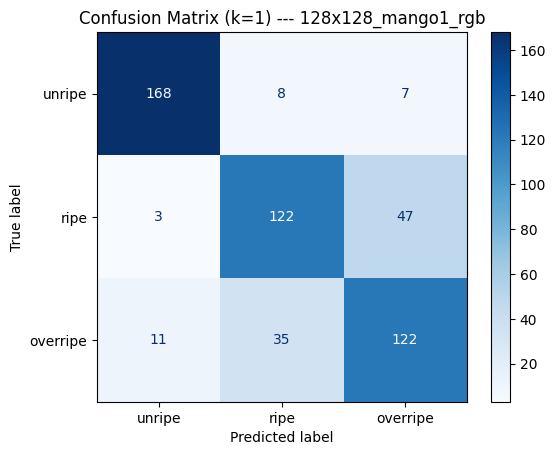

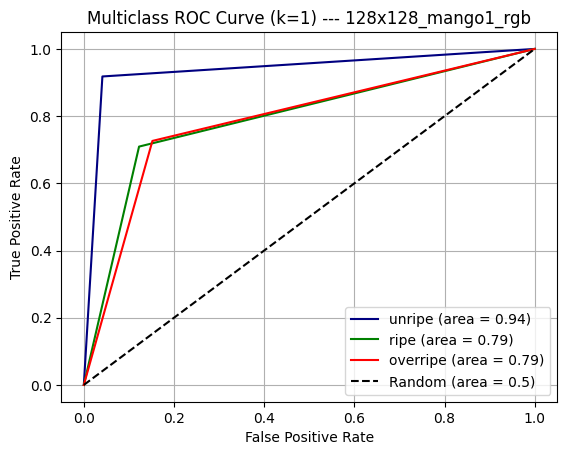


--- KNN (k=3) on 128x128_mango1_rgb Feature ---
              precision    recall  f1-score   support

      unripe     0.9529    0.8852    0.9178       183
        ripe     0.7547    0.6977    0.7251       172
    overripe     0.6753    0.7798    0.7238       168

    accuracy                         0.7897       523
   macro avg     0.7943    0.7876    0.7889       523
weighted avg     0.7986    0.7897    0.7921       523

Training time: 0.0030 seconds


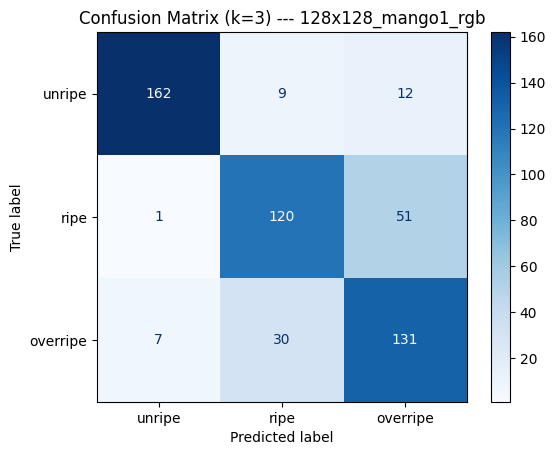

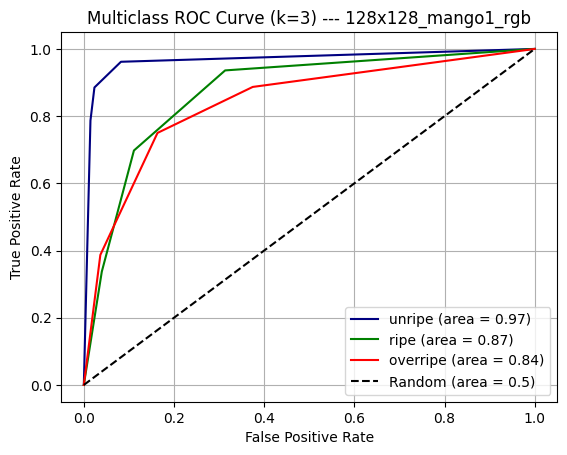


--- KNN (k=5) on 128x128_mango1_rgb Feature ---
              precision    recall  f1-score   support

      unripe     0.9302    0.8743    0.9014       183
        ripe     0.7278    0.6686    0.6970       172
    overripe     0.6528    0.7500    0.6981       168

    accuracy                         0.7667       523
   macro avg     0.7703    0.7643    0.7655       523
weighted avg     0.7746    0.7667    0.7689       523

Training time: 0.0040 seconds


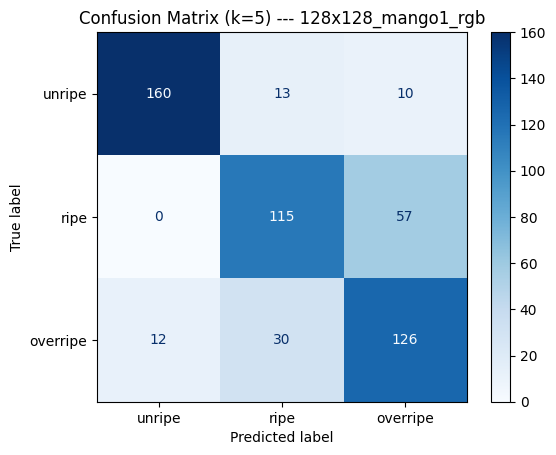

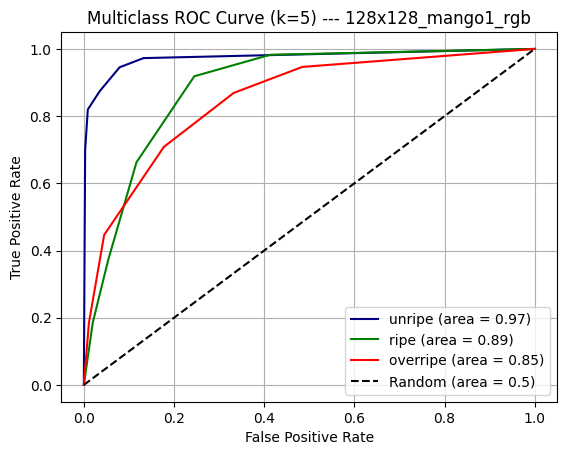


--- KNN (k=7) on 128x128_mango1_rgb Feature ---
              precision    recall  f1-score   support

      unripe     0.9205    0.8852    0.9025       183
        ripe     0.7229    0.6977    0.7101       172
    overripe     0.6630    0.7143    0.6877       168

    accuracy                         0.7686       523
   macro avg     0.7688    0.7657    0.7667       523
weighted avg     0.7728    0.7686    0.7702       523

Training time: 0.0040 seconds


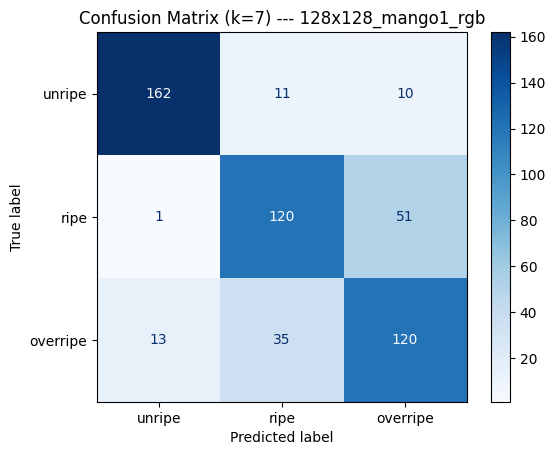

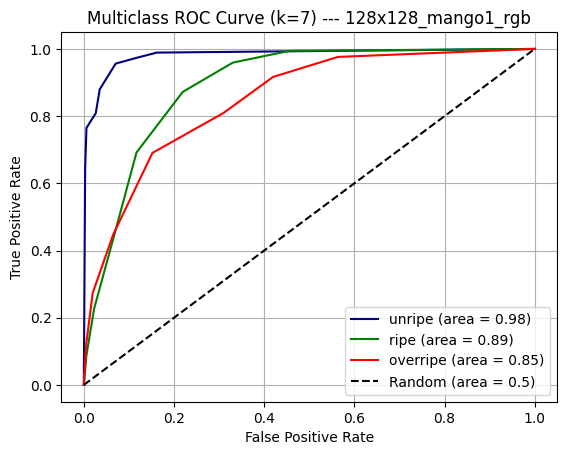


--- KNN (k=10) on 128x128_mango1_rgb Feature ---
              precision    recall  f1-score   support

      unripe     0.8989    0.9235    0.9111       183
        ripe     0.7267    0.6337    0.6770       172
    overripe     0.6216    0.6845    0.6516       168

    accuracy                         0.7514       523
   macro avg     0.7491    0.7472    0.7465       523
weighted avg     0.7532    0.7514    0.7507       523

Training time: 0.0030 seconds


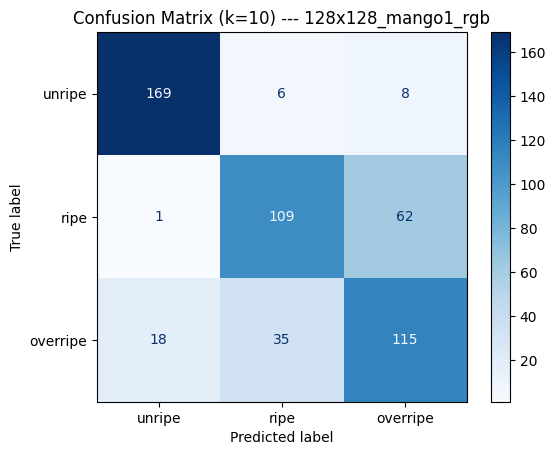

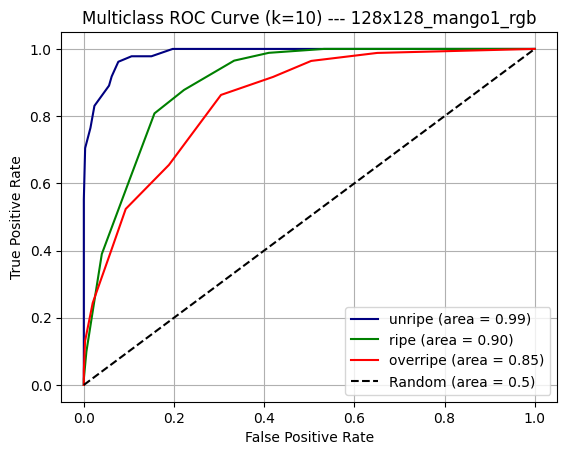

Results saved to knn_k_comparison_metrics.csv


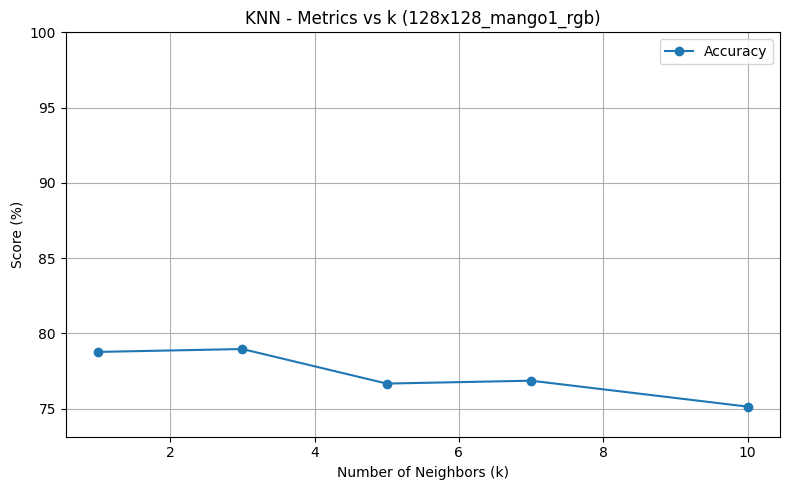

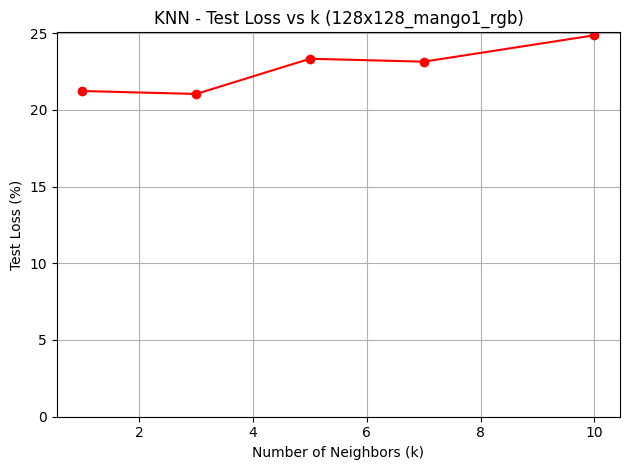

,k,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,1,78.776291,78.882099,78.776291,78.806346,21.223709,0.002997
1,3,78.967495,79.855230,78.967495,79.210355,21.032505,0.003002
2,5,76.673040,77.457206,76.673040,76.885425,23.326960,0.003999
3,7,76.864245,77.277581,76.864245,77.020849,23.135755,0.004000
4,10,75.143403,75.320156,75.143403,75.072913,24.856597,0.003000


In [12]:
from knn_classification import knn_classification

knn_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_test.csv",
    feature="128x128_mango1_rgb",
    class_order=['unripe', 'ripe', 'overripe']
)



--- KNN (k=1) on 128x128_mango1_his Feature ---
              precision    recall  f1-score   support

      unripe     0.9494    0.9235    0.9363       183
        ripe     0.8817    0.8663    0.8739       172
    overripe     0.8295    0.8690    0.8488       168

    accuracy                         0.8872       523
   macro avg     0.8869    0.8863    0.8863       523
weighted avg     0.8886    0.8872    0.8877       523

Training time: 0.0030 seconds


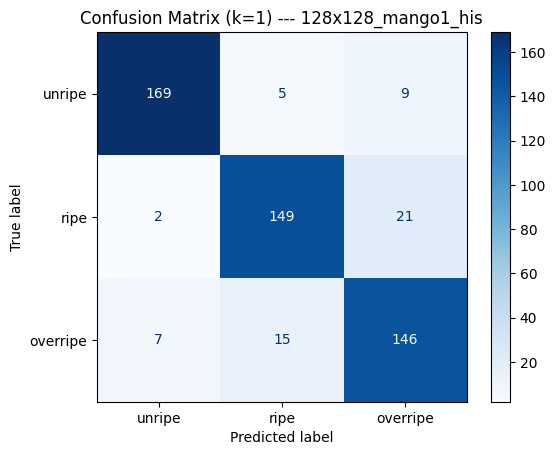

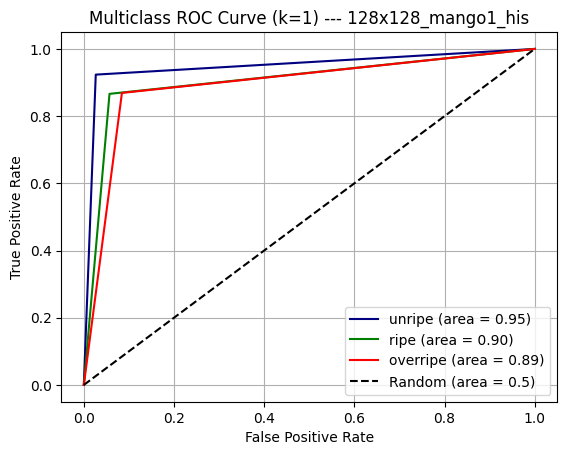


--- KNN (k=3) on 128x128_mango1_his Feature ---
              precision    recall  f1-score   support

      unripe     0.9368    0.8907    0.9132       183
        ripe     0.8372    0.8372    0.8372       172
    overripe     0.7966    0.8393    0.8174       168

    accuracy                         0.8566       523
   macro avg     0.8569    0.8557    0.8559       523
weighted avg     0.8590    0.8566    0.8574       523

Training time: 0.0030 seconds


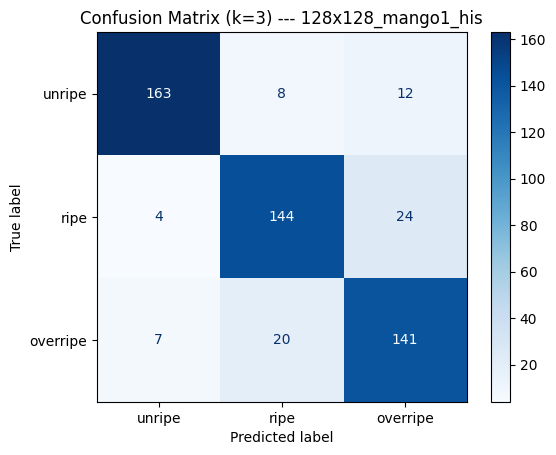

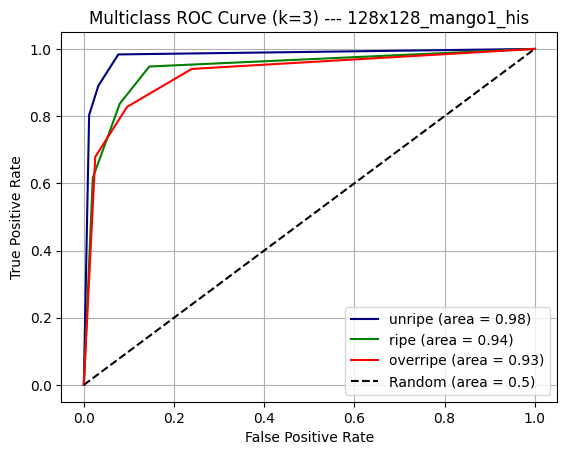


--- KNN (k=5) on 128x128_mango1_his Feature ---
              precision    recall  f1-score   support

      unripe     0.9489    0.9126    0.9304       183
        ripe     0.8400    0.8547    0.8473       172
    overripe     0.8198    0.8393    0.8294       168

    accuracy                         0.8700       523
   macro avg     0.8695    0.8688    0.8690       523
weighted avg     0.8716    0.8700    0.8706       523

Training time: 0.0030 seconds


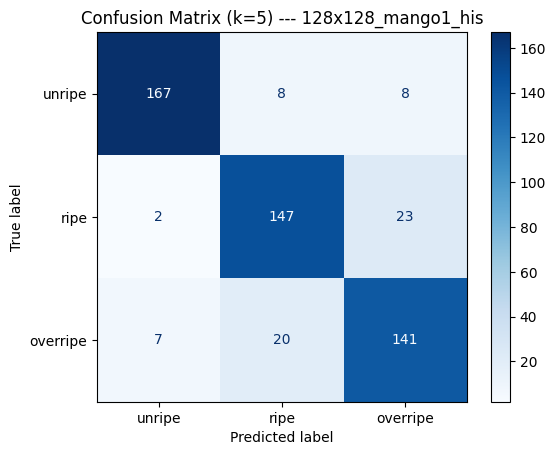

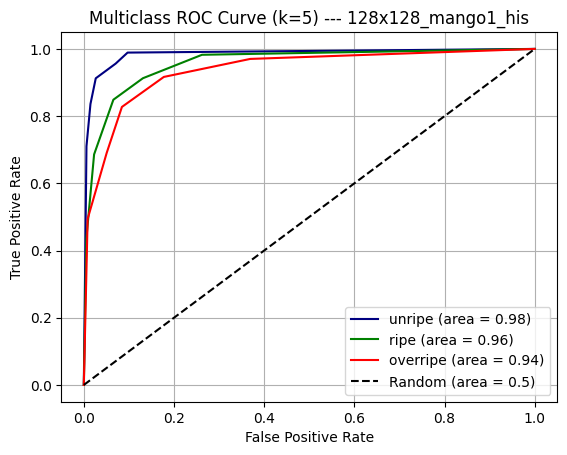


--- KNN (k=7) on 128x128_mango1_his Feature ---
              precision    recall  f1-score   support

      unripe     0.9135    0.9235    0.9185       183
        ripe     0.8667    0.8314    0.8487       172
    overripe     0.7861    0.8095    0.7977       168

    accuracy                         0.8566       523
   macro avg     0.8554    0.8548    0.8549       523
weighted avg     0.8572    0.8566    0.8567       523

Training time: 0.0020 seconds


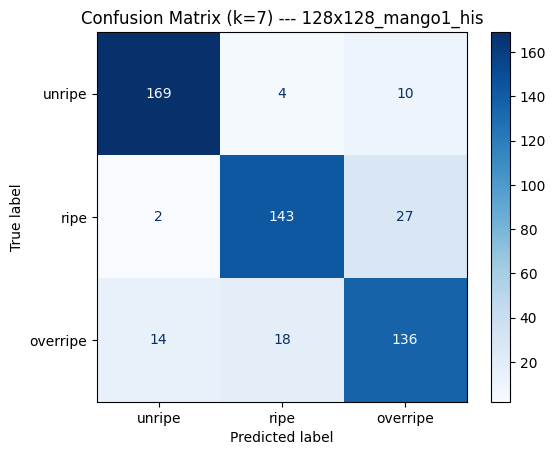

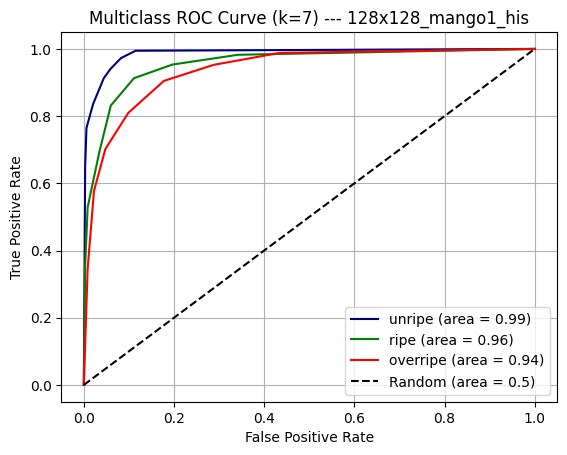


--- KNN (k=10) on 128x128_mango1_his Feature ---
              precision    recall  f1-score   support

      unripe     0.9032    0.9180    0.9106       183
        ripe     0.8654    0.7849    0.8232       172
    overripe     0.7514    0.8095    0.7794       168

    accuracy                         0.8394       523
   macro avg     0.8400    0.8375    0.8377       523
weighted avg     0.8420    0.8394    0.8397       523

Training time: 0.0030 seconds


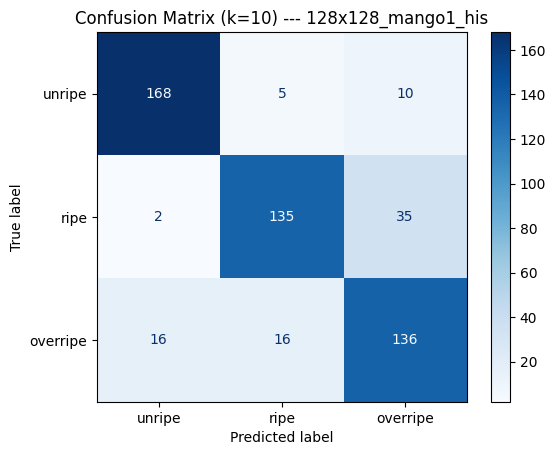

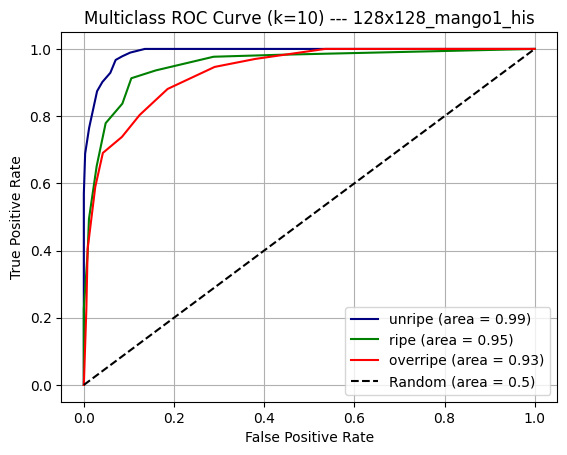

Results saved to knn_k_comparison_metrics.csv


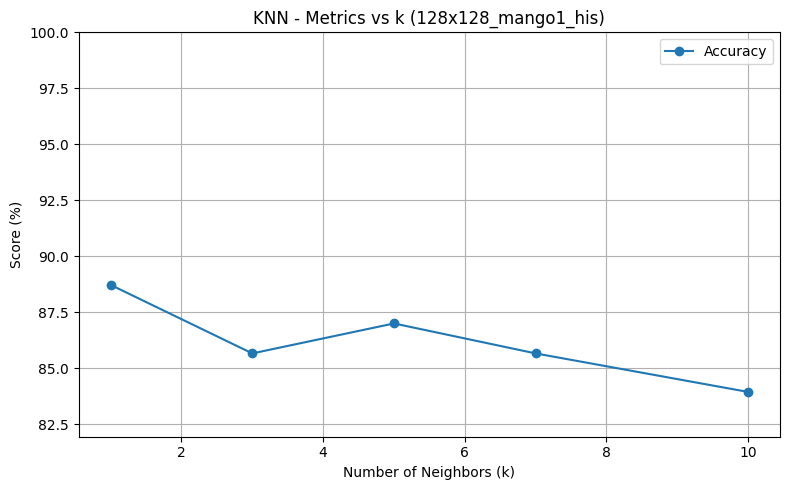

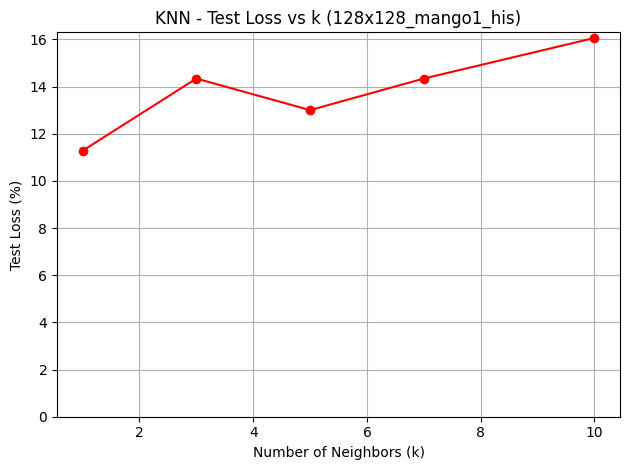

,k,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,1,88.718929,88.863441,88.718929,88.767920,11.281071,0.003000
1,3,85.659656,85.900869,85.659656,85.742062,14.340344,0.002998
2,5,86.998088,87.159269,86.998088,87.060526,13.001912,0.003000
3,7,85.659656,85.718739,85.659656,85.670691,14.340344,0.002000
4,10,83.938815,84.200482,83.938815,83.968185,16.061185,0.002999


In [13]:
from knn_classification import knn_classification

knn_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_test.csv",
    feature="128x128_mango1_his",
    class_order=['unripe', 'ripe', 'overripe']
)



--- KNN (k=1) on 128x128_mango1_lab Feature ---
              precision    recall  f1-score   support

      unripe     0.9282    0.9180    0.9231       183
        ripe     0.9051    0.8314    0.8667       172
    overripe     0.8098    0.8869    0.8466       168

    accuracy                         0.8795       523
   macro avg     0.8810    0.8788    0.8788       523
weighted avg     0.8825    0.8795    0.8800       523

Training time: 0.0020 seconds


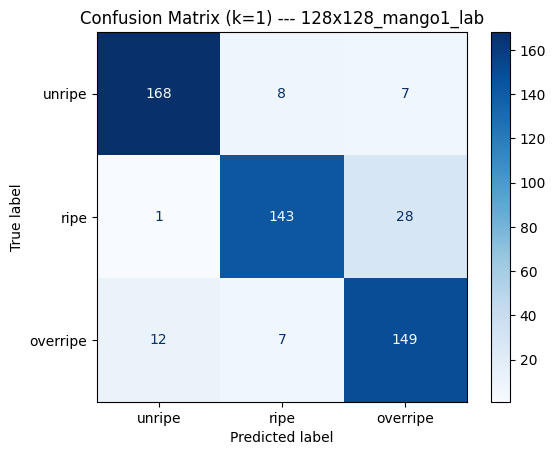

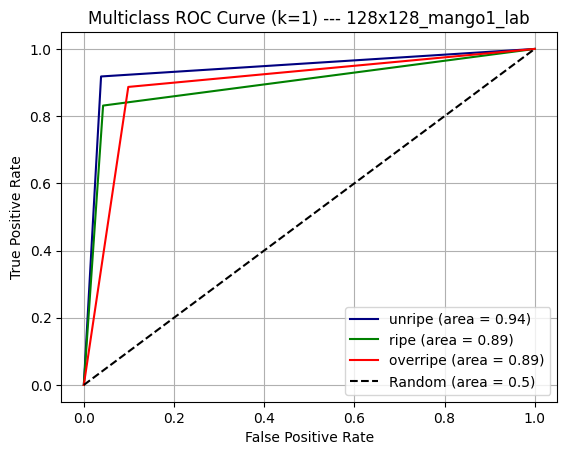


--- KNN (k=3) on 128x128_mango1_lab Feature ---
              precision    recall  f1-score   support

      unripe     0.9385    0.9180    0.9282       183
        ripe     0.8834    0.8372    0.8597       172
    overripe     0.8122    0.8750    0.8424       168

    accuracy                         0.8776       523
   macro avg     0.8780    0.8767    0.8768       523
weighted avg     0.8798    0.8776    0.8781       523

Training time: 0.0030 seconds


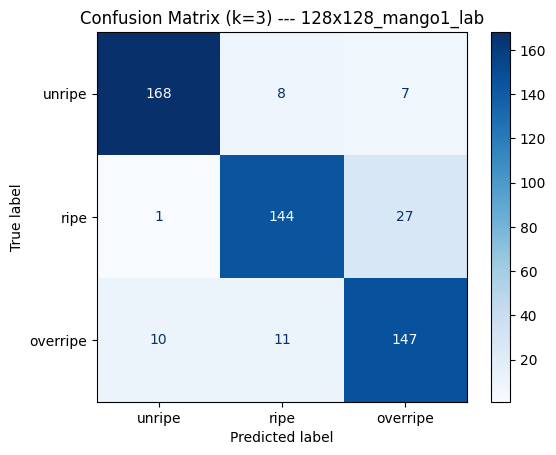

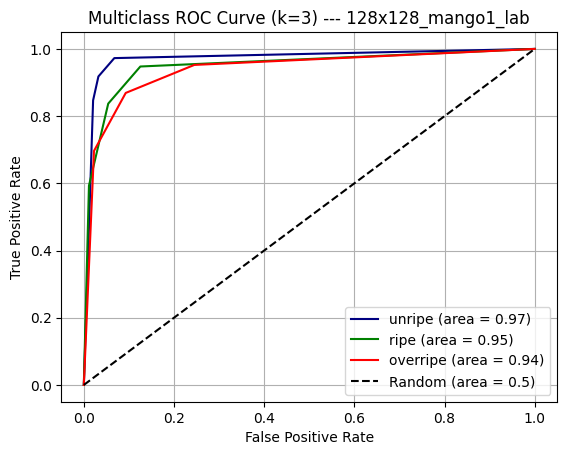


--- KNN (k=5) on 128x128_mango1_lab Feature ---
              precision    recall  f1-score   support

      unripe     0.9157    0.8907    0.9030       183
        ripe     0.8780    0.8372    0.8571       172
    overripe     0.7901    0.8512    0.8195       168

    accuracy                         0.8604       523
   macro avg     0.8613    0.8597    0.8599       523
weighted avg     0.8630    0.8604    0.8611       523

Training time: 0.0030 seconds


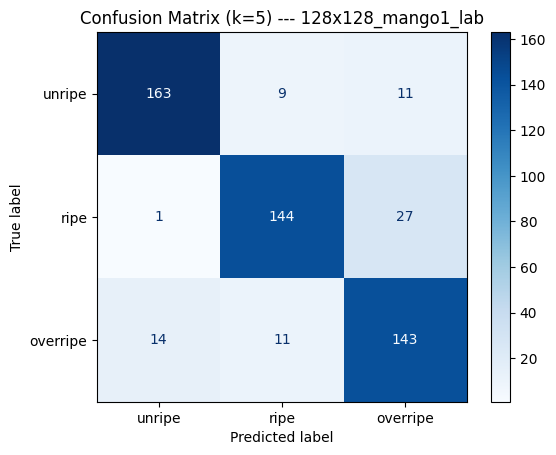

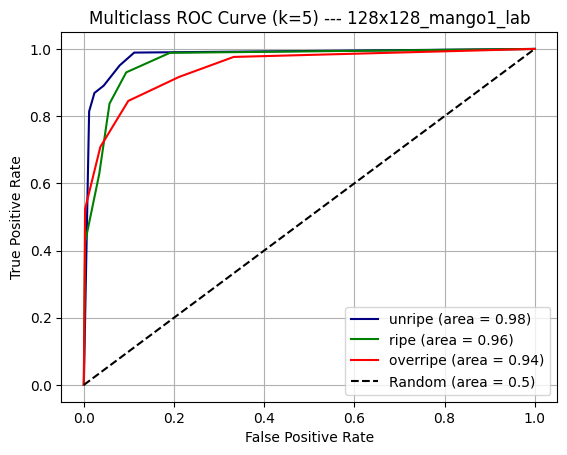


--- KNN (k=7) on 128x128_mango1_lab Feature ---
              precision    recall  f1-score   support

      unripe     0.8936    0.9180    0.9057       183
        ripe     0.8598    0.8198    0.8393       172
    overripe     0.7953    0.8095    0.8024       168

    accuracy                         0.8509       523
   macro avg     0.8496    0.8491    0.8491       523
weighted avg     0.8509    0.8509    0.8506       523

Training time: 0.0040 seconds


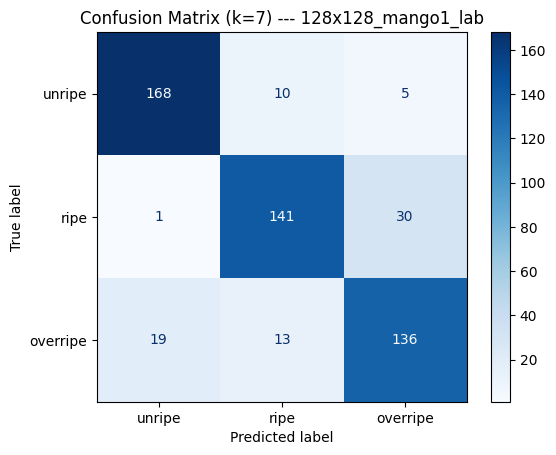

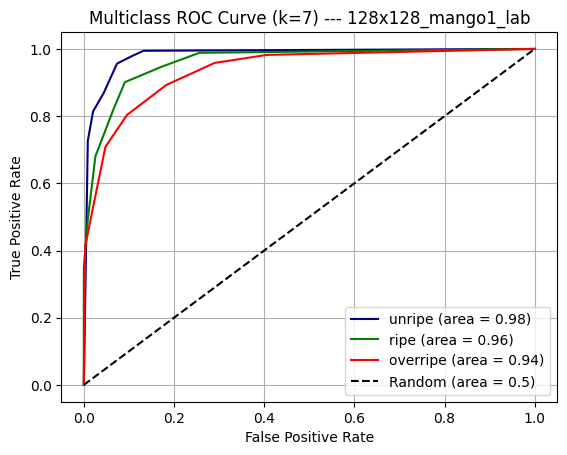


--- KNN (k=10) on 128x128_mango1_lab Feature ---
              precision    recall  f1-score   support

      unripe     0.8978    0.9126    0.9051       183
        ripe     0.8642    0.8140    0.8383       172
    overripe     0.7829    0.8155    0.7988       168

    accuracy                         0.8489       523
   macro avg     0.8483    0.8473    0.8474       523
weighted avg     0.8498    0.8489    0.8490       523

Training time: 0.0030 seconds


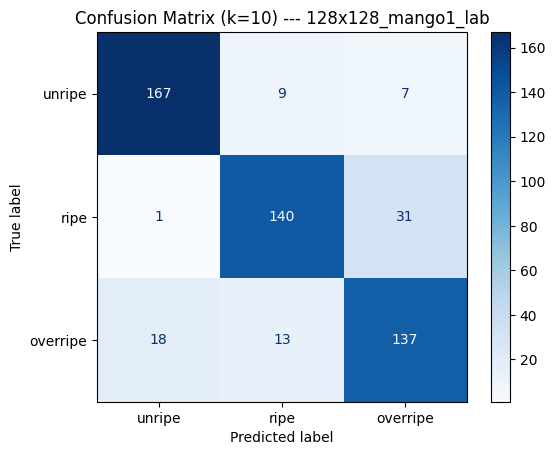

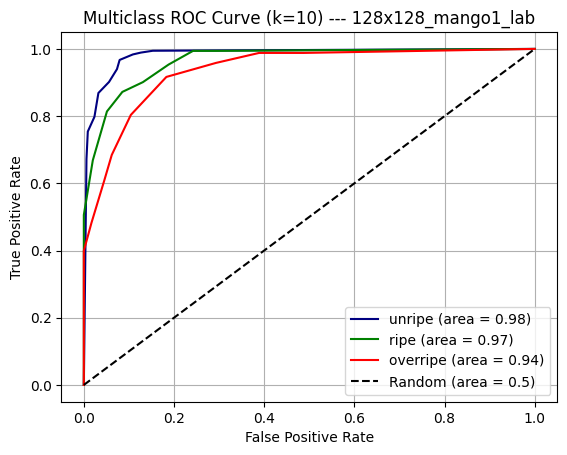

Results saved to knn_k_comparison_metrics.csv


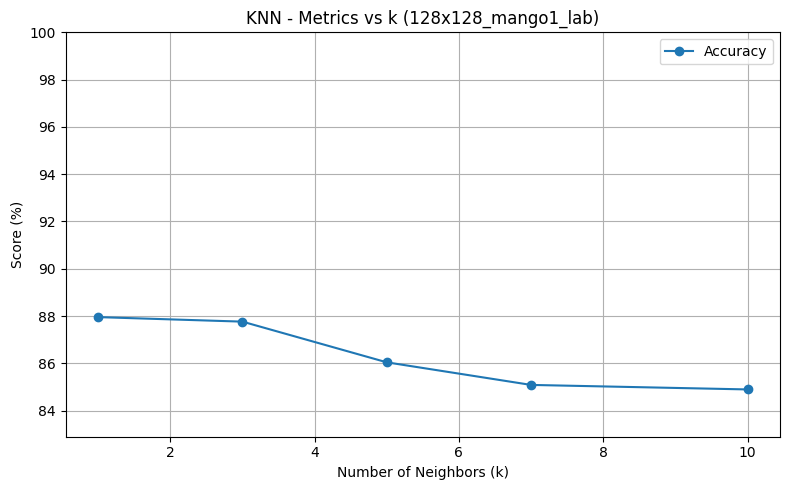

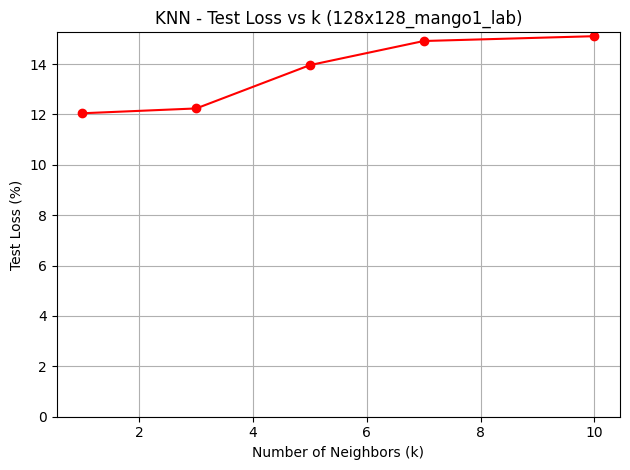

,k,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,1,87.954111,88.254439,87.954111,87.995605,12.045889,0.002005
1,3,87.762906,87.982237,87.762906,87.810586,12.237094,0.002999
2,5,86.042065,86.296811,86.042065,86.110811,13.957935,0.002999
3,7,85.086042,85.090631,85.086042,85.064905,14.913958,0.003999
4,10,84.894837,84.984403,84.894837,84.902098,15.105163,0.002999


In [14]:
from knn_classification import knn_classification

knn_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_test.csv",
    feature="128x128_mango1_lab",
    class_order=['unripe', 'ripe', 'overripe']
)



--- KNN (k=1) on 128x128_mango1_lbp Feature ---
              precision    recall  f1-score   support

      unripe     0.9695    0.8689    0.9164       183
        ripe     0.9464    0.9244    0.9353       172
    overripe     0.8639    0.9821    0.9192       168

    accuracy                         0.9235       523
   macro avg     0.9266    0.9251    0.9236       523
weighted avg     0.9280    0.9235    0.9235       523

Training time: 0.0010 seconds


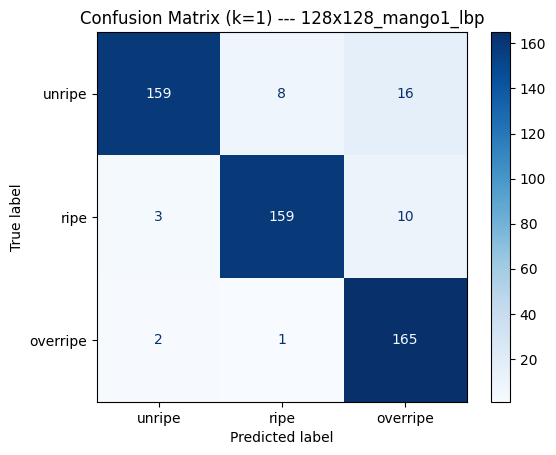

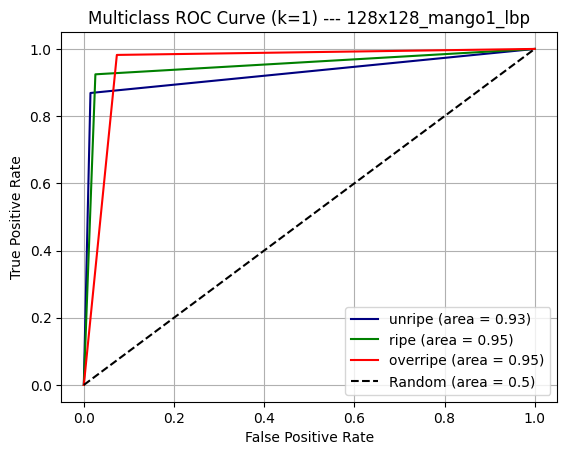


--- KNN (k=3) on 128x128_mango1_lbp Feature ---
              precision    recall  f1-score   support

      unripe     0.9405    0.8634    0.9003       183
        ripe     0.9277    0.8953    0.9112       172
    overripe     0.8519    0.9583    0.9020       168

    accuracy                         0.9044       523
   macro avg     0.9067    0.9057    0.9045       523
weighted avg     0.9078    0.9044    0.9044       523

Training time: 0.0010 seconds


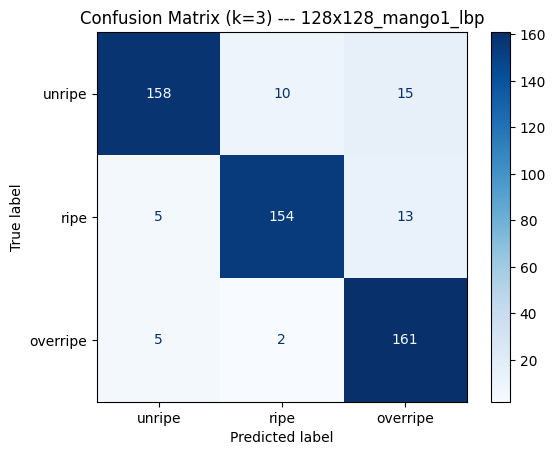

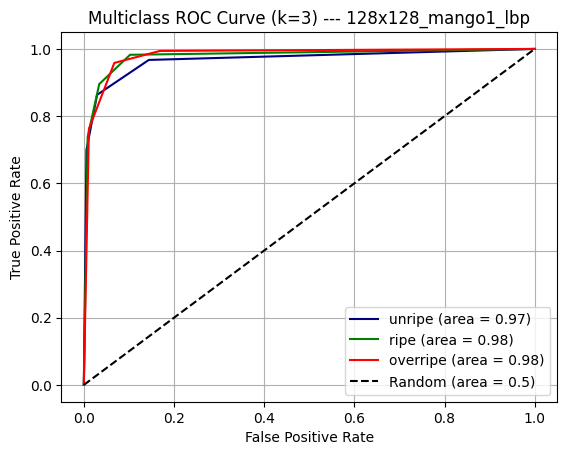


--- KNN (k=5) on 128x128_mango1_lbp Feature ---
              precision    recall  f1-score   support

      unripe     0.9181    0.8579    0.8870       183
        ripe     0.9212    0.8837    0.9021       172
    overripe     0.8342    0.9286    0.8789       168

    accuracy                         0.8891       523
   macro avg     0.8912    0.8901    0.8893       523
weighted avg     0.8922    0.8891    0.8893       523

Training time: 0.0020 seconds


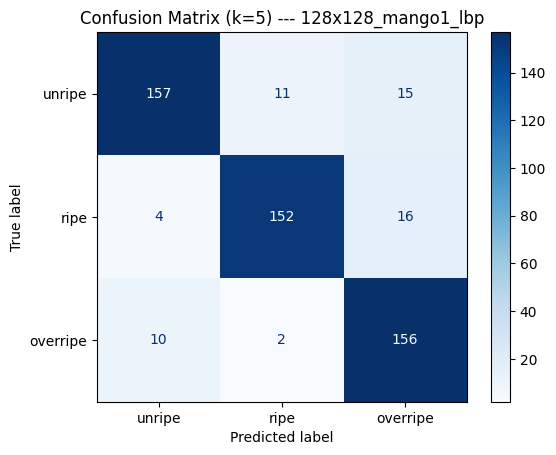

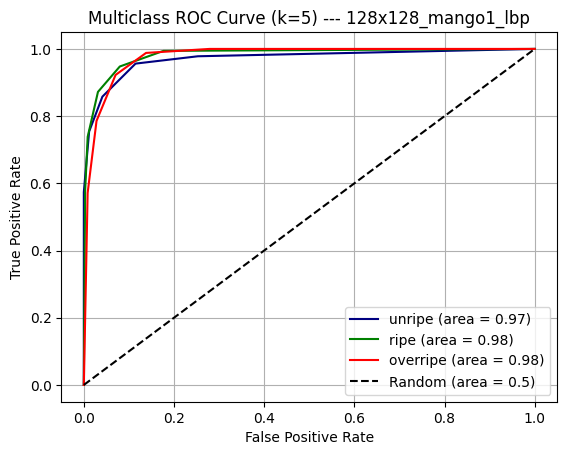


--- KNN (k=7) on 128x128_mango1_lbp Feature ---
              precision    recall  f1-score   support

      unripe     0.8763    0.8907    0.8835       183
        ripe     0.9304    0.8547    0.8909       172
    overripe     0.8380    0.8929    0.8646       168

    accuracy                         0.8795       523
   macro avg     0.8816    0.8794    0.8796       523
weighted avg     0.8818    0.8795    0.8798       523

Training time: 0.0030 seconds


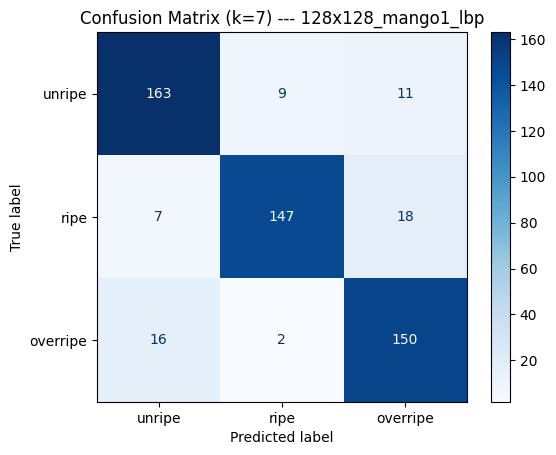

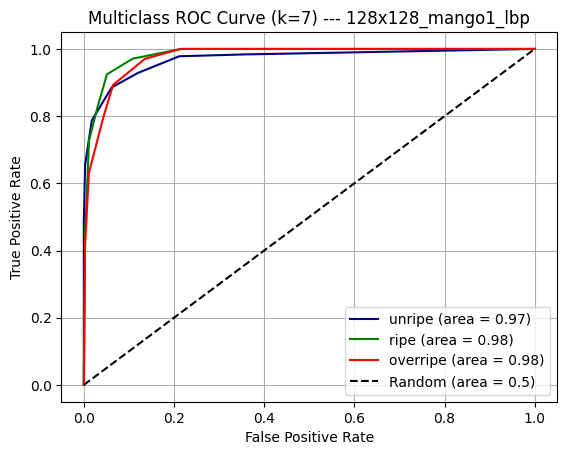


--- KNN (k=10) on 128x128_mango1_lbp Feature ---
              precision    recall  f1-score   support

      unripe     0.9029    0.8634    0.8827       183
        ripe     0.9226    0.8314    0.8746       172
    overripe     0.8031    0.9226    0.8587       168

    accuracy                         0.8719       523
   macro avg     0.8762    0.8725    0.8720       523
weighted avg     0.8773    0.8719    0.8723       523

Training time: 0.0020 seconds


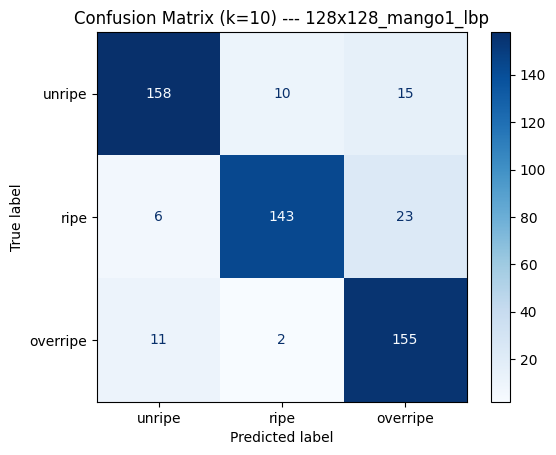

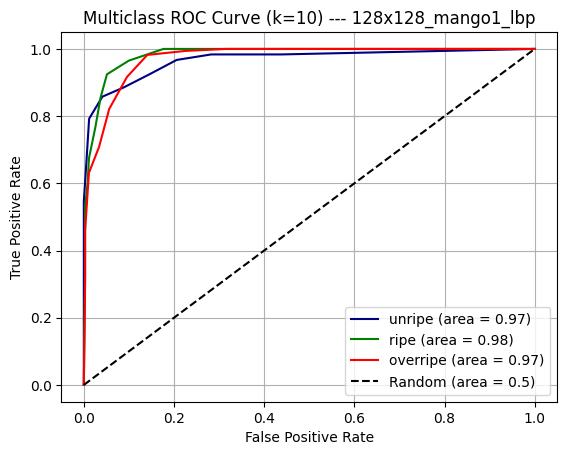

Results saved to knn_k_comparison_metrics.csv


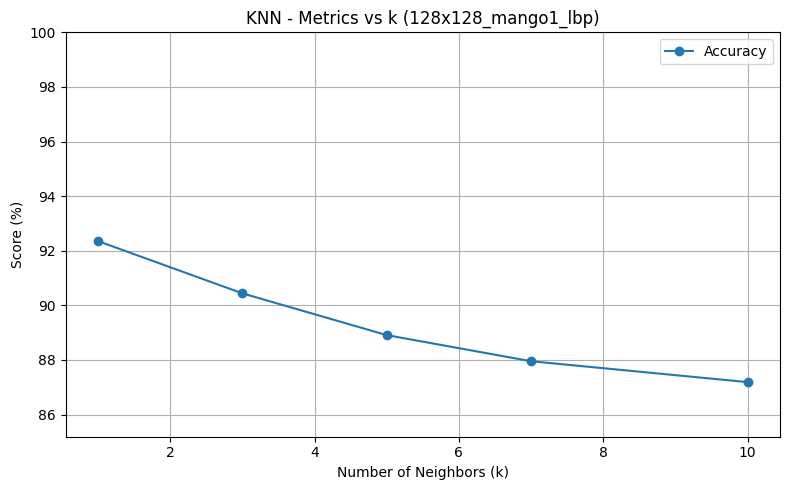

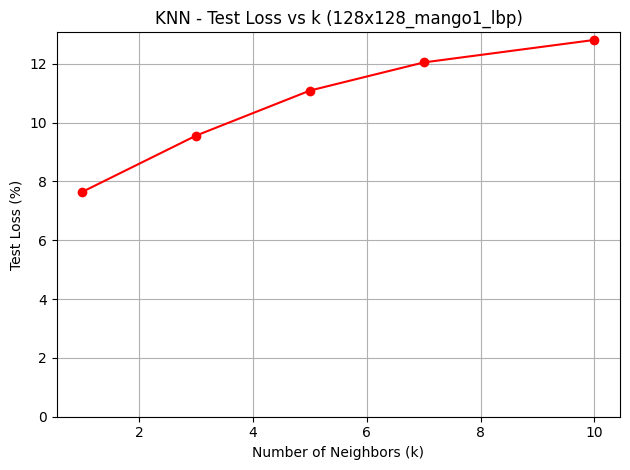

,k,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,1,92.351816,92.798726,92.351816,92.352889,7.648184,0.001002
1,3,90.439771,90.780979,90.439771,90.442691,9.560229,0.001003
2,5,88.910134,89.219075,88.910134,88.934992,11.089866,0.002000
3,7,87.954111,88.179428,87.954111,87.983961,12.045889,0.003000
4,10,87.189293,87.730212,87.189293,87.233443,12.810707,0.002001


In [15]:
from knn_classification import knn_classification

knn_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_test.csv",
    feature="128x128_mango1_lbp",
    class_order=['unripe', 'ripe', 'overripe']
)



--- KNN (k=1) on 128x128_mango1_glcm Feature ---
              precision    recall  f1-score   support

      unripe     0.9126    0.9126    0.9126       183
        ripe     0.7950    0.7442    0.7688       172
    overripe     0.7263    0.7738    0.7493       168

    accuracy                         0.8126       523
   macro avg     0.8113    0.8102    0.8102       523
weighted avg     0.8141    0.8126    0.8128       523

Training time: 0.0040 seconds


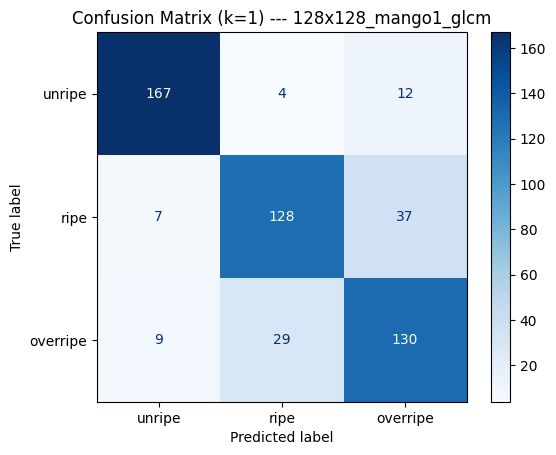

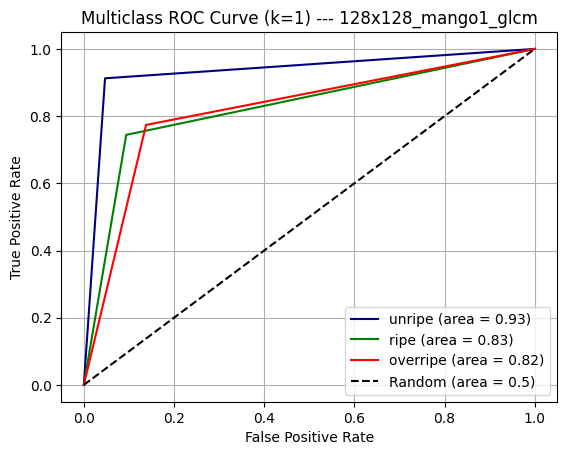


--- KNN (k=3) on 128x128_mango1_glcm Feature ---
              precision    recall  f1-score   support

      unripe     0.8994    0.8798    0.8895       183
        ripe     0.8067    0.7035    0.7516       172
    overripe     0.6907    0.7976    0.7403       168

    accuracy                         0.7954       523
   macro avg     0.7989    0.7936    0.7938       523
weighted avg     0.8019    0.7954    0.7962       523

Training time: 0.0040 seconds


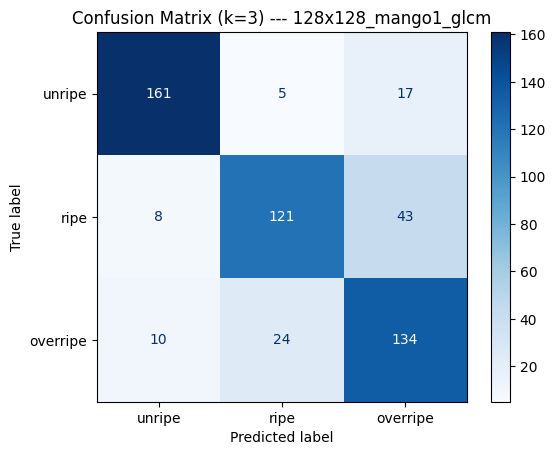

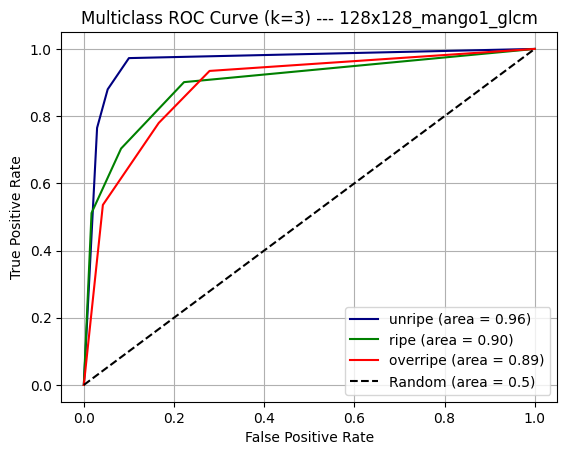


--- KNN (k=5) on 128x128_mango1_glcm Feature ---
              precision    recall  f1-score   support

      unripe     0.8989    0.9235    0.9111       183
        ripe     0.8611    0.7209    0.7848       172
    overripe     0.7277    0.8274    0.7744       168

    accuracy                         0.8260       523
   macro avg     0.8293    0.8239    0.8234       523
weighted avg     0.8315    0.8260    0.8256       523

Training time: 0.0030 seconds


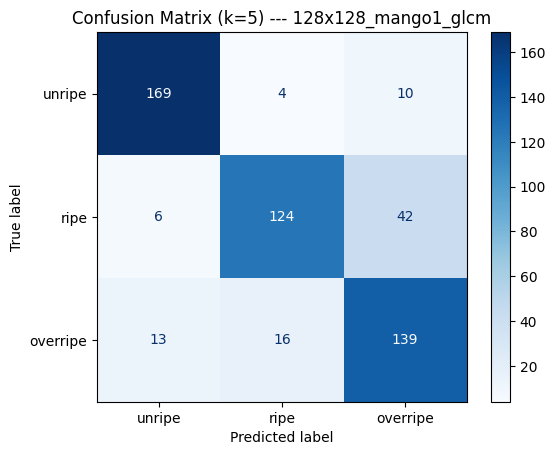

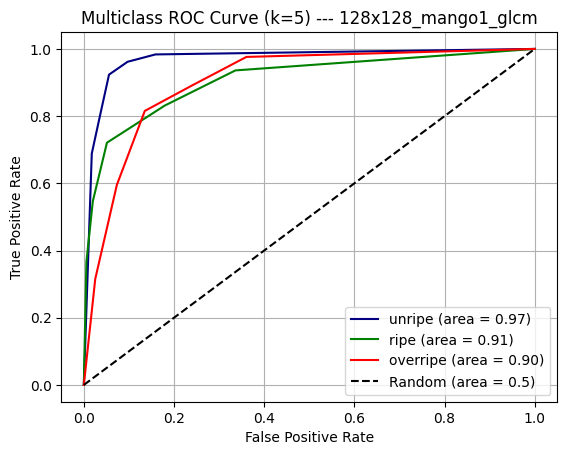


--- KNN (k=7) on 128x128_mango1_glcm Feature ---
              precision    recall  f1-score   support

      unripe     0.8718    0.9290    0.8995       183
        ripe     0.8451    0.6977    0.7643       172
    overripe     0.7312    0.8095    0.7684       168

    accuracy                         0.8145       523
   macro avg     0.8160    0.8121    0.8107       523
weighted avg     0.8178    0.8145    0.8129       523

Training time: 0.0035 seconds


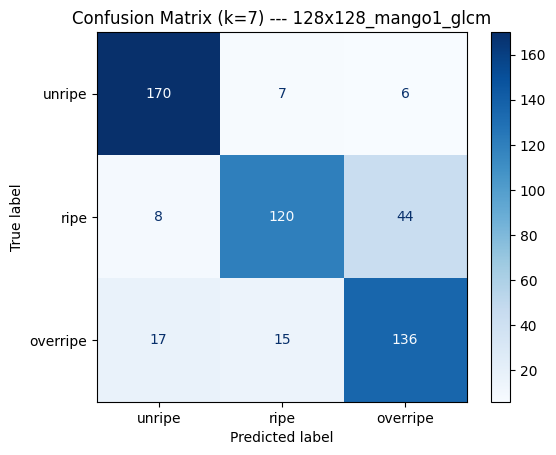

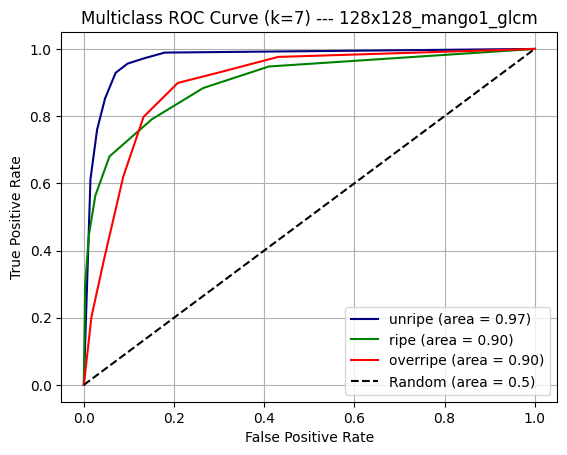


--- KNN (k=10) on 128x128_mango1_glcm Feature ---
              precision    recall  f1-score   support

      unripe     0.8660    0.9180    0.8912       183
        ripe     0.8629    0.6221    0.7230       172
    overripe     0.6927    0.8452    0.7614       168

    accuracy                         0.7973       523
   macro avg     0.8072    0.7951    0.7919       523
weighted avg     0.8093    0.7973    0.7942       523

Training time: 0.0040 seconds


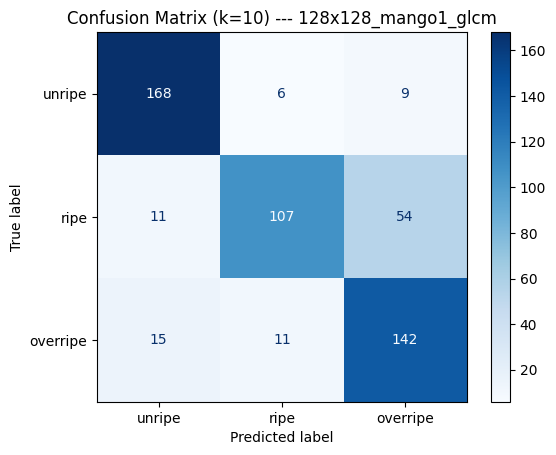

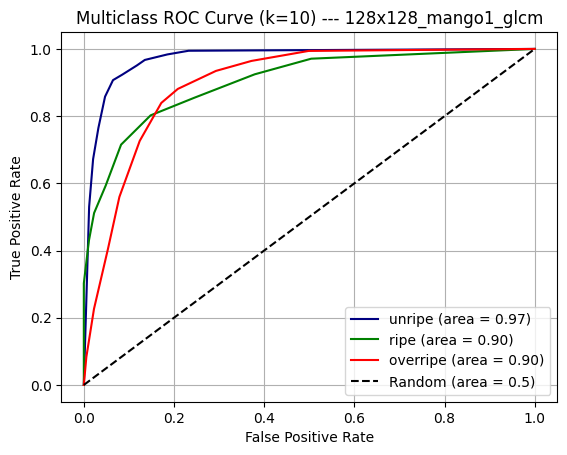

Results saved to knn_k_comparison_metrics.csv


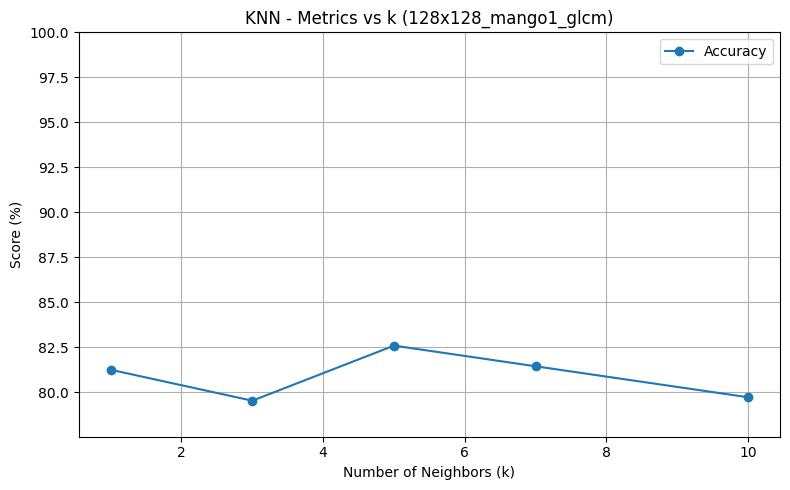

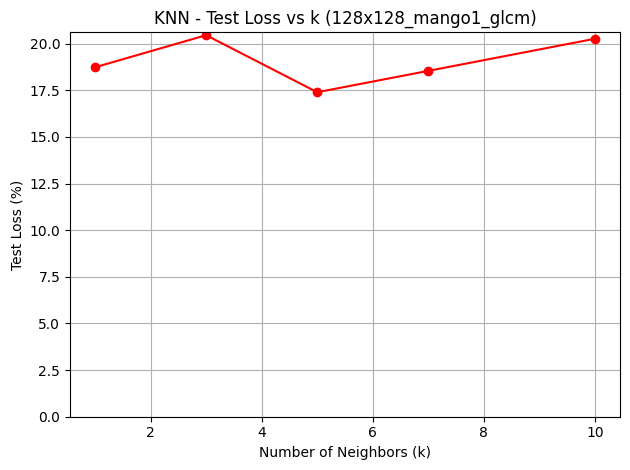

,k,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,1,81.261950,81.406599,81.261950,81.282446,18.738050,0.004001
1,3,79.541109,80.188464,79.541109,79.621755,20.458891,0.003999
2,5,82.600382,83.150709,82.600382,82.562987,17.399618,0.003000
3,7,81.453155,81.783802,81.453155,81.291183,18.546845,0.003505
4,10,79.732314,80.930079,79.732314,79.419446,20.267686,0.004006


In [16]:
from knn_classification import knn_classification

knn_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_test.csv",
    feature="128x128_mango1_glcm",
    class_order=['unripe', 'ripe', 'overripe']
)


## SVM


 Now running: 128x128_rgb

=== SVM (kernel=poly, degree=3, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8832    0.9508    0.9158       183
        ripe     0.7011    0.7093    0.7052       172
    overripe     0.6645    0.6012    0.6312       168

    accuracy                         0.7591       523
   macro avg     0.7496    0.7538    0.7507       523
weighted avg     0.7531    0.7591    0.7551       523



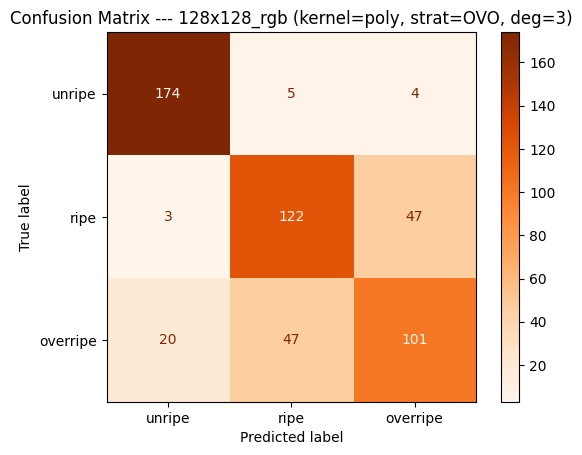


=== SVM (kernel=poly, degree=4, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5765    0.9672    0.7224       183
        ripe     0.7664    0.4767    0.5878       172
    overripe     0.6972    0.4524    0.5487       168

    accuracy                         0.6405       523
   macro avg     0.6801    0.6321    0.6197       523
weighted avg     0.6777    0.6405    0.6224       523



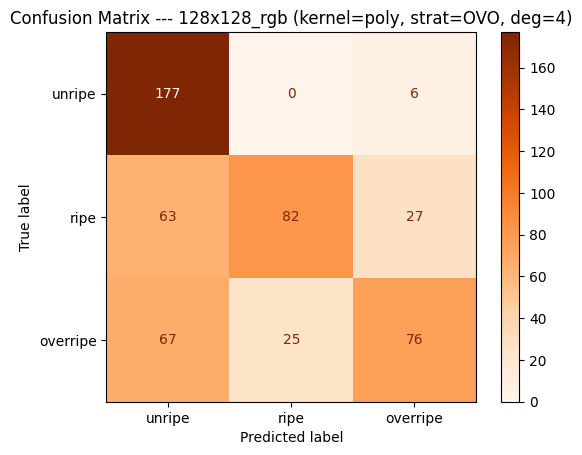


=== SVM (kernel=poly, degree=5, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6020    0.9836    0.7469       183
        ripe     0.7524    0.4593    0.5704       172
    overripe     0.6891    0.4881    0.5714       168

    accuracy                         0.6520       523
   macro avg     0.6812    0.6437    0.6296       523
weighted avg     0.6794    0.6520    0.6325       523



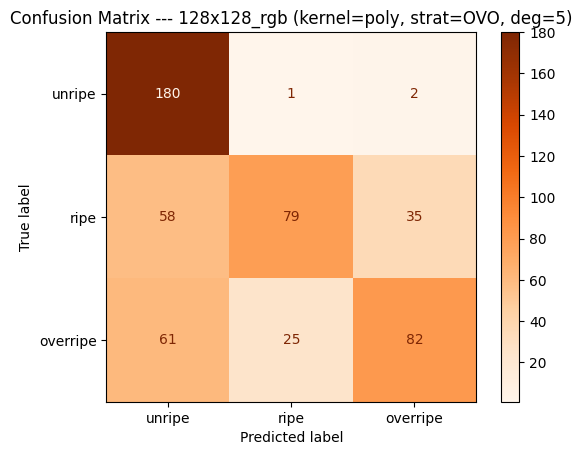


=== SVM (kernel=poly, degree=6, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5343    0.9781    0.6911       183
        ripe     0.7439    0.3547    0.4803       172
    overripe     0.6698    0.4226    0.5182       168

    accuracy                         0.5946       523
   macro avg     0.6493    0.5851    0.5632       523
weighted avg     0.6468    0.5946    0.5663       523



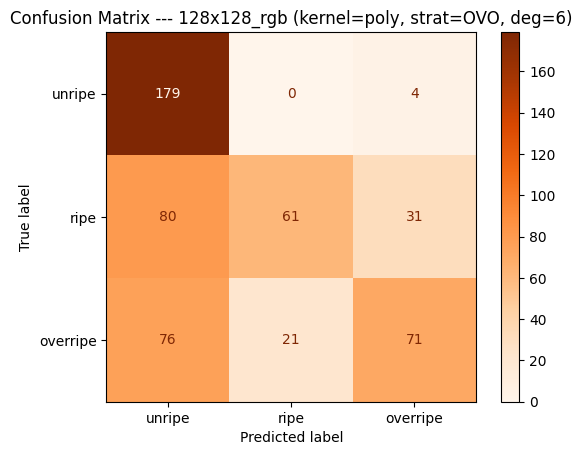


=== SVM (kernel=poly, degree=7, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5355    0.9891    0.6948       183
        ripe     0.7907    0.3953    0.5271       172
    overripe     0.7172    0.4226    0.5318       168

    accuracy                         0.6119       523
   macro avg     0.6811    0.6023    0.5846       523
weighted avg     0.6778    0.6119    0.5873       523



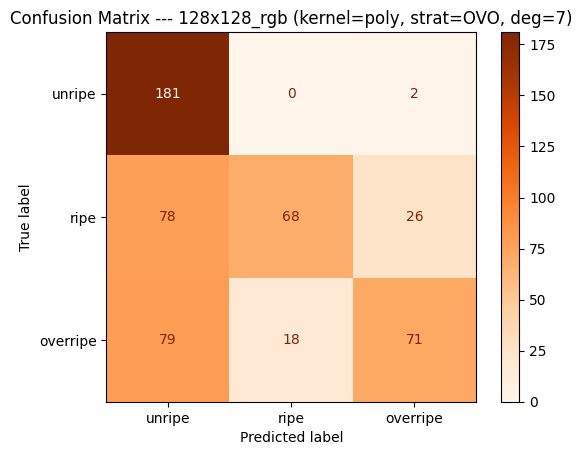


=== SVM (kernel=poly, degree=8, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5187    0.9836    0.6792       183
        ripe     0.7765    0.3837    0.5136       172
    overripe     0.7253    0.3929    0.5097       168

    accuracy                         0.5966       523
   macro avg     0.6735    0.5867    0.5675       523
weighted avg     0.6698    0.5966    0.5703       523



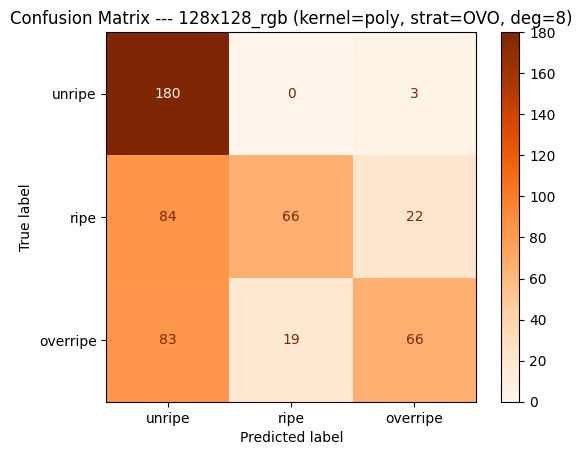


=== SVM (kernel=poly, degree=9, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5171    0.9891    0.6792       183
        ripe     0.7802    0.4128    0.5399       172
    overripe     0.7439    0.3631    0.4880       168

    accuracy                         0.5985       523
   macro avg     0.6804    0.5883    0.5690       523
weighted avg     0.6765    0.5985    0.5720       523



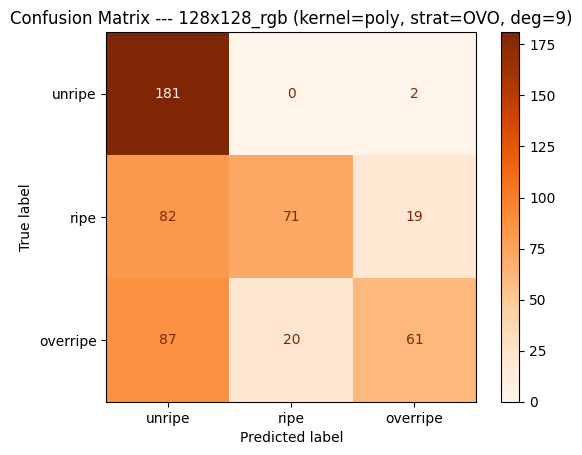


=== SVM (kernel=poly, degree=3, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7965    0.9836    0.8802       183
        ripe     0.7035    0.7035    0.7035       172
    overripe     0.6800    0.5060    0.5802       168

    accuracy                         0.7380       523
   macro avg     0.7266    0.7310    0.7213       523
weighted avg     0.7285    0.7380    0.7257       523



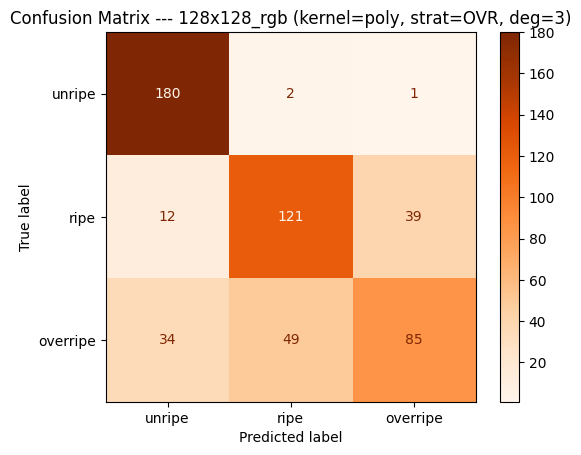


=== SVM (kernel=poly, degree=4, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6404    0.9344    0.7600       183
        ripe     0.7214    0.5872    0.6474       172
    overripe     0.6897    0.4762    0.5634       168

    accuracy                         0.6730       523
   macro avg     0.6838    0.6659    0.6569       523
weighted avg     0.6829    0.6730    0.6598       523



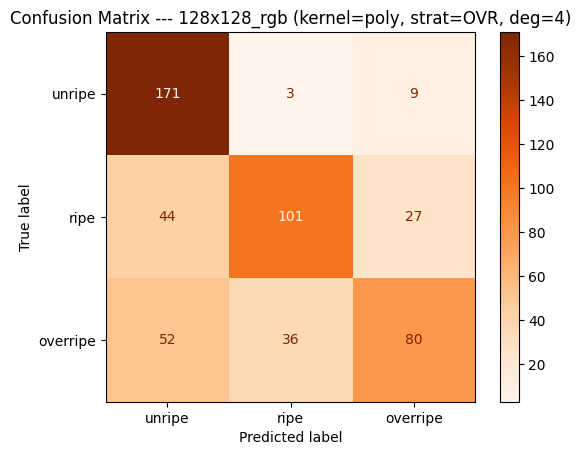


=== SVM (kernel=poly, degree=5, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6452    0.9836    0.7792       183
        ripe     0.7520    0.5465    0.6330       172
    overripe     0.6975    0.4940    0.5784       168

    accuracy                         0.6826       523
   macro avg     0.6982    0.6747    0.6635       523
weighted avg     0.6971    0.6826    0.6666       523



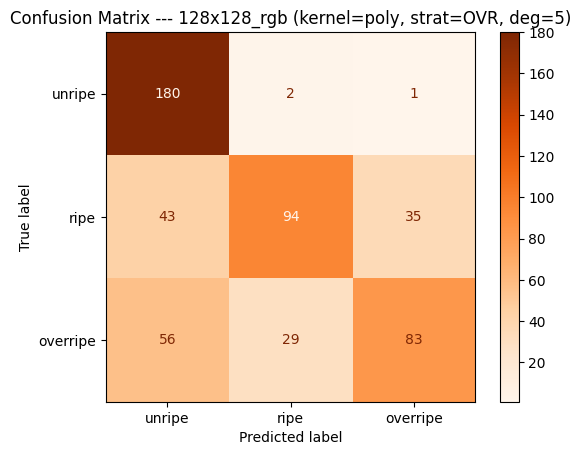


=== SVM (kernel=poly, degree=6, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6159    0.9290    0.7407       183
        ripe     0.7480    0.5349    0.6237       172
    overripe     0.6855    0.5060    0.5822       168

    accuracy                         0.6635       523
   macro avg     0.6831    0.6566    0.6489       523
weighted avg     0.6817    0.6635    0.6513       523



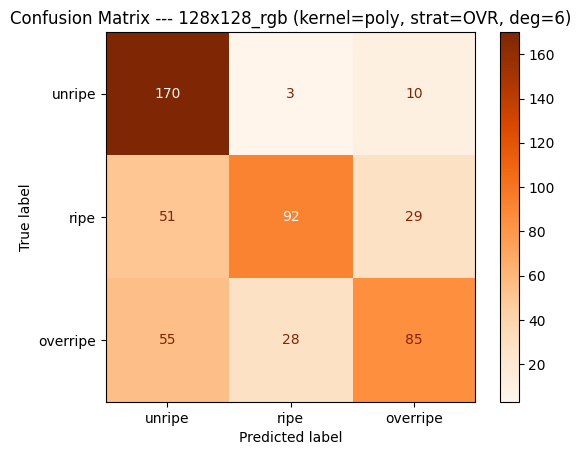


=== SVM (kernel=poly, degree=7, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6081    0.9836    0.7516       183
        ripe     0.7685    0.4826    0.5929       172
    overripe     0.7143    0.5060    0.5923       168

    accuracy                         0.6654       523
   macro avg     0.6970    0.6574    0.6456       523
weighted avg     0.6950    0.6654    0.6482       523



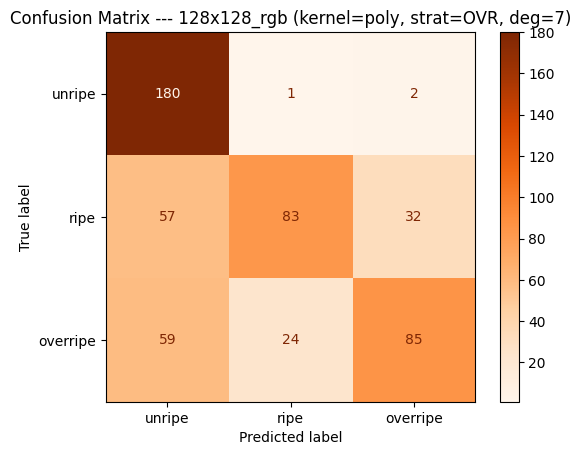


=== SVM (kernel=poly, degree=8, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6099    0.9399    0.7398       183
        ripe     0.7438    0.5233    0.6143       172
    overripe     0.7000    0.5000    0.5833       168

    accuracy                         0.6616       523
   macro avg     0.6846    0.6544    0.6458       523
weighted avg     0.6829    0.6616    0.6483       523



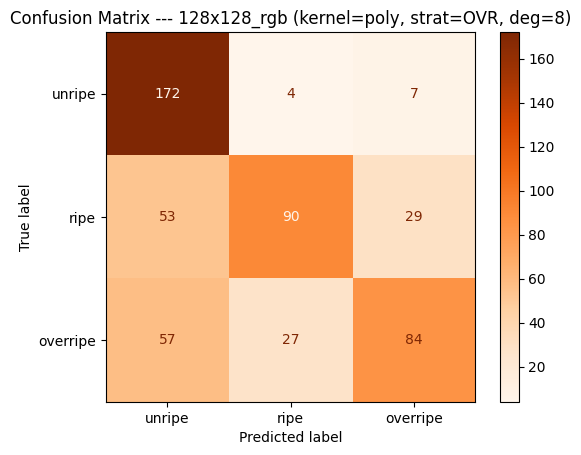


=== SVM (kernel=poly, degree=9, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.5927    0.9781    0.7381       183
        ripe     0.7778    0.5291    0.6298       172
    overripe     0.7596    0.4702    0.5809       168

    accuracy                         0.6673       523
   macro avg     0.7100    0.6591    0.6496       523
weighted avg     0.7072    0.6673    0.6520       523



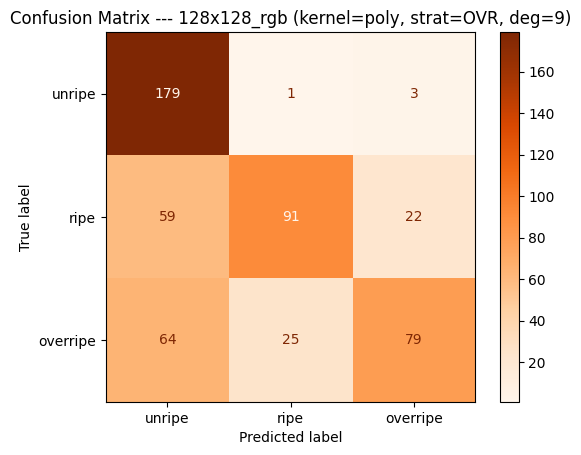


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_rgb\poly\poly_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_rgb\poly\poly_results_pairwise.csv


=== SVM (kernel=linear, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.9175    0.9727    0.9443       183
        ripe     0.7316    0.8081    0.7680       172
    overripe     0.7554    0.6250    0.6840       168

    accuracy                         0.8069       523
   macro avg     0.8015    0.8019    0.7988       523
weighted avg     0.8043    0.8069    0.8027       523



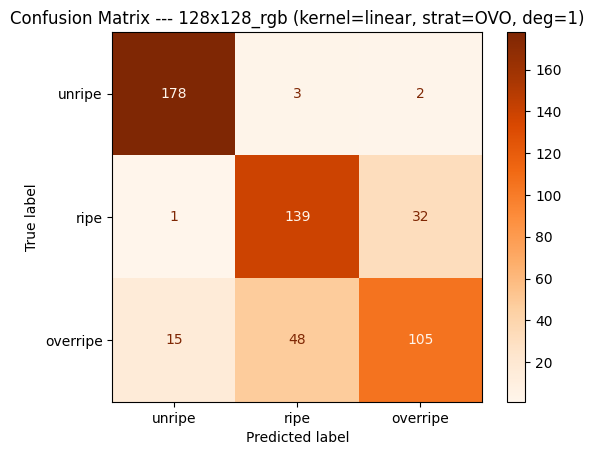


=== SVM (kernel=linear, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8985    0.9672    0.9316       183
        ripe     0.7371    0.8314    0.7814       172
    overripe     0.7727    0.6071    0.6800       168

    accuracy                         0.8069       523
   macro avg     0.8028    0.8019    0.7977       523
weighted avg     0.8050    0.8069    0.8014       523



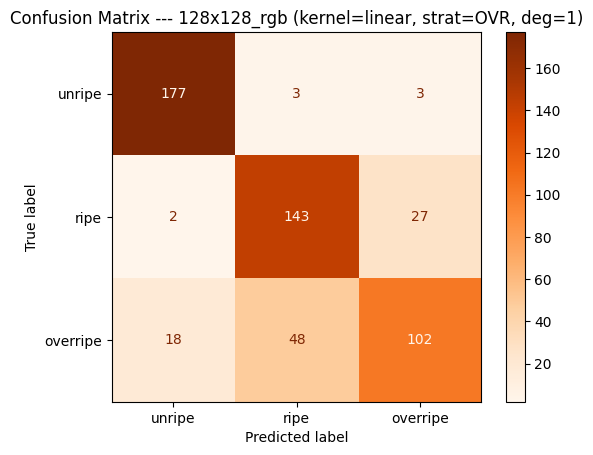


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_rgb\linear\linear_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_rgb\linear\linear_results_pairwise.csv


=== SVM (kernel=rbf, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.9040    0.9781    0.9396       183
        ripe     0.7318    0.7616    0.7464       172
    overripe     0.7123    0.6190    0.6624       168

    accuracy                         0.7916       523
   macro avg     0.7827    0.7863    0.7828       523
weighted avg     0.7858    0.7916    0.7870       523



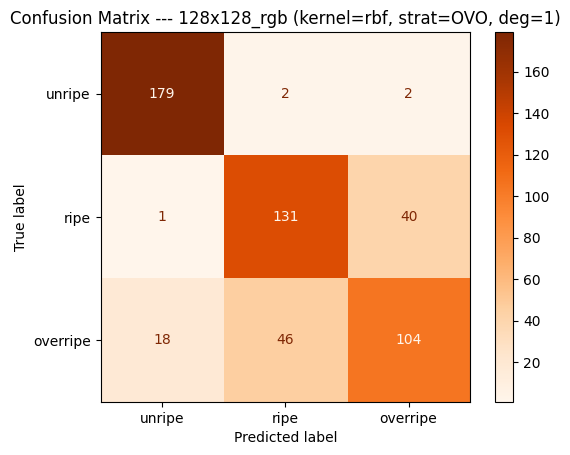


=== SVM (kernel=rbf, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8732    0.9781    0.9227       183
        ripe     0.7303    0.7558    0.7429       172
    overripe     0.6929    0.5774    0.6299       168

    accuracy                         0.7763       523
   macro avg     0.7655    0.7704    0.7651       523
weighted avg     0.7683    0.7763    0.7695       523



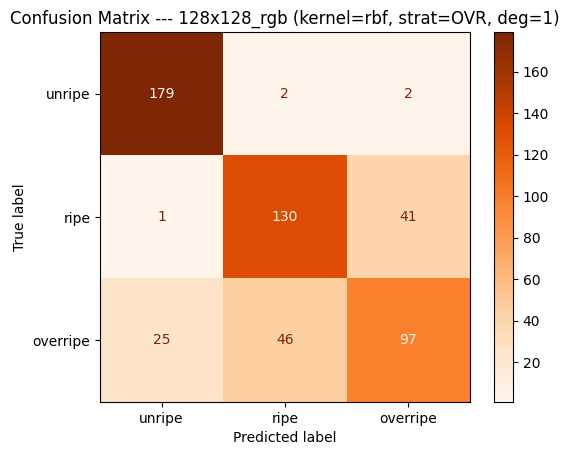


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_rgb\rbf\rbf_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_rgb\rbf\rbf_results_pairwise.csv


=== SVM (kernel=sigmoid, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6634    0.7322    0.6961       183
        ripe     0.4105    0.4535    0.4309       172
    overripe     0.4962    0.3869    0.4348       168

    accuracy                         0.5296       523
   macro avg     0.5234    0.5242    0.5206       523
weighted avg     0.5265    0.5296    0.5250       523



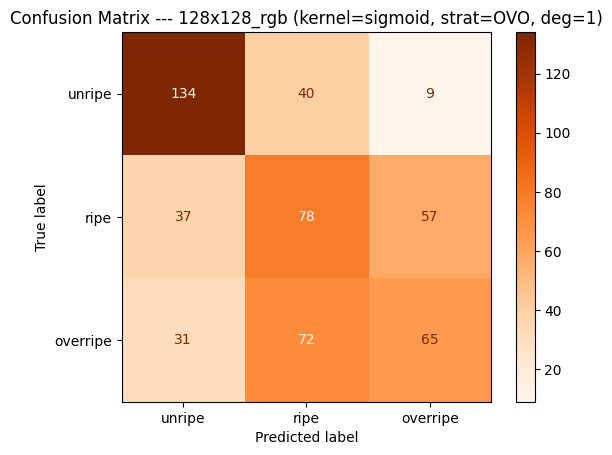


=== SVM (kernel=sigmoid, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.4946    0.7486    0.5957       183
        ripe     0.5739    0.3837    0.4599       172
    overripe     0.4504    0.3512    0.3946       168

    accuracy                         0.5010       523
   macro avg     0.5063    0.4945    0.4834       523
weighted avg     0.5065    0.5010    0.4865       523



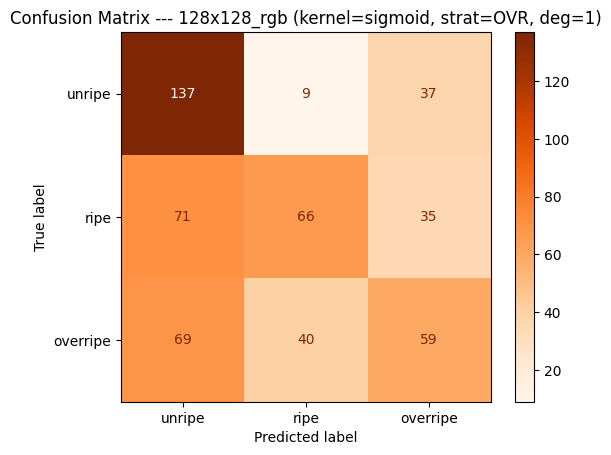


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_rgb\sigmoid\sigmoid_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_rgb\sigmoid\sigmoid_results_pairwise.csv


 Now running: 128x128_his

=== SVM (kernel=poly, degree=3, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8411    0.9836    0.9068       183
        ripe     0.7933    0.6919    0.7391       172
    overripe     0.7107    0.6726    0.6911       168

    accuracy                         0.7878       523
   macro avg     0.7817    0.7827    0.7790       523
weighted avg     0.7835    0.7878    0.7824       523



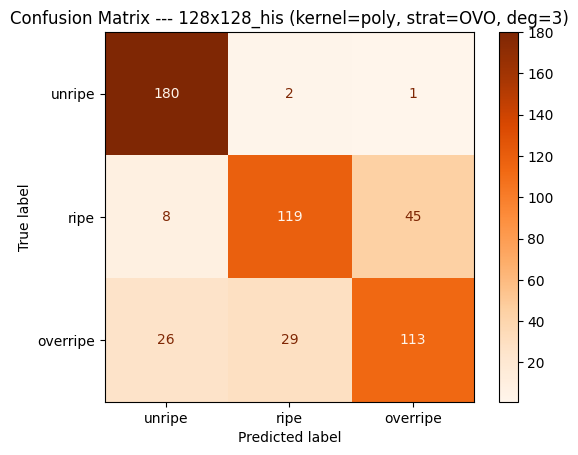


=== SVM (kernel=poly, degree=4, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.7521    0.9945    0.8565       183
        ripe     0.8611    0.5407    0.6643       172
    overripe     0.7225    0.7440    0.7331       168

    accuracy                         0.7648       523
   macro avg     0.7786    0.7598    0.7513       523
weighted avg     0.7784    0.7648    0.7536       523



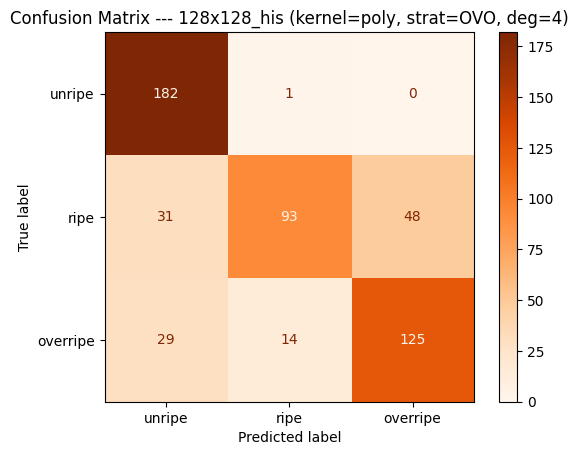


=== SVM (kernel=poly, degree=5, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.7298    0.9891    0.8399       183
        ripe     0.8713    0.5116    0.6447       172
    overripe     0.7299    0.7560    0.7427       168

    accuracy                         0.7572       523
   macro avg     0.7770    0.7522    0.7424       523
weighted avg     0.7764    0.7572    0.7445       523



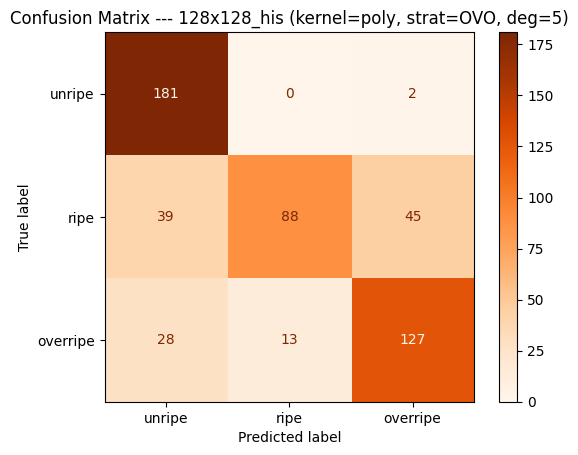


=== SVM (kernel=poly, degree=6, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6212    0.9945    0.7647       183
        ripe     0.8750    0.4884    0.6269       172
    overripe     0.7313    0.5833    0.6490       168

    accuracy                         0.6960       523
   macro avg     0.7425    0.6887    0.6802       523
weighted avg     0.7400    0.6960    0.6822       523



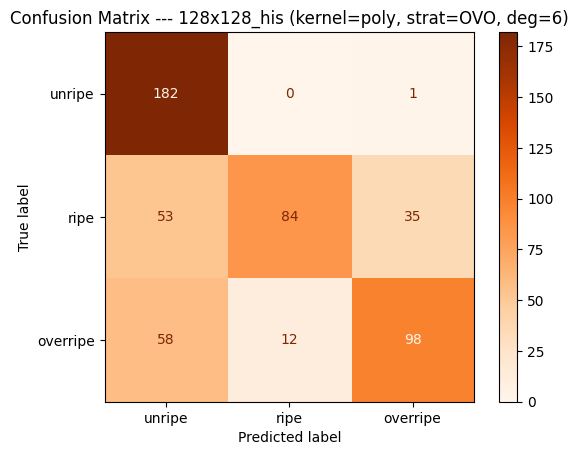


=== SVM (kernel=poly, degree=7, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5942    1.0000    0.7454       183
        ripe     0.8632    0.4767    0.6142       172
    overripe     0.7500    0.5357    0.6250       168

    accuracy                         0.6788       523
   macro avg     0.7358    0.6708    0.6615       523
weighted avg     0.7327    0.6788    0.6636       523



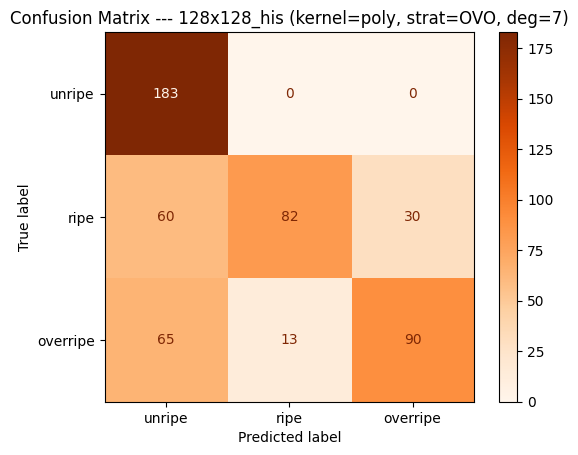


=== SVM (kernel=poly, degree=8, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5791    1.0000    0.7335       183
        ripe     0.8750    0.4477    0.5923       172
    overripe     0.7395    0.5238    0.6132       168

    accuracy                         0.6654       523
   macro avg     0.7312    0.6572    0.6463       523
weighted avg     0.7279    0.6654    0.6484       523



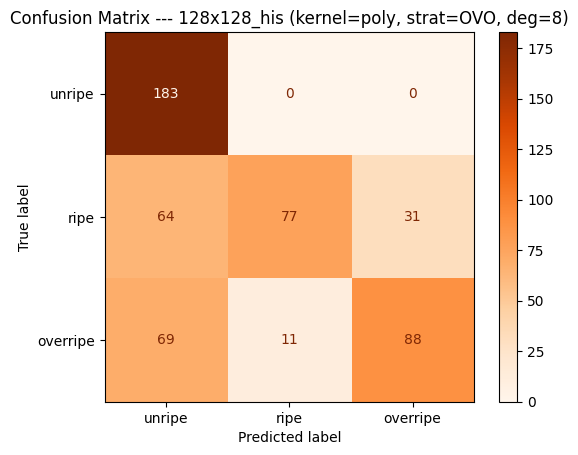


=== SVM (kernel=poly, degree=9, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5545    1.0000    0.7135       183
        ripe     0.8929    0.4360    0.5859       172
    overripe     0.7523    0.4881    0.5921       168

    accuracy                         0.6501       523
   macro avg     0.7332    0.6414    0.6305       523
weighted avg     0.7293    0.6501    0.6325       523



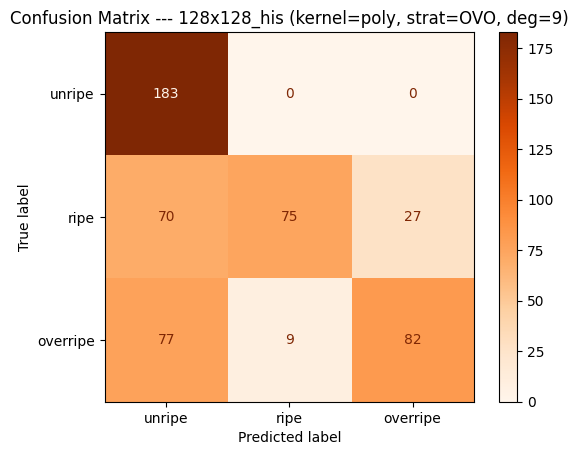


=== SVM (kernel=poly, degree=3, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8000    0.9836    0.8824       183
        ripe     0.7771    0.7093    0.7416       172
    overripe     0.7660    0.6429    0.6990       168

    accuracy                         0.7839       523
   macro avg     0.7810    0.7786    0.7743       523
weighted avg     0.7815    0.7839    0.7772       523



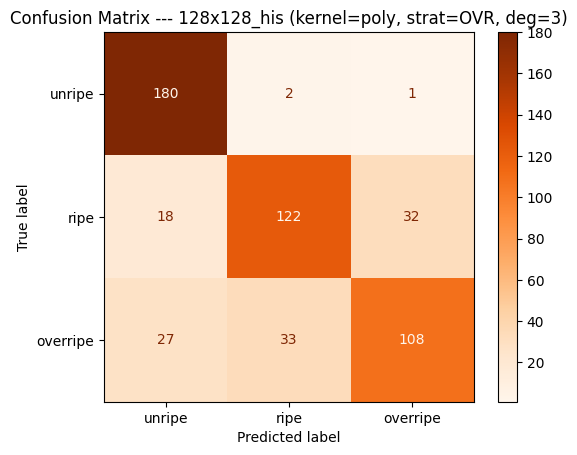


=== SVM (kernel=poly, degree=4, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7165    0.9945    0.8330       183
        ripe     0.8571    0.5930    0.7010       172
    overripe     0.8133    0.7262    0.7673       168

    accuracy                         0.7763       523
   macro avg     0.7957    0.7712    0.7671       523
weighted avg     0.7939    0.7763    0.7685       523



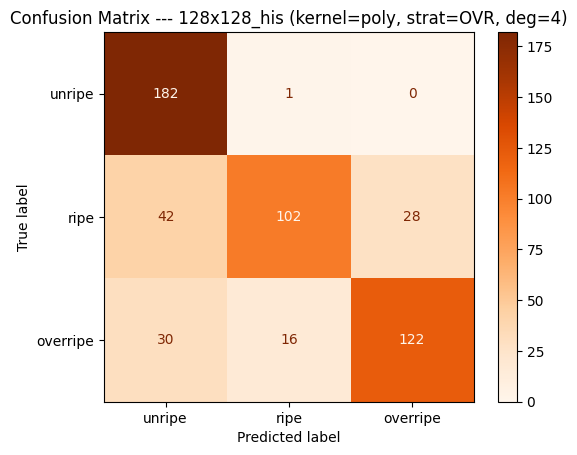


=== SVM (kernel=poly, degree=5, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7165    0.9945    0.8330       183
        ripe     0.8154    0.6163    0.7020       172
    overripe     0.8273    0.6845    0.7492       168

    accuracy                         0.7706       523
   macro avg     0.7864    0.7651    0.7614       523
weighted avg     0.7846    0.7706    0.7630       523



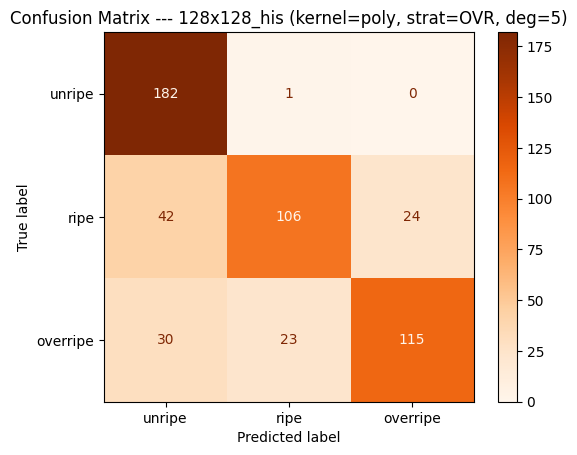


=== SVM (kernel=poly, degree=6, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6246    1.0000    0.7689       183
        ripe     0.8621    0.5814    0.6944       172
    overripe     0.8333    0.5655    0.6738       168

    accuracy                         0.7228       523
   macro avg     0.7733    0.7156    0.7124       523
weighted avg     0.7697    0.7228    0.7139       523



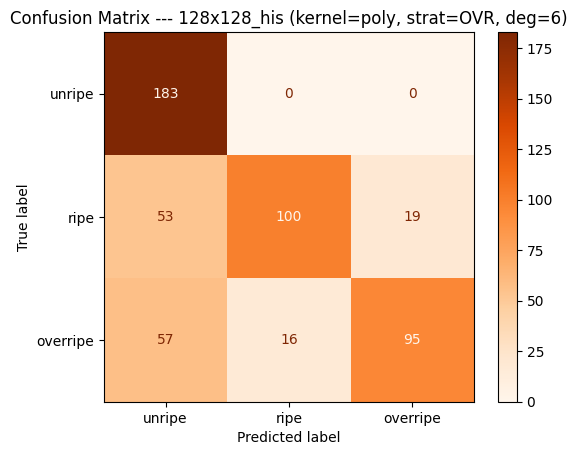


=== SVM (kernel=poly, degree=7, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6224    1.0000    0.7673       183
        ripe     0.8761    0.5756    0.6947       172
    overripe     0.8276    0.5714    0.6761       168

    accuracy                         0.7228       523
   macro avg     0.7754    0.7157    0.7127       523
weighted avg     0.7718    0.7228    0.7141       523



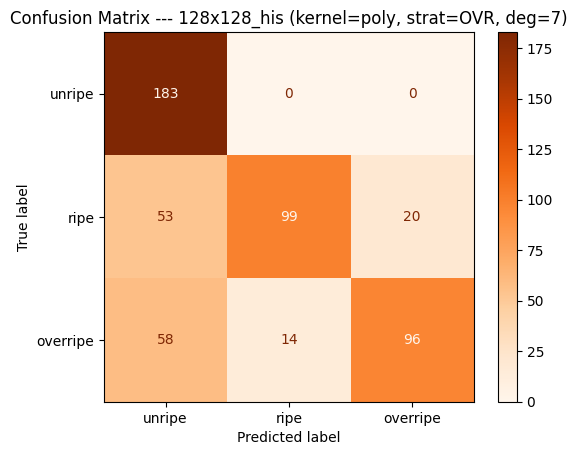


=== SVM (kernel=poly, degree=8, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.5942    1.0000    0.7454       183
        ripe     0.8750    0.5291    0.6594       172
    overripe     0.8108    0.5357    0.6452       168

    accuracy                         0.6960       523
   macro avg     0.7600    0.6883    0.6833       523
weighted avg     0.7561    0.6960    0.6849       523



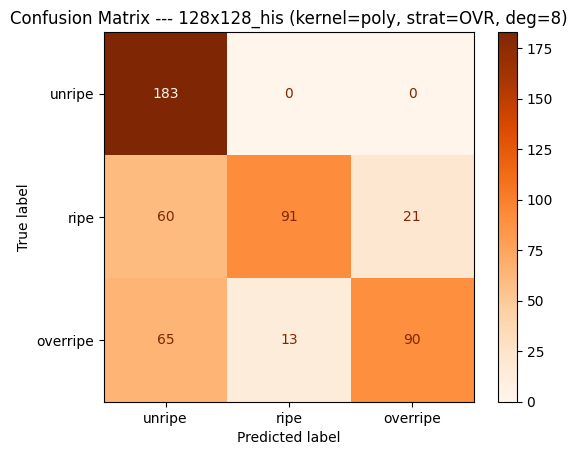


=== SVM (kernel=poly, degree=9, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.5961    1.0000    0.7469       183
        ripe     0.8839    0.5756    0.6972       172
    overripe     0.8558    0.5298    0.6544       168

    accuracy                         0.7094       523
   macro avg     0.7786    0.7018    0.6995       523
weighted avg     0.7742    0.7094    0.7009       523



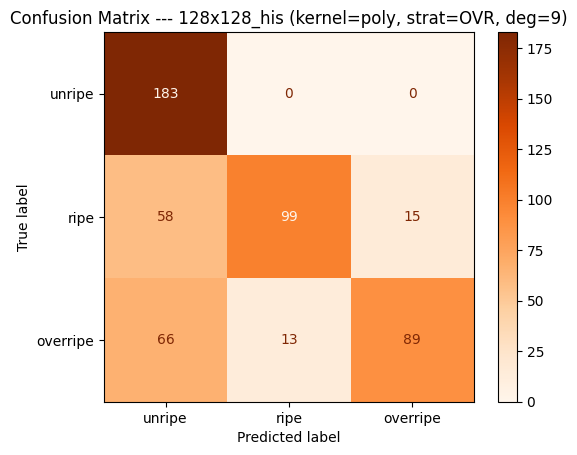


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_his\poly\poly_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_his\poly\poly_results_pairwise.csv


=== SVM (kernel=linear, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8713    0.9617    0.9143       183
        ripe     0.7442    0.7442    0.7442       172
    overripe     0.7248    0.6429    0.6814       168

    accuracy                         0.7878       523
   macro avg     0.7801    0.7829    0.7800       523
weighted avg     0.7824    0.7878    0.7835       523



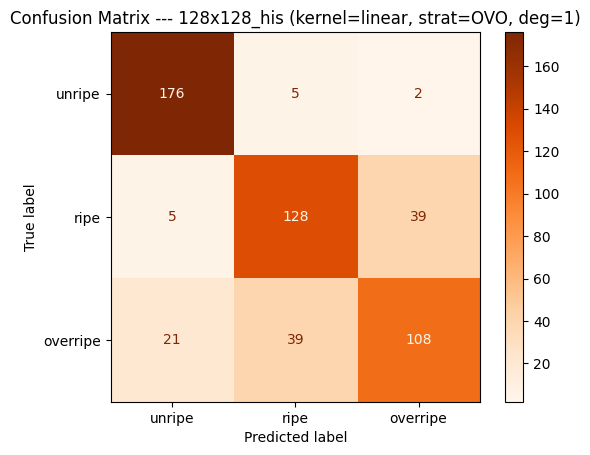


=== SVM (kernel=linear, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8502    0.9617    0.9026       183
        ripe     0.7472    0.7733    0.7600       172
    overripe     0.7319    0.6012    0.6601       168

    accuracy                         0.7839       523
   macro avg     0.7764    0.7787    0.7742       523
weighted avg     0.7783    0.7839    0.7778       523



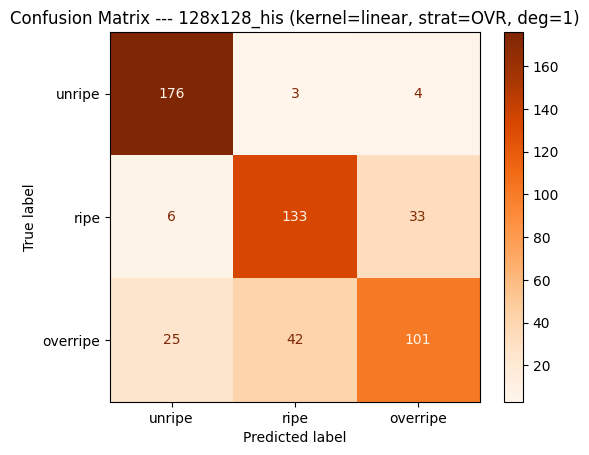


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_his\linear\linear_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_his\linear\linear_results_pairwise.csv


=== SVM (kernel=rbf, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8738    0.9836    0.9254       183
        ripe     0.8150    0.8198    0.8174       172
    overripe     0.8056    0.6905    0.7436       168

    accuracy                         0.8356       523
   macro avg     0.8315    0.8313    0.8288       523
weighted avg     0.8325    0.8356    0.8315       523



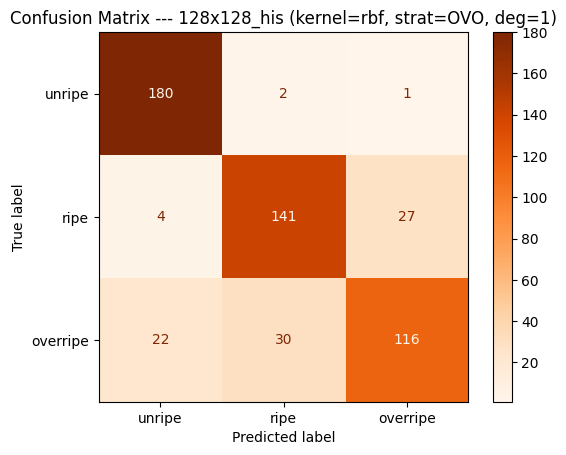


=== SVM (kernel=rbf, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8689    0.9781    0.9203       183
        ripe     0.8253    0.7965    0.8107       172
    overripe     0.7815    0.7024    0.7398       168

    accuracy                         0.8298       523
   macro avg     0.8252    0.8257    0.8236       523
weighted avg     0.8265    0.8298    0.8263       523



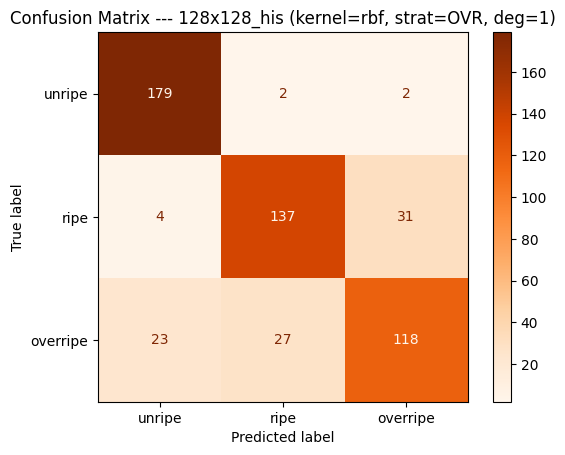


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_his\rbf\rbf_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_his\rbf\rbf_results_pairwise.csv


=== SVM (kernel=sigmoid, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.7680    0.7596    0.7637       183
        ripe     0.5585    0.6105    0.5833       172
    overripe     0.5455    0.5000    0.5217       168

    accuracy                         0.6272       523
   macro avg     0.6240    0.6233    0.6229       523
weighted avg     0.6276    0.6272    0.6267       523



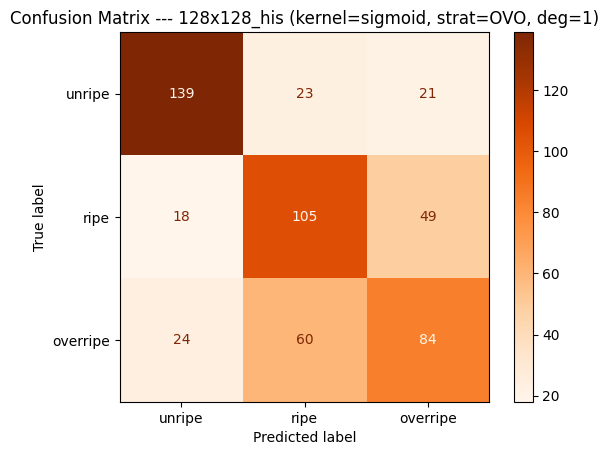


=== SVM (kernel=sigmoid, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6157    0.8142    0.7012       183
        ripe     0.6772    0.6221    0.6485       172
    overripe     0.6179    0.4524    0.5223       168

    accuracy                         0.6348       523
   macro avg     0.6369    0.6296    0.6240       523
weighted avg     0.6366    0.6348    0.6264       523



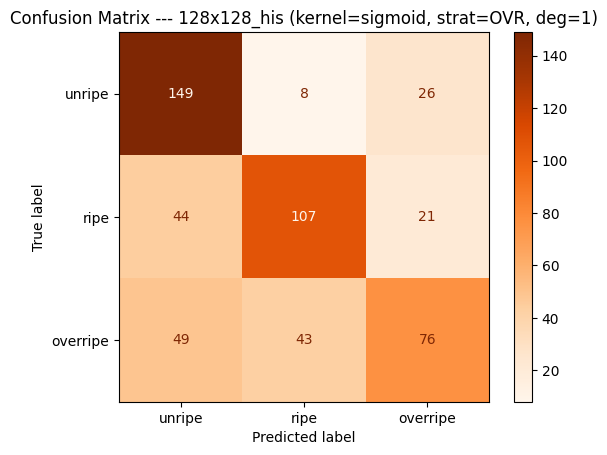


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_his\sigmoid\sigmoid_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_his\sigmoid\sigmoid_results_pairwise.csv


 Now running: 128x128_lab

=== SVM (kernel=poly, degree=3, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.9194    0.9344    0.9268       183
        ripe     0.8447    0.7907    0.8168       172
    overripe     0.7443    0.7798    0.7616       168

    accuracy                         0.8375       523
   macro avg     0.8361    0.8350    0.8351       523
weighted avg     0.8386    0.8375    0.8376       523



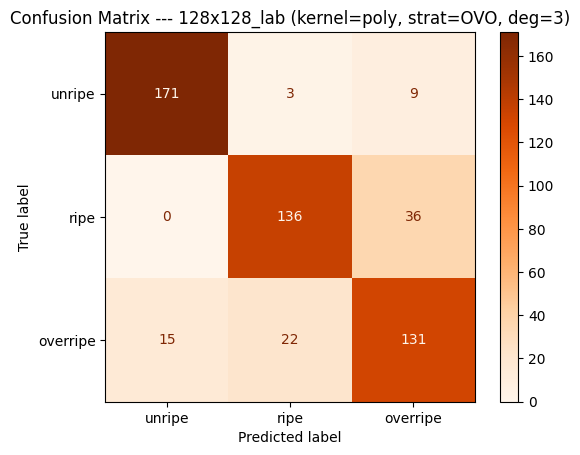


=== SVM (kernel=poly, degree=4, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8209    0.9016    0.8594       183
        ripe     0.7087    0.8488    0.7725       172
    overripe     0.8276    0.5714    0.6761       168

    accuracy                         0.7782       523
   macro avg     0.7857    0.7740    0.7693       523
weighted avg     0.7862    0.7782    0.7719       523



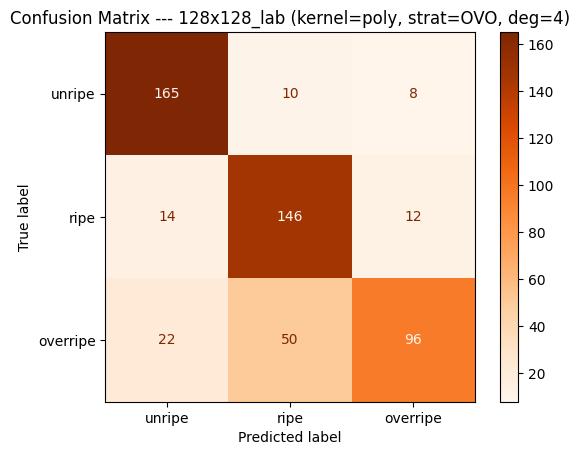


=== SVM (kernel=poly, degree=5, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.9302    0.8743    0.9014       183
        ripe     0.8142    0.8663    0.8394       172
    overripe     0.7976    0.7976    0.7976       168

    accuracy                         0.8470       523
   macro avg     0.8474    0.8461    0.8462       523
weighted avg     0.8495    0.8470    0.8477       523



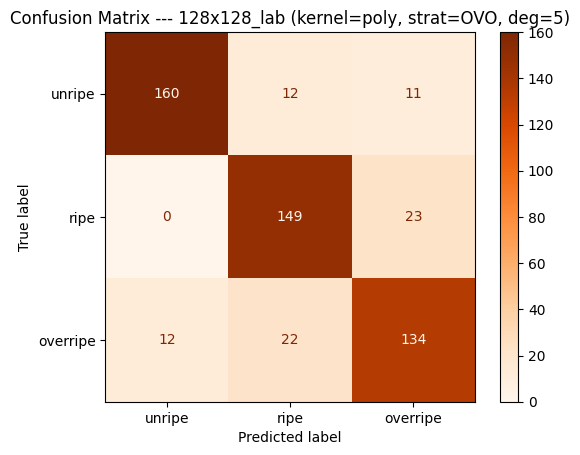


=== SVM (kernel=poly, degree=6, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8342    0.8798    0.8564       183
        ripe     0.6623    0.8895    0.7593       172
    overripe     0.8687    0.5119    0.6442       168

    accuracy                         0.7648       523
   macro avg     0.7884    0.7604    0.7533       523
weighted avg     0.7888    0.7648    0.7563       523



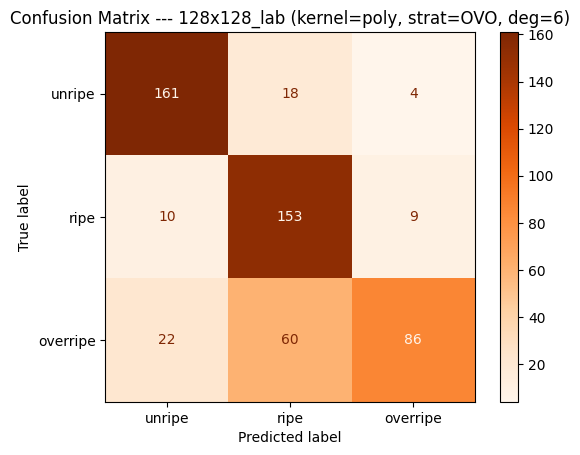


=== SVM (kernel=poly, degree=7, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.9112    0.8415    0.8750       183
        ripe     0.6352    0.9012    0.7452       172
    overripe     0.8273    0.5417    0.6547       168

    accuracy                         0.7648       523
   macro avg     0.7913    0.7615    0.7583       523
weighted avg     0.7935    0.7648    0.7615       523



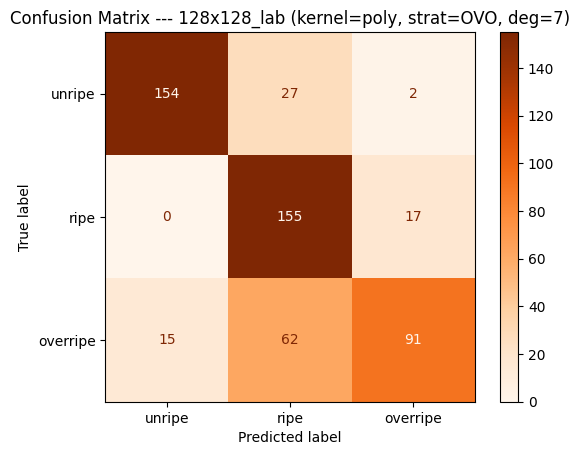


=== SVM (kernel=poly, degree=8, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6286    0.9617    0.7603       183
        ripe     0.7727    0.6919    0.7301       172
    overripe     0.8764    0.4643    0.6070       168

    accuracy                         0.7132       523
   macro avg     0.7592    0.7060    0.6991       523
weighted avg     0.7556    0.7132    0.7011       523



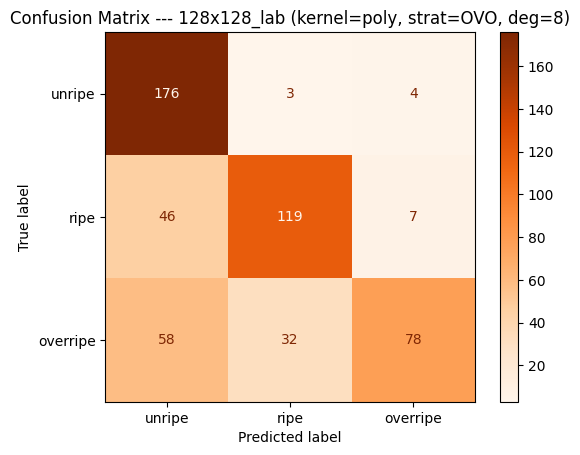


=== SVM (kernel=poly, degree=9, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.7236    0.9727    0.8298       183
        ripe     0.7838    0.8430    0.8123       172
    overripe     0.8913    0.4881    0.6308       168

    accuracy                         0.7744       523
   macro avg     0.7996    0.7679    0.7576       523
weighted avg     0.7973    0.7744    0.7601       523



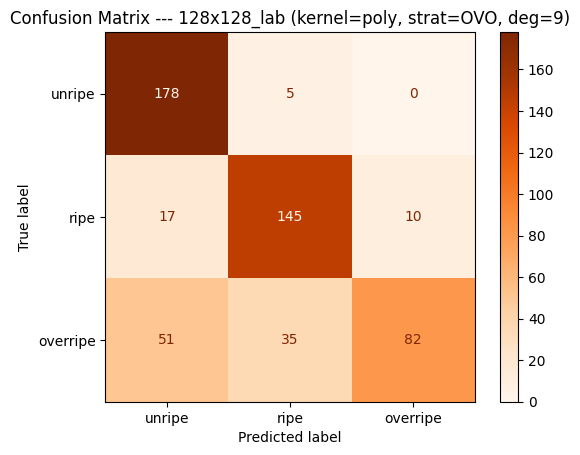


=== SVM (kernel=poly, degree=3, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8592    0.9672    0.9100       183
        ripe     0.8343    0.8488    0.8415       172
    overripe     0.8099    0.6845    0.7419       168

    accuracy                         0.8375       523
   macro avg     0.8345    0.8335    0.8312       523
weighted avg     0.8352    0.8375    0.8335       523



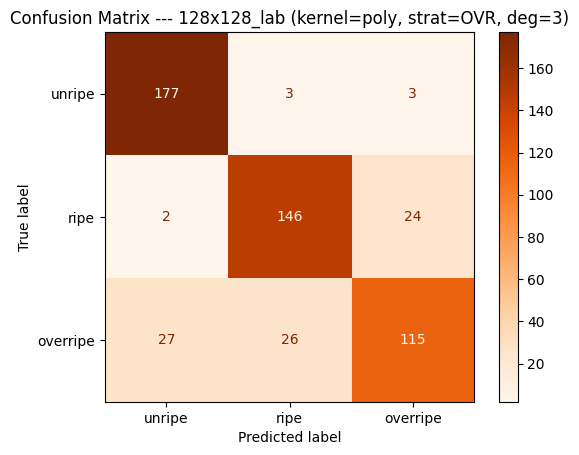


=== SVM (kernel=poly, degree=4, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7675    0.9563    0.8516       183
        ripe     0.7667    0.8023    0.7841       172
    overripe     0.8522    0.5833    0.6926       168

    accuracy                         0.7859       523
   macro avg     0.7955    0.7806    0.7761       523
weighted avg     0.7944    0.7859    0.7783       523



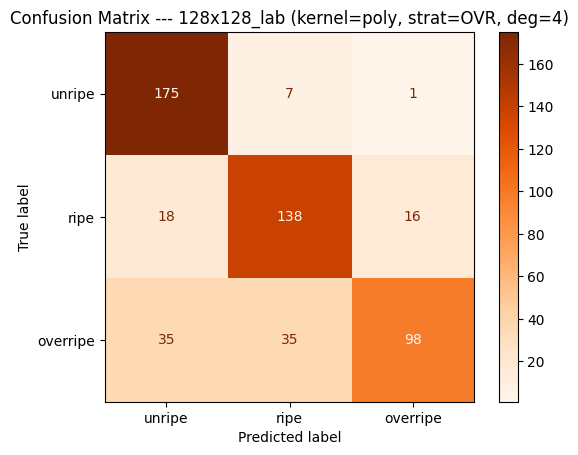


=== SVM (kernel=poly, degree=5, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8706    0.9563    0.9115       183
        ripe     0.8457    0.8605    0.8530       172
    overripe     0.8299    0.7262    0.7746       168

    accuracy                         0.8509       523
   macro avg     0.8488    0.8476    0.8464       523
weighted avg     0.8494    0.8509    0.8483       523



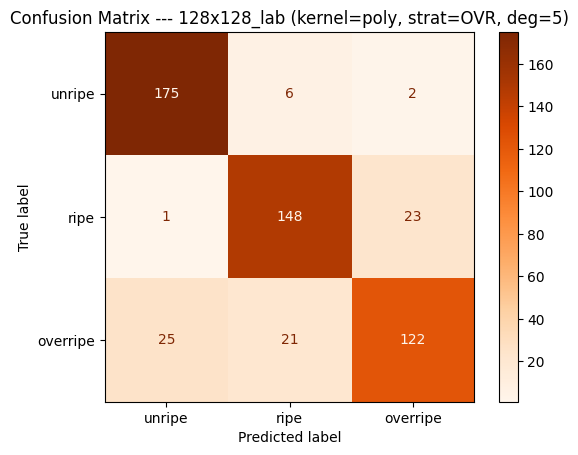


=== SVM (kernel=poly, degree=6, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7900    0.9454    0.8607       183
        ripe     0.7901    0.8314    0.8102       172
    overripe     0.8618    0.6310    0.7285       168

    accuracy                         0.8069       523
   macro avg     0.8139    0.8026    0.7998       523
weighted avg     0.8131    0.8069    0.8016       523



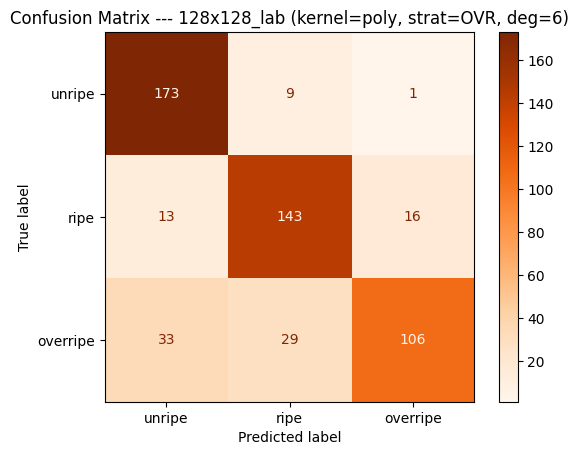


=== SVM (kernel=poly, degree=7, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7928    0.9617    0.8691       183
        ripe     0.8303    0.7965    0.8131       172
    overripe     0.7941    0.6429    0.7105       168

    accuracy                         0.8050       523
   macro avg     0.8057    0.8004    0.7976       523
weighted avg     0.8056    0.8050    0.7997       523



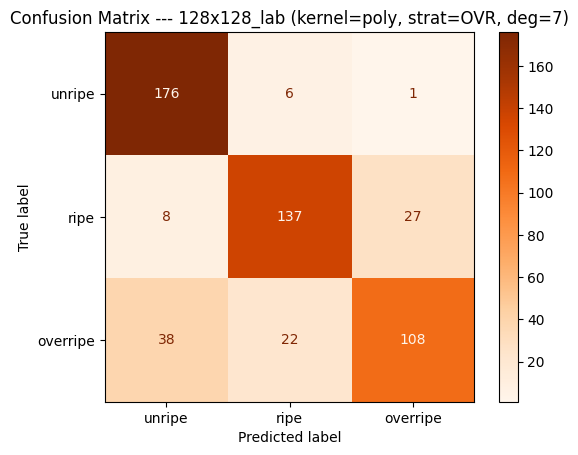


=== SVM (kernel=poly, degree=8, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7934    0.9235    0.8535       183
        ripe     0.7759    0.7849    0.7803       172
    overripe     0.7868    0.6369    0.7039       168

    accuracy                         0.7859       523
   macro avg     0.7854    0.7818    0.7793       523
weighted avg     0.7855    0.7859    0.7814       523



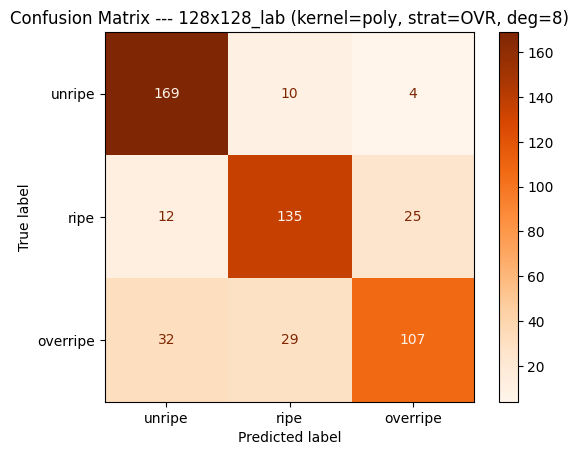


=== SVM (kernel=poly, degree=9, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7137    0.9672    0.8213       183
        ripe     0.8357    0.6802    0.7500       172
    overripe     0.7630    0.6131    0.6799       168

    accuracy                         0.7591       523
   macro avg     0.7708    0.7535    0.7504       523
weighted avg     0.7697    0.7591    0.7524       523



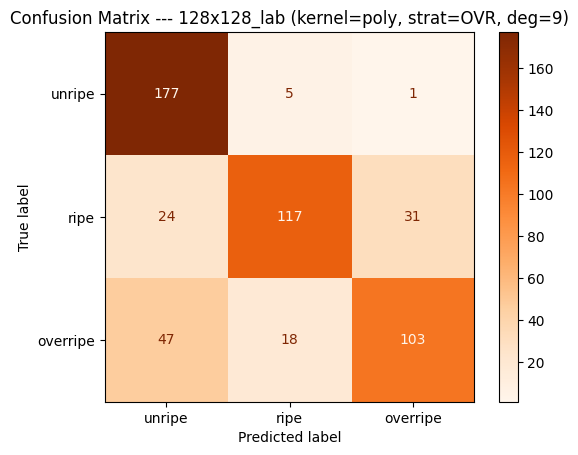


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_lab\poly\poly_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_lab\poly\poly_results_pairwise.csv


=== SVM (kernel=linear, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.9048    0.9344    0.9194       183
        ripe     0.6557    0.6977    0.6761       172
    overripe     0.6159    0.5536    0.5831       168

    accuracy                         0.7342       523
   macro avg     0.7255    0.7286    0.7262       523
weighted avg     0.7301    0.7342    0.7313       523



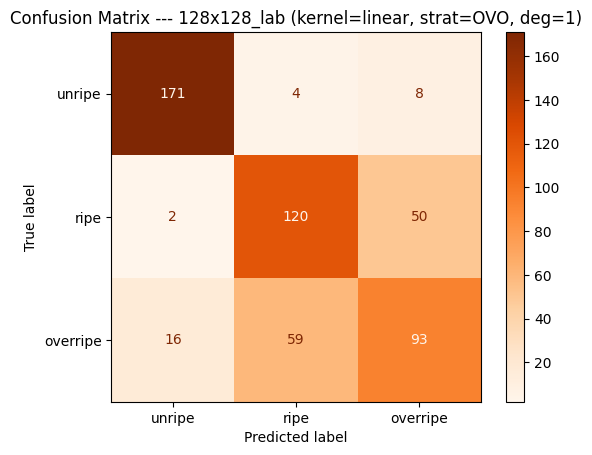


=== SVM (kernel=linear, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8488    0.9508    0.8969       183
        ripe     0.7056    0.7384    0.7216       172
    overripe     0.6739    0.5536    0.6078       168

    accuracy                         0.7533       523
   macro avg     0.7427    0.7476    0.7421       523
weighted avg     0.7455    0.7533    0.7464       523



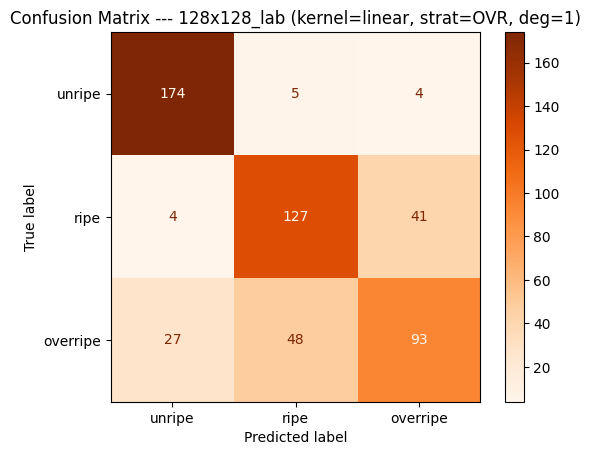


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_lab\linear\linear_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_lab\linear\linear_results_pairwise.csv


=== SVM (kernel=rbf, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8980    0.9617    0.9288       183
        ripe     0.8261    0.8837    0.8539       172
    overripe     0.8531    0.7262    0.7846       168

    accuracy                         0.8604       523
   macro avg     0.8591    0.8572    0.8558       523
weighted avg     0.8599    0.8604    0.8578       523



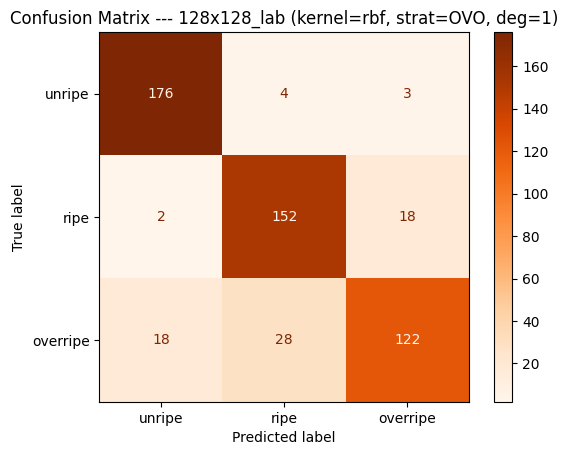


=== SVM (kernel=rbf, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8974    0.9563    0.9259       183
        ripe     0.8201    0.9012    0.8587       172
    overripe     0.8705    0.7202    0.7883       168

    accuracy                         0.8623       523
   macro avg     0.8627    0.8592    0.8576       523
weighted avg     0.8634    0.8623    0.8596       523



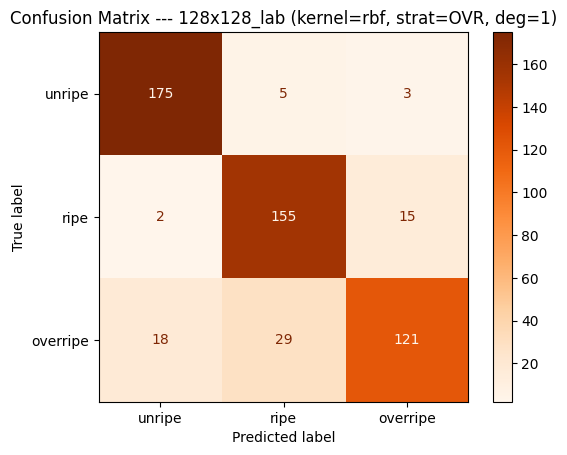


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_lab\rbf\rbf_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_lab\rbf\rbf_results_pairwise.csv


=== SVM (kernel=sigmoid, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8193    0.7432    0.7794       183
        ripe     0.5833    0.6105    0.5966       172
    overripe     0.3955    0.4167    0.4058       168

    accuracy                         0.5946       523
   macro avg     0.5994    0.5901    0.5939       523
weighted avg     0.6055    0.5946    0.5993       523



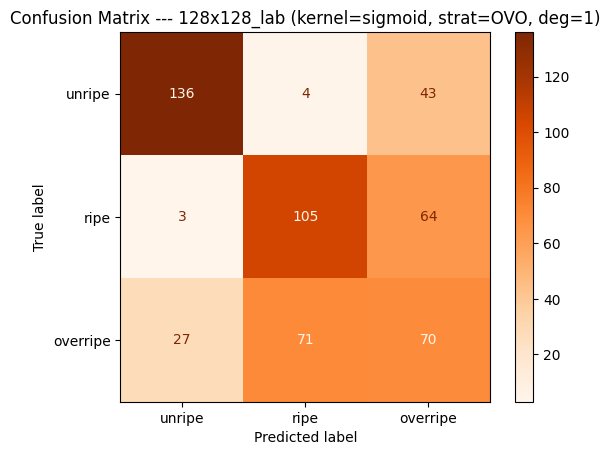


=== SVM (kernel=sigmoid, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7430    0.7268    0.7348       183
        ripe     0.5312    0.5930    0.5604       172
    overripe     0.3816    0.3452    0.3625       168

    accuracy                         0.5602       523
   macro avg     0.5519    0.5550    0.5526       523
weighted avg     0.5573    0.5602    0.5579       523



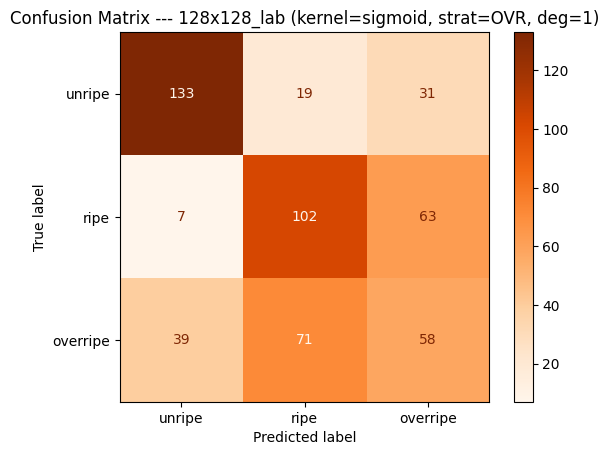


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_lab\sigmoid\sigmoid_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_lab\sigmoid\sigmoid_results_pairwise.csv


 Now running: 128x128_glcm

=== SVM (kernel=poly, degree=3, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.7564    0.9672    0.8489       183
        ripe     0.8333    0.5523    0.6643       172
    overripe     0.6914    0.7202    0.7055       168

    accuracy                         0.7514       523
   macro avg     0.7604    0.7466    0.7396       523
weighted avg     0.7608    0.7514    0.7422       523



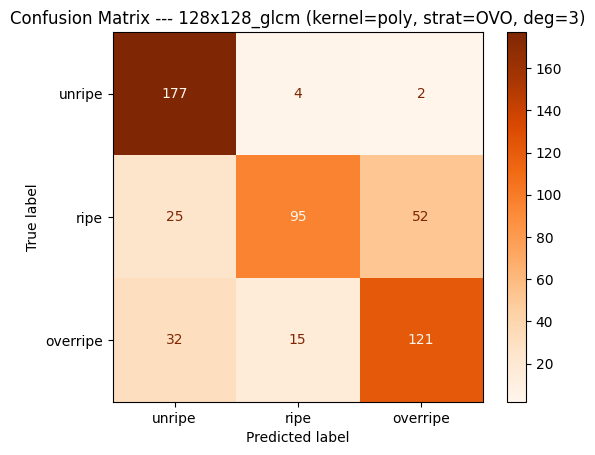


=== SVM (kernel=poly, degree=4, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6232    0.9672    0.7580       183
        ripe     0.8788    0.5058    0.6421       172
    overripe     0.7429    0.6190    0.6753       168

    accuracy                         0.7036       523
   macro avg     0.7483    0.6974    0.6918       523
weighted avg     0.7457    0.7036    0.6933       523



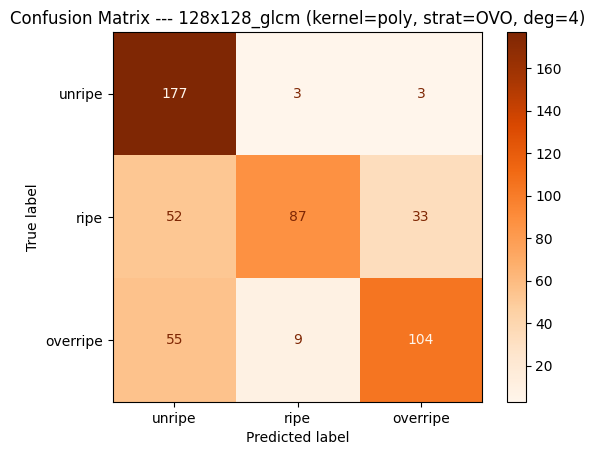


=== SVM (kernel=poly, degree=5, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6486    0.9781    0.7800       183
        ripe     0.8062    0.6047    0.6910       172
    overripe     0.7797    0.5476    0.6434       168

    accuracy                         0.7170       523
   macro avg     0.7448    0.7101    0.7048       523
weighted avg     0.7425    0.7170    0.7068       523



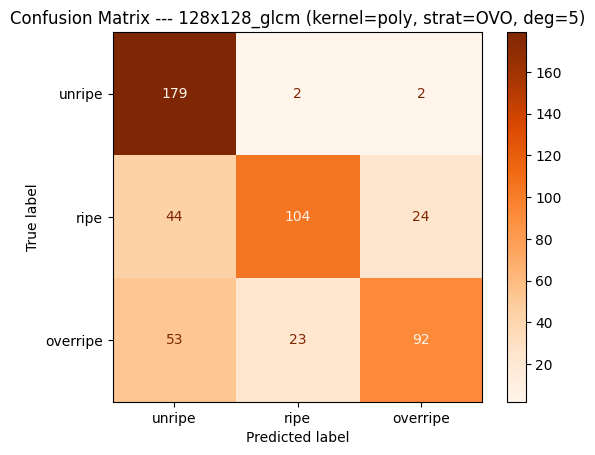


=== SVM (kernel=poly, degree=6, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5515    0.9945    0.7096       183
        ripe     0.8901    0.4709    0.6160       172
    overripe     0.8235    0.5000    0.6222       168

    accuracy                         0.6635       523
   macro avg     0.7551    0.6552    0.6492       523
weighted avg     0.7502    0.6635    0.6507       523



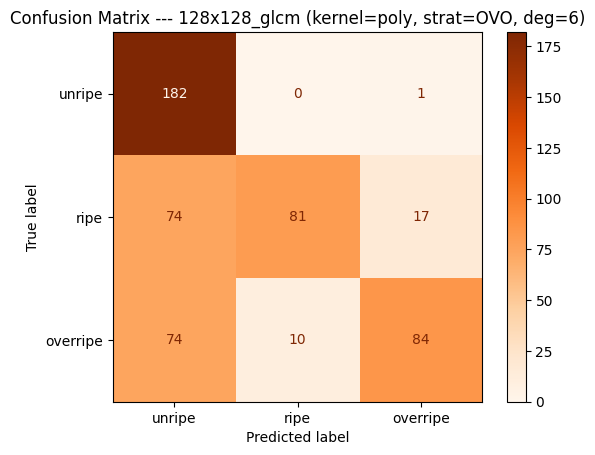


=== SVM (kernel=poly, degree=7, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5460    0.9727    0.6994       183
        ripe     0.7456    0.4942    0.5944       172
    overripe     0.7952    0.3929    0.5259       168

    accuracy                         0.6291       523
   macro avg     0.6956    0.6199    0.6066       523
weighted avg     0.6917    0.6291    0.6091       523



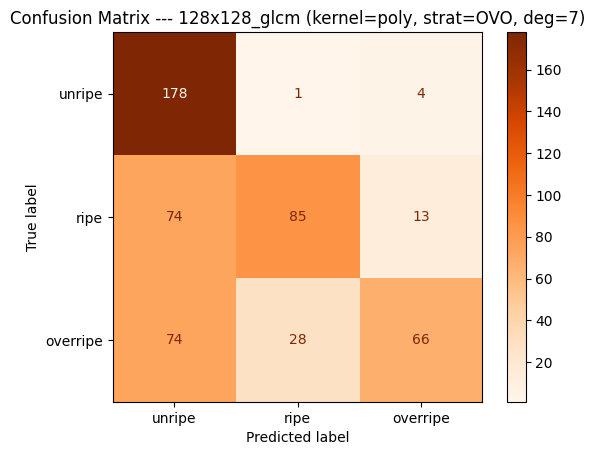


=== SVM (kernel=poly, degree=8, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5263    0.9836    0.6857       183
        ripe     0.8269    0.5000    0.6232       172
    overripe     0.8442    0.3869    0.5306       168

    accuracy                         0.6329       523
   macro avg     0.7325    0.6235    0.6132       523
weighted avg     0.7273    0.6329    0.6153       523



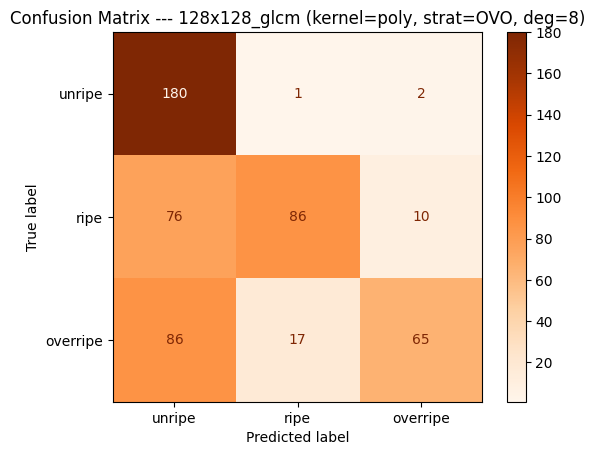


=== SVM (kernel=poly, degree=9, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.5235    0.9727    0.6807       183
        ripe     0.7685    0.4826    0.5929       172
    overripe     0.7867    0.3512    0.4856       168

    accuracy                         0.6119       523
   macro avg     0.6929    0.6021    0.5864       523
weighted avg     0.6886    0.6119    0.5891       523



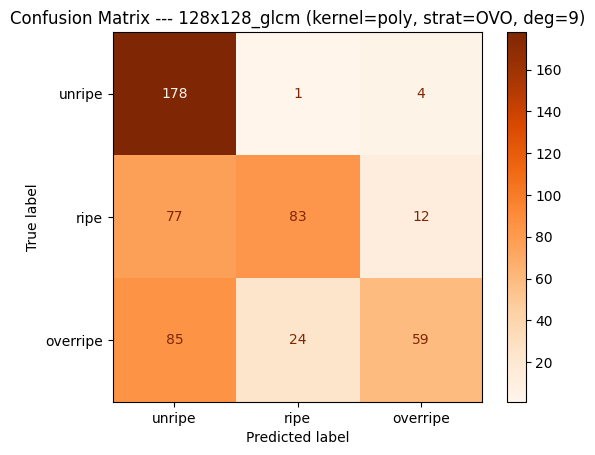


=== SVM (kernel=poly, degree=3, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7325    0.9727    0.8357       183
        ripe     0.8268    0.6105    0.7023       172
    overripe     0.7386    0.6726    0.7040       168

    accuracy                         0.7572       523
   macro avg     0.7659    0.7519    0.7474       523
weighted avg     0.7655    0.7572    0.7495       523



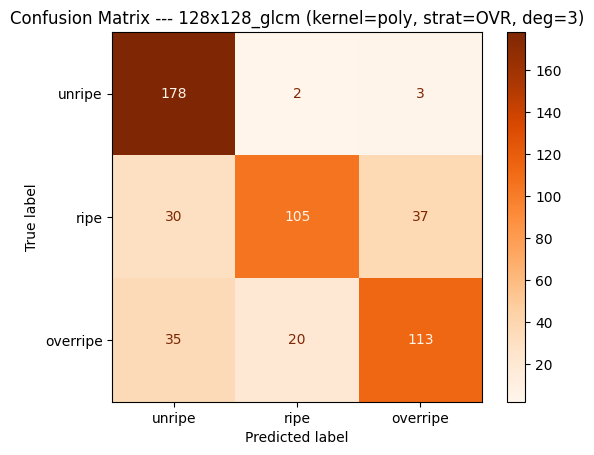


=== SVM (kernel=poly, degree=4, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6769    0.9617    0.7946       183
        ripe     0.8684    0.5756    0.6923       172
    overripe     0.7651    0.6786    0.7192       168

    accuracy                         0.7438       523
   macro avg     0.7701    0.7386    0.7354       523
weighted avg     0.7682    0.7438    0.7367       523



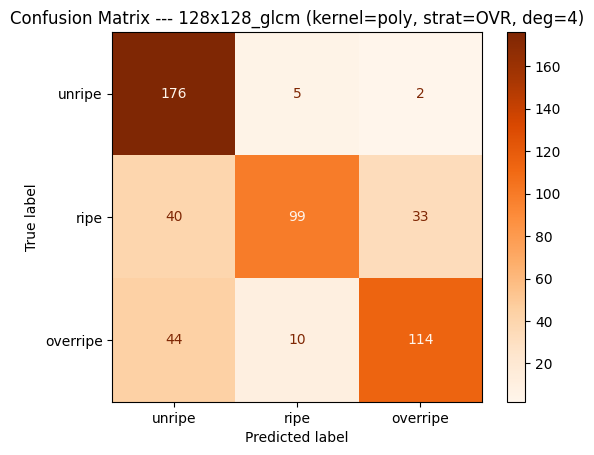


=== SVM (kernel=poly, degree=5, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6522    0.9836    0.7843       183
        ripe     0.8673    0.5698    0.6877       172
    overripe     0.7612    0.6071    0.6755       168

    accuracy                         0.7266       523
   macro avg     0.7602    0.7202    0.7158       523
weighted avg     0.7579    0.7266    0.7176       523



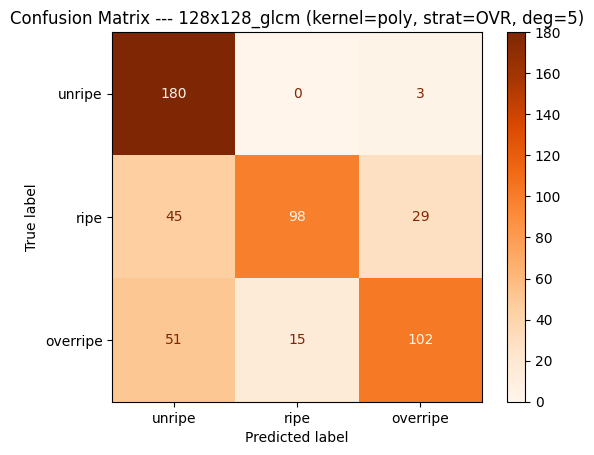


=== SVM (kernel=poly, degree=6, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6507    0.9672    0.7780       183
        ripe     0.8803    0.5988    0.7128       172
    overripe     0.7910    0.6310    0.7020       168

    accuracy                         0.7380       523
   macro avg     0.7740    0.7323    0.7309       523
weighted avg     0.7713    0.7380    0.7321       523



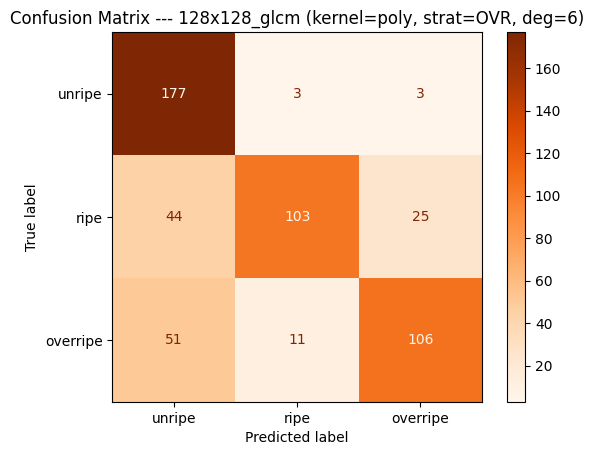


=== SVM (kernel=poly, degree=7, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6272    0.9836    0.7660       183
        ripe     0.9048    0.5523    0.6859       172
    overripe     0.7786    0.6071    0.6823       168

    accuracy                         0.7208       523
   macro avg     0.7702    0.7144    0.7114       523
weighted avg     0.7671    0.7208    0.7128       523



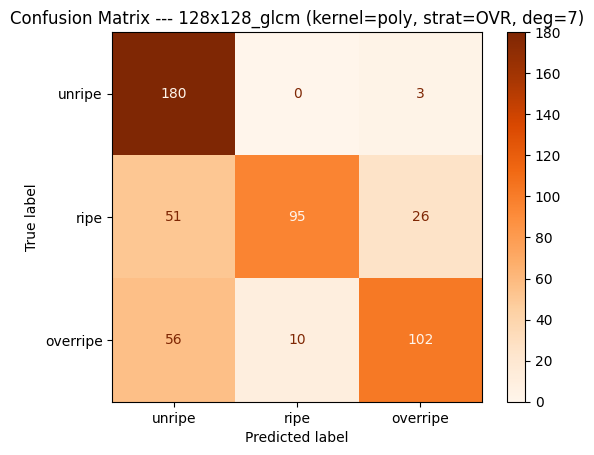


=== SVM (kernel=poly, degree=8, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6151    0.9781    0.7553       183
        ripe     0.8684    0.5756    0.6923       172
    overripe     0.8136    0.5714    0.6713       168

    accuracy                         0.7151       523
   macro avg     0.7657    0.7084    0.7063       523
weighted avg     0.7622    0.7151    0.7076       523



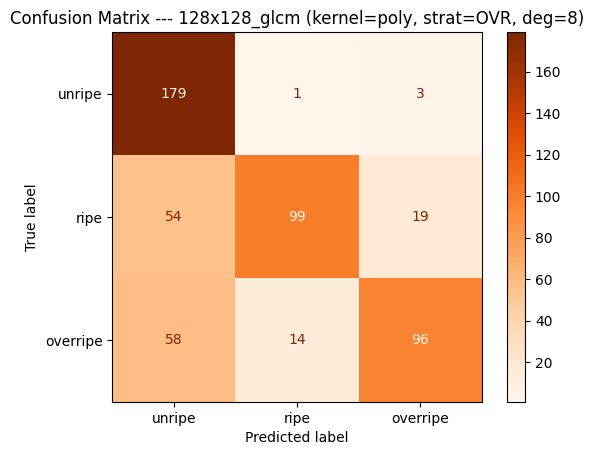


=== SVM (kernel=poly, degree=9, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.5973    0.9727    0.7401       183
        ripe     0.8796    0.5523    0.6786       172
    overripe     0.7949    0.5536    0.6526       168

    accuracy                         0.6998       523
   macro avg     0.7573    0.6929    0.6904       523
weighted avg     0.7536    0.6998    0.6918       523



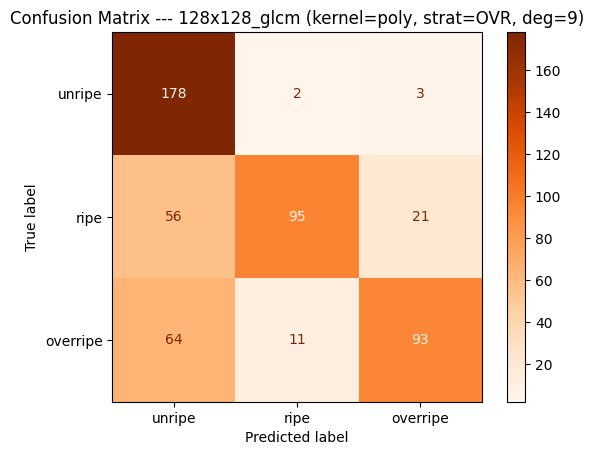


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_glcm\poly\poly_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_glcm\poly\poly_results_pairwise.csv


=== SVM (kernel=linear, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.7854    0.9399    0.8557       183
        ripe     0.8231    0.6221    0.7086       172
    overripe     0.7011    0.7262    0.7135       168

    accuracy                         0.7667       523
   macro avg     0.7699    0.7627    0.7593       523
weighted avg     0.7707    0.7667    0.7616       523



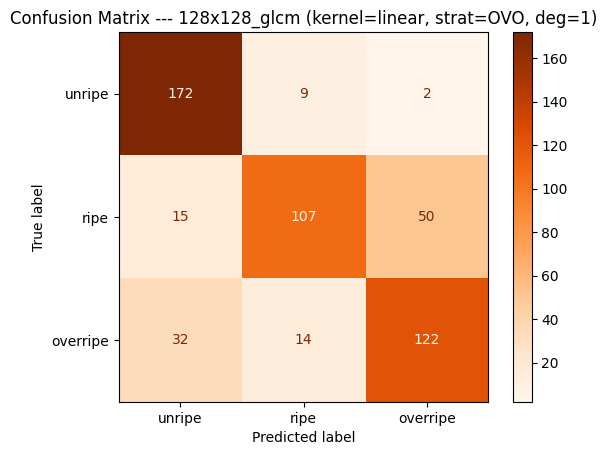


=== SVM (kernel=linear, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7788    0.9235    0.8450       183
        ripe     0.7956    0.6337    0.7055       172
    overripe     0.7160    0.7202    0.7181       168

    accuracy                         0.7629       523
   macro avg     0.7635    0.7592    0.7562       523
weighted avg     0.7642    0.7629    0.7584       523



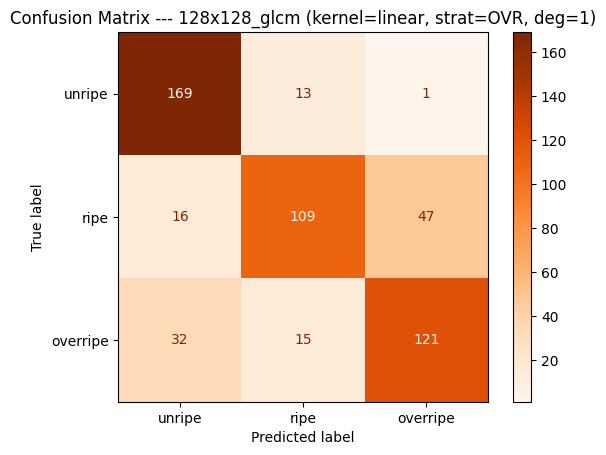


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_glcm\linear\linear_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_glcm\linear\linear_results_pairwise.csv


=== SVM (kernel=rbf, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8230    0.9399    0.8776       183
        ripe     0.8478    0.6802    0.7548       172
    overripe     0.7330    0.7679    0.7500       168

    accuracy                         0.7992       523
   macro avg     0.8012    0.7960    0.7941       523
weighted avg     0.8022    0.7992    0.7962       523



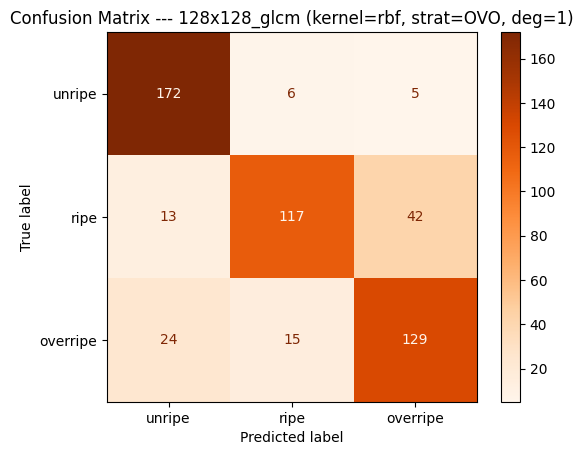


=== SVM (kernel=rbf, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8134    0.9290    0.8673       183
        ripe     0.8369    0.6860    0.7540       172
    overripe     0.7457    0.7679    0.7566       168

    accuracy                         0.7973       523
   macro avg     0.7986    0.7943    0.7926       523
weighted avg     0.7994    0.7973    0.7945       523



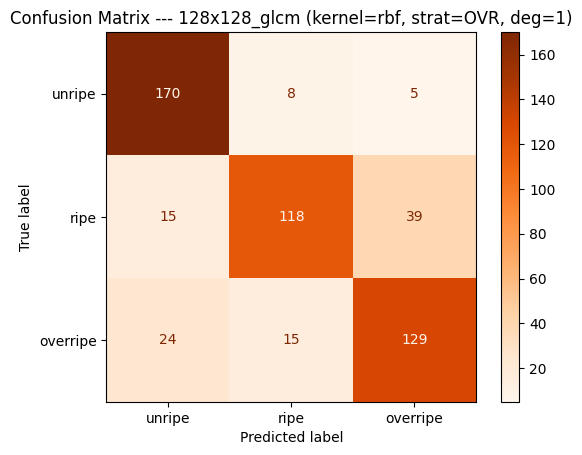


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_glcm\rbf\rbf_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_glcm\rbf\rbf_results_pairwise.csv


=== SVM (kernel=sigmoid, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6915    0.7596    0.7240       183
        ripe     0.5583    0.3895    0.4589       172
    overripe     0.4356    0.5238    0.4757       168

    accuracy                         0.5621       523
   macro avg     0.5618    0.5576    0.5528       523
weighted avg     0.5655    0.5621    0.5570       523



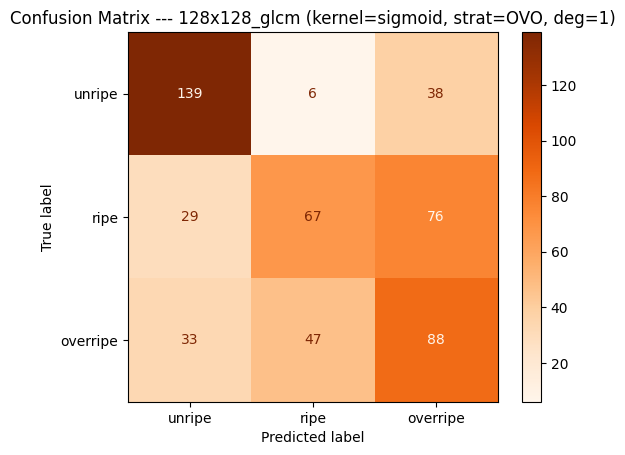


=== SVM (kernel=sigmoid, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6394    0.7268    0.6803       183
        ripe     0.5746    0.4477    0.5033       172
    overripe     0.4144    0.4464    0.4298       168

    accuracy                         0.5449       523
   macro avg     0.5428    0.5403    0.5378       523
weighted avg     0.5458    0.5449    0.5416       523



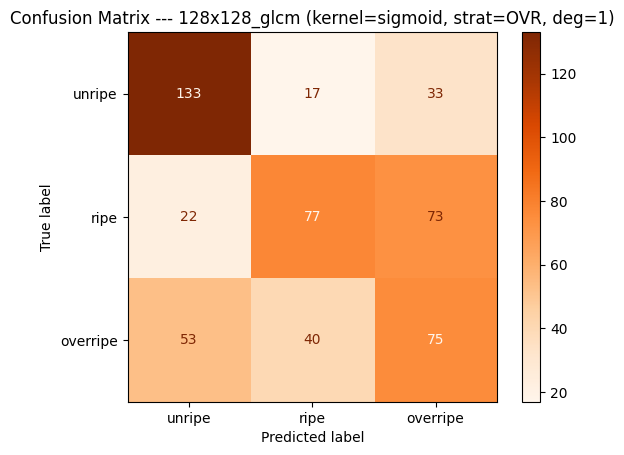


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_glcm\sigmoid\sigmoid_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_glcm\sigmoid\sigmoid_results_pairwise.csv


 Now running: 128x128_lbp

=== SVM (kernel=poly, degree=3, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8621    0.8197    0.8403       183
        ripe     0.8818    0.5640    0.6879       172
    overripe     0.6151    0.8750    0.7224       168

    accuracy                         0.7533       523
   macro avg     0.7863    0.7529    0.7502       523
weighted avg     0.7892    0.7533    0.7523       523



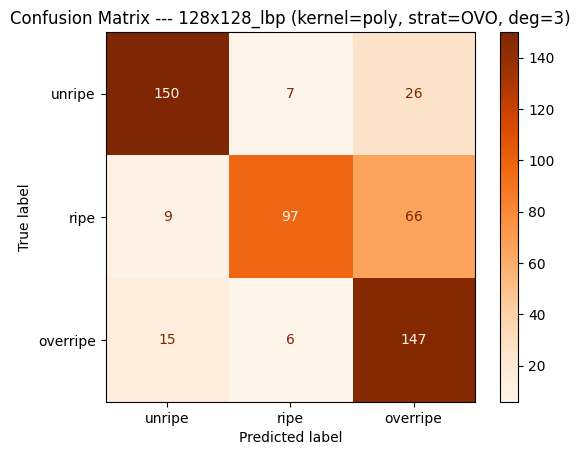


=== SVM (kernel=poly, degree=4, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.7267    0.6393    0.6802       183
        ripe     0.8280    0.4477    0.5811       172
    overripe     0.5502    0.8810    0.6773       168

    accuracy                         0.6539       523
   macro avg     0.7016    0.6560    0.6462       523
weighted avg     0.7033    0.6539    0.6467       523



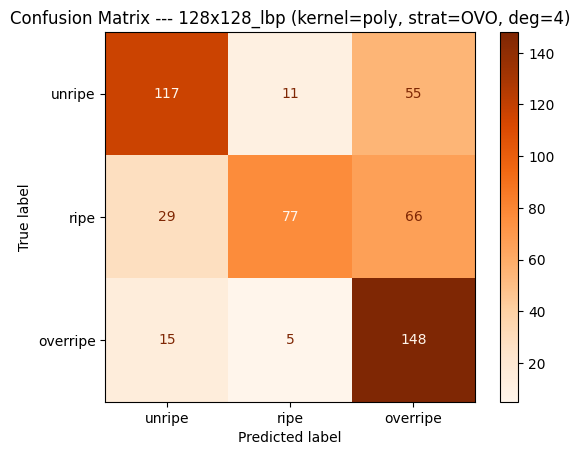


=== SVM (kernel=poly, degree=5, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8943    0.6011    0.7190       183
        ripe     0.8765    0.4128    0.5613       172
    overripe     0.5016    0.9524    0.6571       168

    accuracy                         0.6520       523
   macro avg     0.7575    0.6554    0.6458       523
weighted avg     0.7623    0.6520    0.6472       523



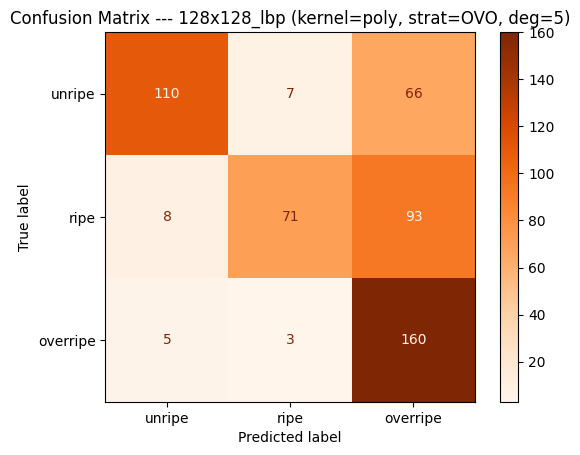


=== SVM (kernel=poly, degree=6, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6930    0.4317    0.5320       183
        ripe     0.7805    0.3721    0.5039       172
    overripe     0.4832    0.9405    0.6384       168

    accuracy                         0.5755       523
   macro avg     0.6522    0.5814    0.5581       523
weighted avg     0.6544    0.5755    0.5569       523



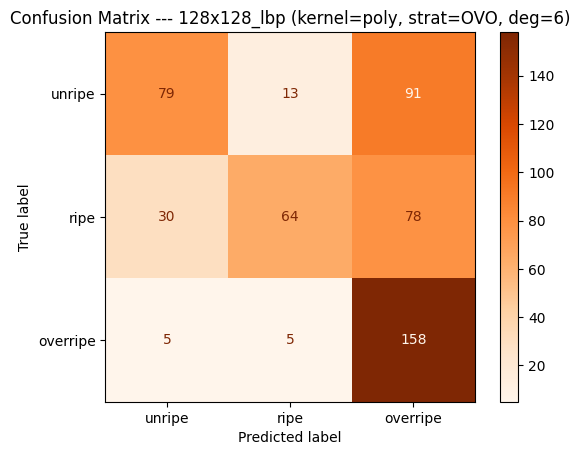


=== SVM (kernel=poly, degree=7, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.9136    0.4044    0.5606       183
        ripe     0.8986    0.3605    0.5145       172
    overripe     0.4450    0.9881    0.6137       168

    accuracy                         0.5774       523
   macro avg     0.7524    0.5843    0.5629       523
weighted avg     0.7581    0.5774    0.5625       523



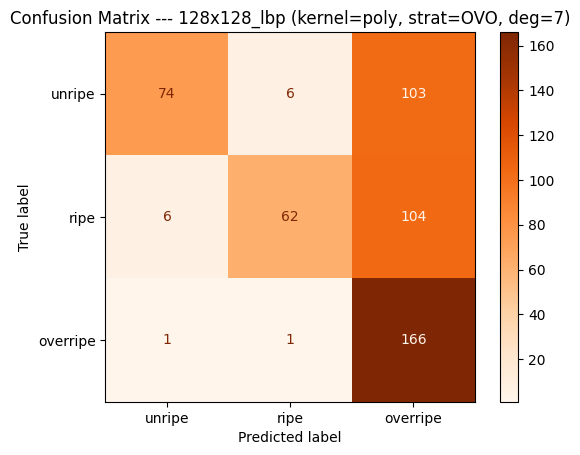


=== SVM (kernel=poly, degree=8, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6970    0.3770    0.4894       183
        ripe     0.7500    0.3314    0.4597       172
    overripe     0.4540    0.9405    0.6124       168

    accuracy                         0.5430       523
   macro avg     0.6337    0.5496    0.5205       523
weighted avg     0.6364    0.5430    0.5191       523



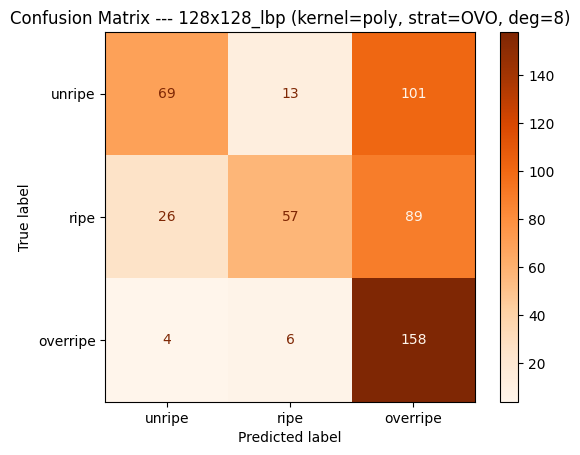


=== SVM (kernel=poly, degree=9, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.9032    0.3060    0.4571       183
        ripe     0.8615    0.3256    0.4726       172
    overripe     0.4116    0.9702    0.5780       168

    accuracy                         0.5258       523
   macro avg     0.7255    0.5339    0.5026       523
weighted avg     0.7316    0.5258    0.5010       523



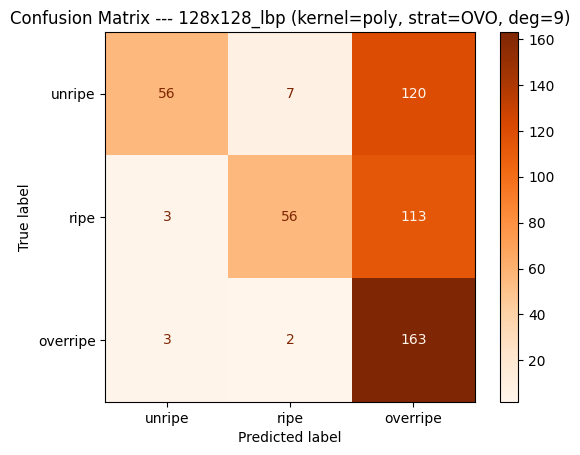


=== SVM (kernel=poly, degree=3, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8010    0.9016    0.8483       183
        ripe     0.8704    0.8198    0.8443       172
    overripe     0.8258    0.7619    0.7926       168

    accuracy                         0.8298       523
   macro avg     0.8324    0.8278    0.8284       523
weighted avg     0.8318    0.8298    0.8291       523



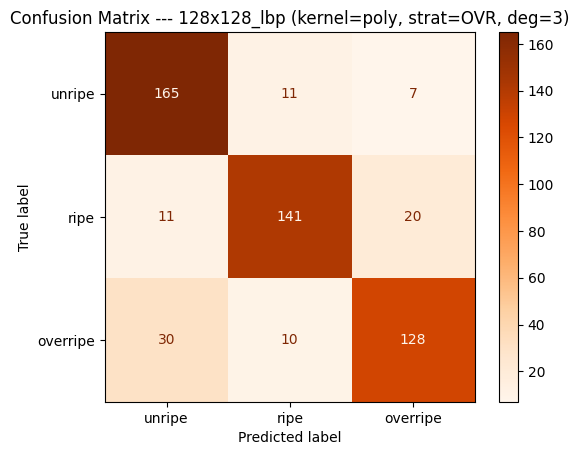


=== SVM (kernel=poly, degree=4, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8176    0.7104    0.7602       183
        ripe     0.8705    0.7035    0.7781       172
    overripe     0.6533    0.8750    0.7481       168

    accuracy                         0.7610       523
   macro avg     0.7805    0.7630    0.7622       523
weighted avg     0.7822    0.7610    0.7622       523



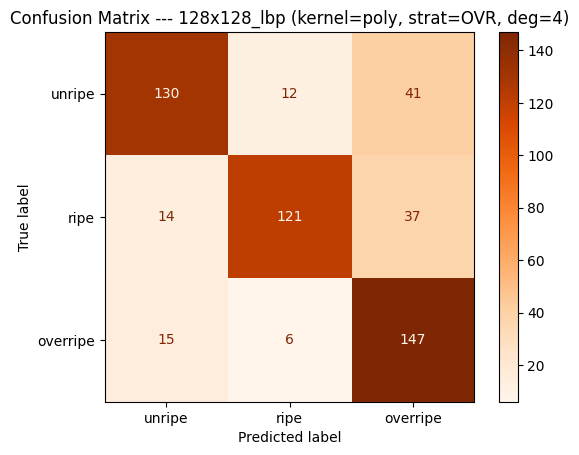


=== SVM (kernel=poly, degree=5, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.7799    0.8907    0.8316       183
        ripe     0.8854    0.8081    0.8450       172
    overripe     0.8217    0.7679    0.7938       168

    accuracy                         0.8241       523
   macro avg     0.8290    0.8222    0.8235       523
weighted avg     0.8280    0.8241    0.8239       523



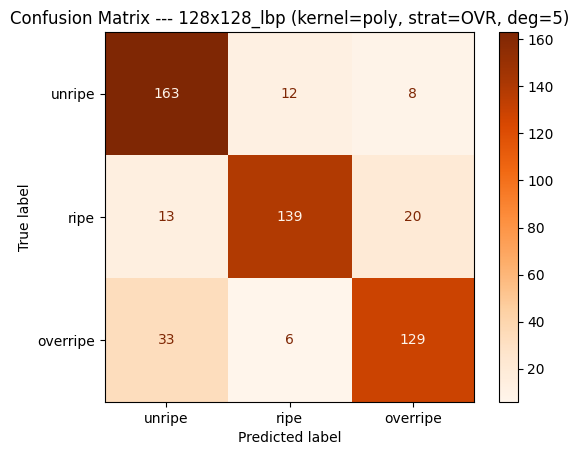


=== SVM (kernel=poly, degree=6, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8141    0.6940    0.7493       183
        ripe     0.8904    0.7558    0.8176       172
    overripe     0.6787    0.8929    0.7712       168

    accuracy                         0.7782       523
   macro avg     0.7944    0.7809    0.7794       523
weighted avg     0.7957    0.7782    0.7788       523



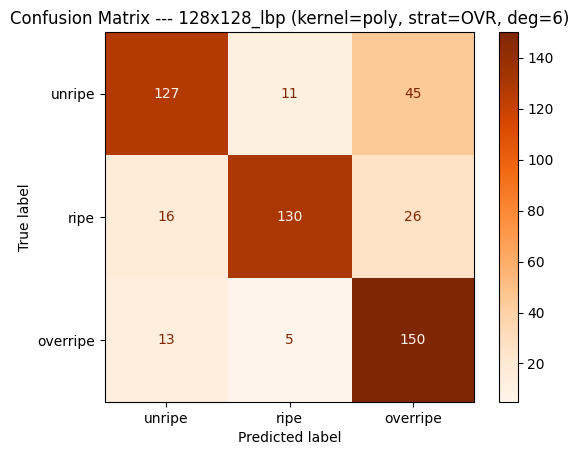


=== SVM (kernel=poly, degree=7, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8251    0.8251    0.8251       183
        ripe     0.8889    0.7907    0.8369       172
    overripe     0.7487    0.8333    0.7887       168

    accuracy                         0.8164       523
   macro avg     0.8209    0.8164    0.8169       523
weighted avg     0.8215    0.8164    0.8173       523



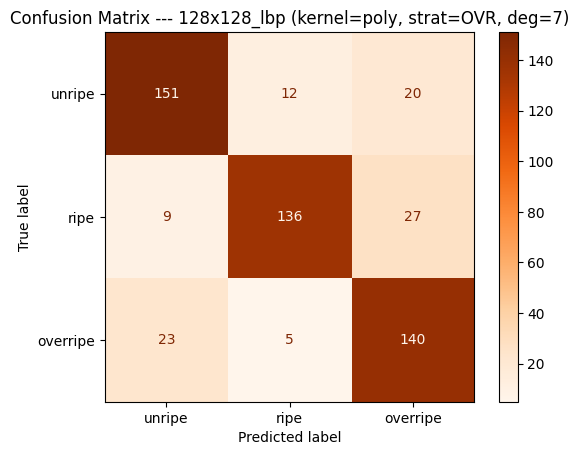


=== SVM (kernel=poly, degree=8, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8462    0.6612    0.7423       183
        ripe     0.8824    0.7849    0.8308       172
    overripe     0.6696    0.9048    0.7696       168

    accuracy                         0.7801       523
   macro avg     0.7994    0.7836    0.7809       523
weighted avg     0.8013    0.7801    0.7802       523



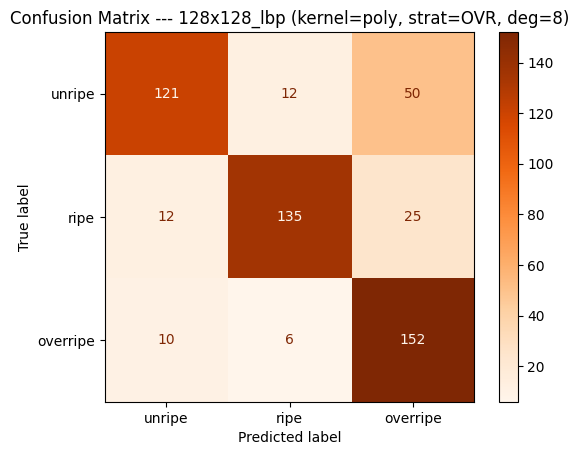


=== SVM (kernel=poly, degree=9, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8344    0.7432    0.7861       183
        ripe     0.9116    0.7791    0.8401       172
    overripe     0.6901    0.8750    0.7717       168

    accuracy                         0.7973       523
   macro avg     0.8120    0.7991    0.7993       523
weighted avg     0.8134    0.7973    0.7992       523



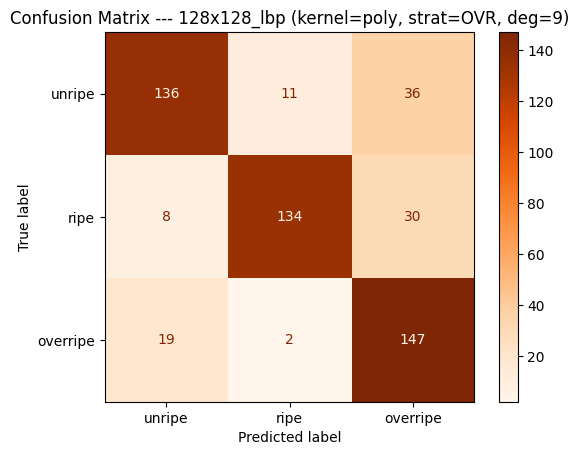


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_lbp\poly\poly_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_lbp\poly\poly_results_pairwise.csv


=== SVM (kernel=linear, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8325    0.8689    0.8503       183
        ripe     0.7602    0.7558    0.7580       172
    overripe     0.6894    0.6607    0.6748       168

    accuracy                         0.7648       523
   macro avg     0.7607    0.7618    0.7610       523
weighted avg     0.7628    0.7648    0.7636       523



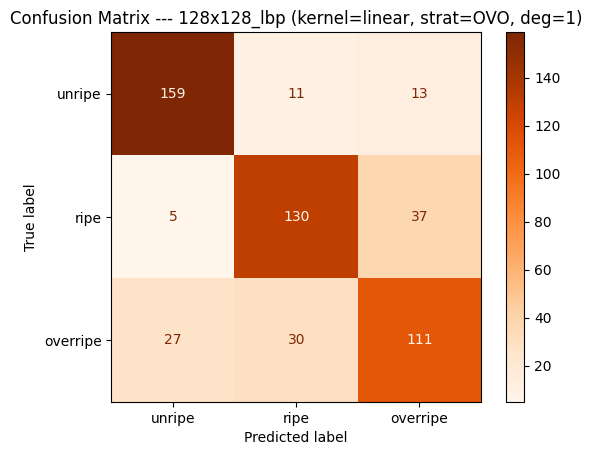


=== SVM (kernel=linear, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8186    0.9126    0.8630       183
        ripe     0.7738    0.7558    0.7647       172
    overripe     0.7086    0.6369    0.6708       168

    accuracy                         0.7725       523
   macro avg     0.7670    0.7684    0.7662       523
weighted avg     0.7685    0.7725    0.7690       523



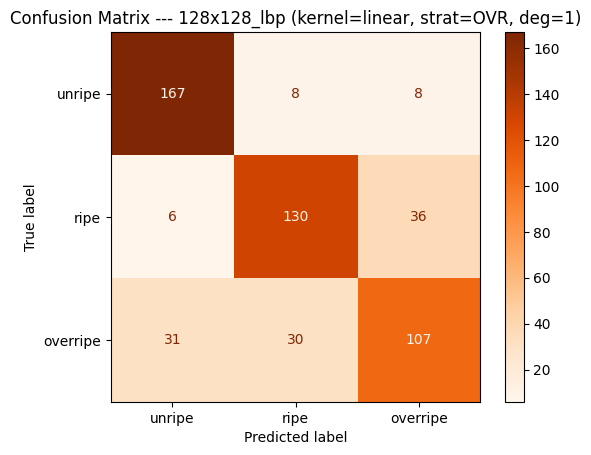


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_lbp\linear\linear_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_lbp\linear\linear_results_pairwise.csv


=== SVM (kernel=rbf, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.8564    0.8798    0.8679       183
        ripe     0.8514    0.8663    0.8588       172
    overripe     0.8500    0.8095    0.8293       168

    accuracy                         0.8528       523
   macro avg     0.8526    0.8519    0.8520       523
weighted avg     0.8527    0.8528    0.8525       523



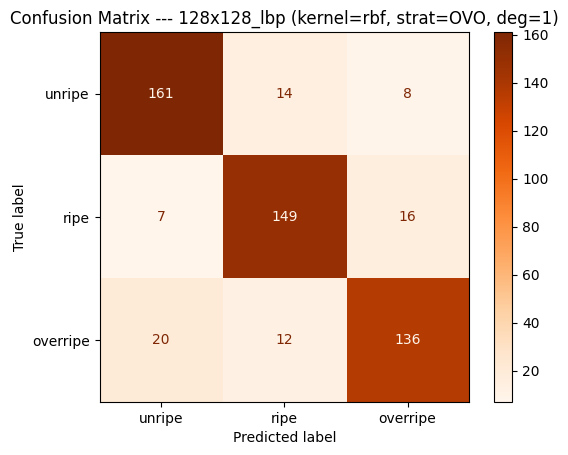


=== SVM (kernel=rbf, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.8549    0.9016    0.8777       183
        ripe     0.8488    0.8488    0.8488       172
    overripe     0.8354    0.7857    0.8098       168

    accuracy                         0.8470       523
   macro avg     0.8464    0.8454    0.8454       523
weighted avg     0.8467    0.8470    0.8464       523



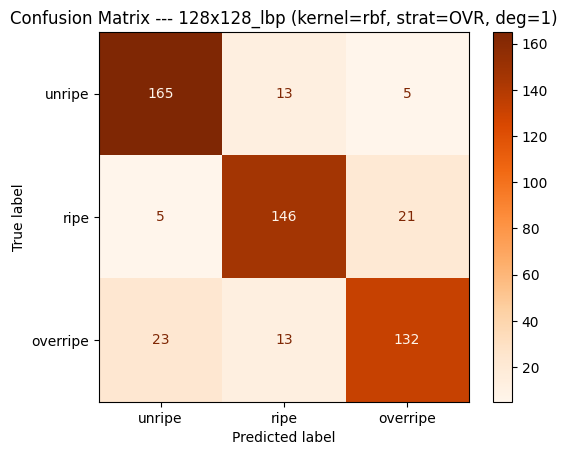


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_lbp\rbf\rbf_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_lbp\rbf\rbf_results_pairwise.csv


=== SVM (kernel=sigmoid, degree=1, strat=OVO) ===
              precision    recall  f1-score   support

      unripe     0.6601    0.7322    0.6943       183
        ripe     0.5650    0.5814    0.5731       172
    overripe     0.4965    0.4226    0.4566       168

    accuracy                         0.5832       523
   macro avg     0.5739    0.5788    0.5747       523
weighted avg     0.5763    0.5832    0.5781       523



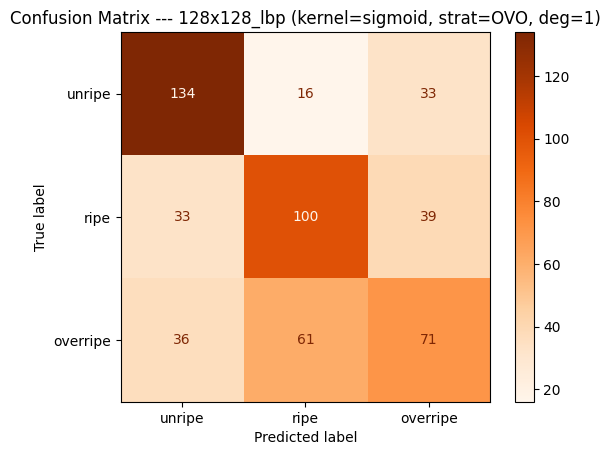


=== SVM (kernel=sigmoid, degree=1, strat=OVR) ===
              precision    recall  f1-score   support

      unripe     0.6651    0.7814    0.7186       183
        ripe     0.5000    0.5407    0.5196       172
    overripe     0.4016    0.2917    0.3379       168

    accuracy                         0.5449       523
   macro avg     0.5223    0.5379    0.5254       523
weighted avg     0.5262    0.5449    0.5309       523



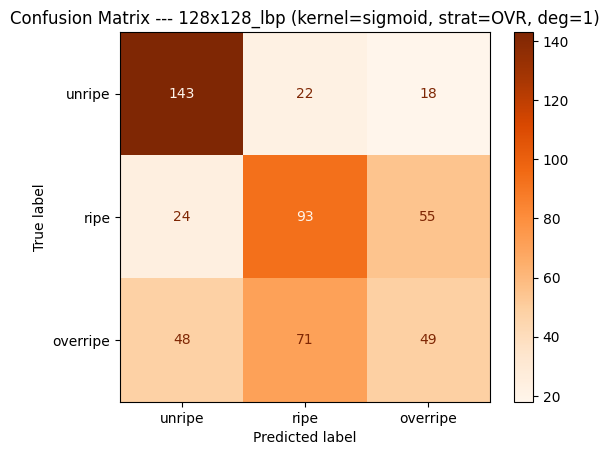


Saved:
  C:\Users\User\Desktop\Results\M1\128x128_lbp\sigmoid\sigmoid_results.csv
  C:\Users\User\Desktop\Results\M1\128x128_lbp\sigmoid\sigmoid_results_pairwise.csv



In [18]:
from svm_classification import svm_classification

base_dir = r"C:\Users\User\Desktop\FYP\Dataset\mango_1"
results_dir = r"C:\Users\User\Desktop\Results\M1"

feature_types = ['128x128_rgb', '128x128_his', '128x128_lab', '128x128_glcm', '128x128_lbp']

class_order=['unripe', 'ripe', 'overripe']

for feature_name in feature_types:
    train_csv = f"{base_dir}\\{feature_name}_train.csv"
    test_csv  = f"{base_dir}\\{feature_name}_test.csv"

    print(f"\n Now running: {feature_name}")

    svm_classification(
        train_csv     = train_csv,
        test_csv      = test_csv,
        feature_name  = feature_name,
        degrees       = list(range(3, 10)), 
        strategies    = ['ovo', 'ovr'],
        kernels       = ['poly'],
        class_order   = class_order,
        output_dir    = f"{results_dir}\\{feature_name}\\poly",
        out_csv_name  = f"poly_results.csv"
    )

    for kernel in ['linear', 'rbf', 'sigmoid']:
        svm_classification(
            train_csv     = train_csv,
            test_csv      = test_csv,
            feature_name  = feature_name,
            degrees       = [1],
            strategies    = ['ovo', 'ovr'],
            kernels       = [kernel],
            class_order   = class_order,
            output_dir    = f"{results_dir}\\{feature_name}\\{kernel}",
            out_csv_name  = f"{kernel}_results.csv"
        )


## Random Forest


--- Random Forest (n_estimators=10) on 128x128_mango1_rgb ---
              precision    recall  f1-score   support

      unripe     0.9389    0.9235    0.9311       183
        ripe     0.7740    0.6570    0.7107       172
    overripe     0.6497    0.7619    0.7014       168

    accuracy                         0.7839       523
   macro avg     0.7875    0.7808    0.7811       523
weighted avg     0.7918    0.7839    0.7848       523

Training time: 0.0380 seconds


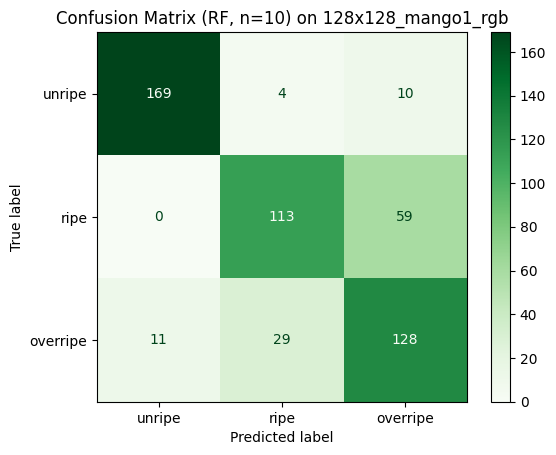

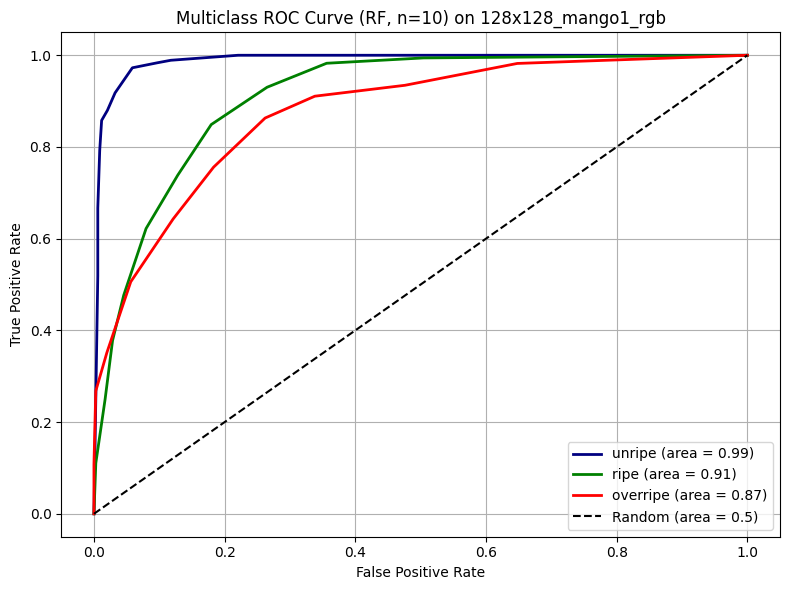


--- Random Forest (n_estimators=30) on 128x128_mango1_rgb ---
              precision    recall  f1-score   support

      unripe     0.9457    0.9508    0.9482       183
        ripe     0.8012    0.7500    0.7748       172
    overripe     0.7303    0.7738    0.7514       168

    accuracy                         0.8279       523
   macro avg     0.8257    0.8249    0.8248       523
weighted avg     0.8290    0.8279    0.8280       523

Training time: 0.1045 seconds


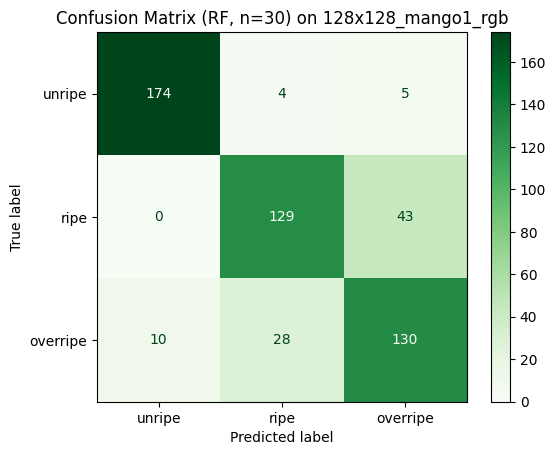

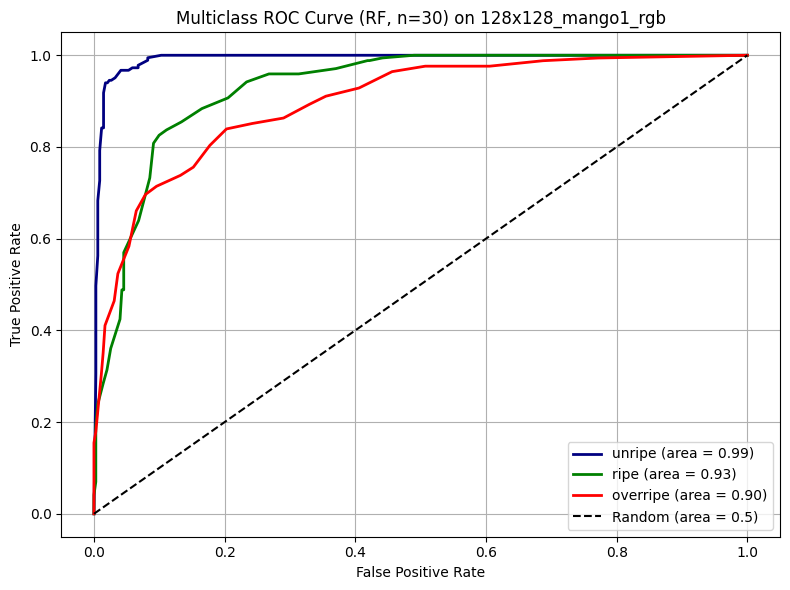


--- Random Forest (n_estimators=50) on 128x128_mango1_rgb ---
              precision    recall  f1-score   support

      unripe     0.9508    0.9508    0.9508       183
        ripe     0.8176    0.8081    0.8129       172
    overripe     0.7706    0.7798    0.7751       168

    accuracy                         0.8489       523
   macro avg     0.8464    0.8462    0.8463       523
weighted avg     0.8491    0.8489    0.8490       523

Training time: 0.1715 seconds


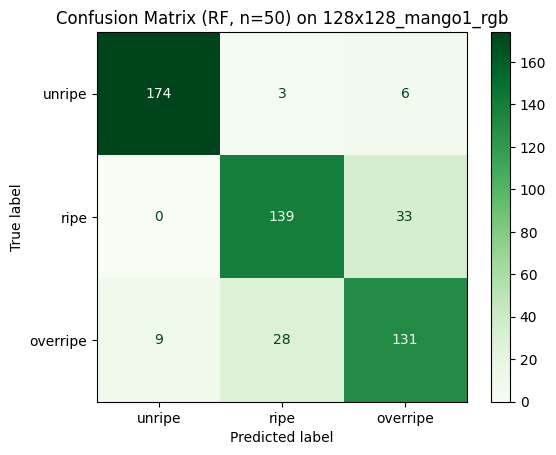

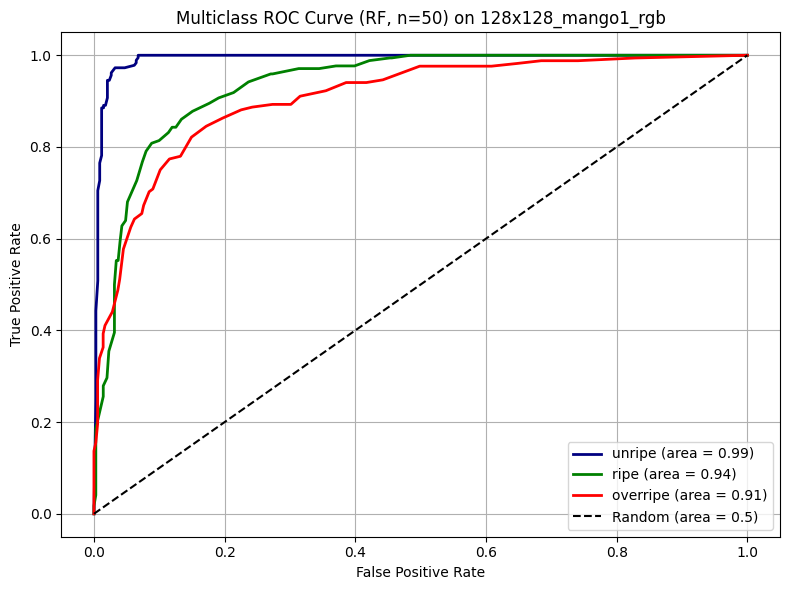


--- Random Forest (n_estimators=100) on 128x128_mango1_rgb ---
              precision    recall  f1-score   support

      unripe     0.9511    0.9563    0.9537       183
        ripe     0.8246    0.8198    0.8222       172
    overripe     0.7857    0.7857    0.7857       168

    accuracy                         0.8566       523
   macro avg     0.8538    0.8539    0.8539       523
weighted avg     0.8564    0.8566    0.8565       523

Training time: 0.3428 seconds


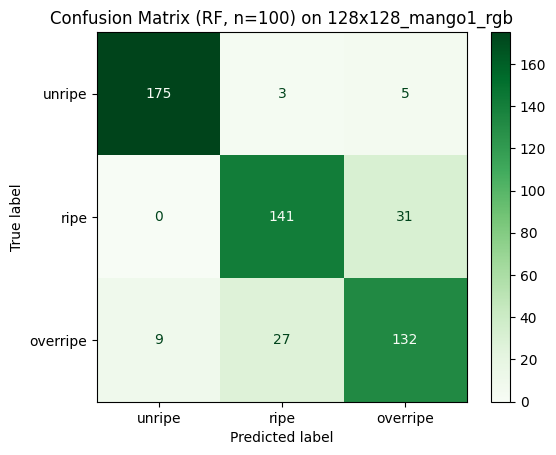

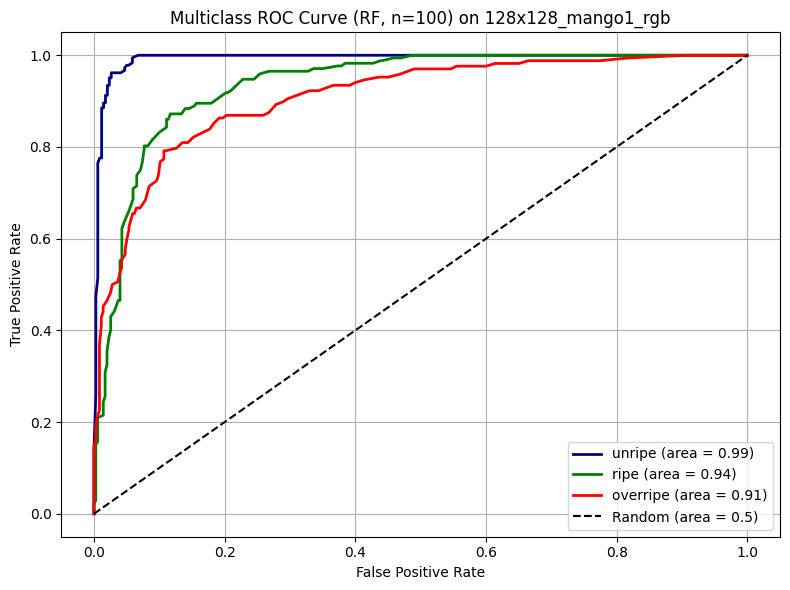


--- Random Forest (n_estimators=150) on 128x128_mango1_rgb ---
              precision    recall  f1-score   support

      unripe     0.9451    0.9399    0.9425       183
        ripe     0.8057    0.8198    0.8127       172
    overripe     0.7771    0.7679    0.7725       168

    accuracy                         0.8451       523
   macro avg     0.8426    0.8425    0.8425       523
weighted avg     0.8453    0.8451    0.8452       523

Training time: 0.5141 seconds


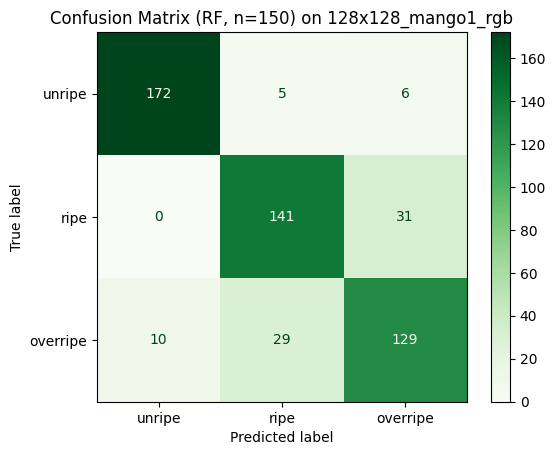

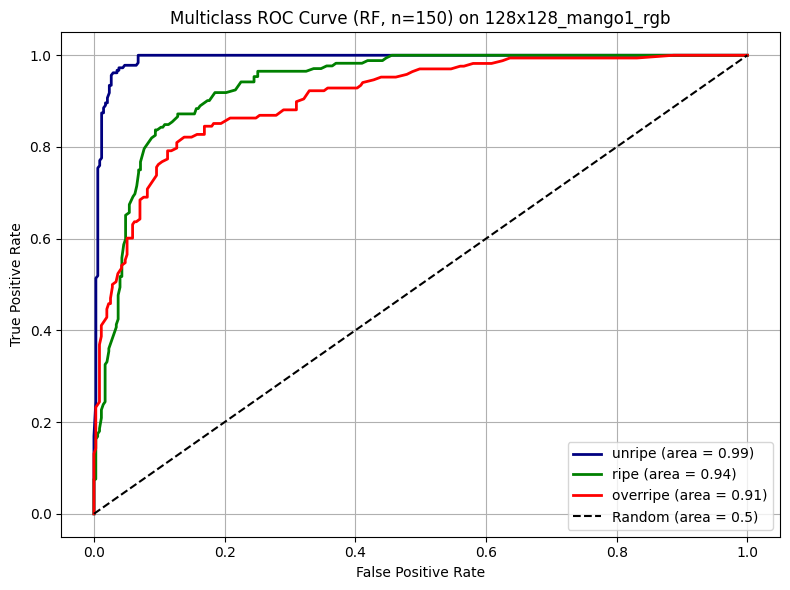


--- Random Forest (n_estimators=200) on 128x128_mango1_rgb ---
              precision    recall  f1-score   support

      unripe     0.9457    0.9508    0.9482       183
        ripe     0.8023    0.8256    0.8138       172
    overripe     0.7901    0.7619    0.7758       168

    accuracy                         0.8489       523
   macro avg     0.8460    0.8461    0.8459       523
weighted avg     0.8485    0.8489    0.8486       523

Training time: 0.6869 seconds


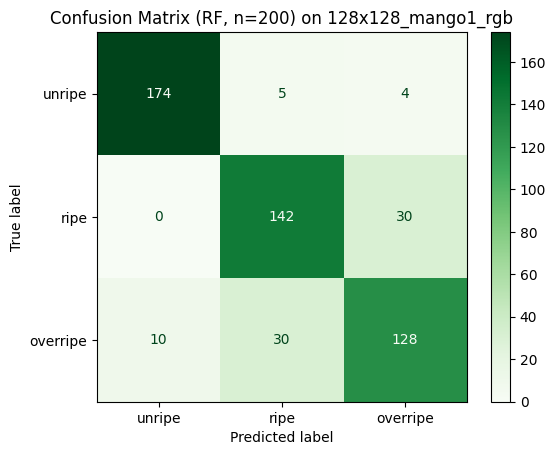

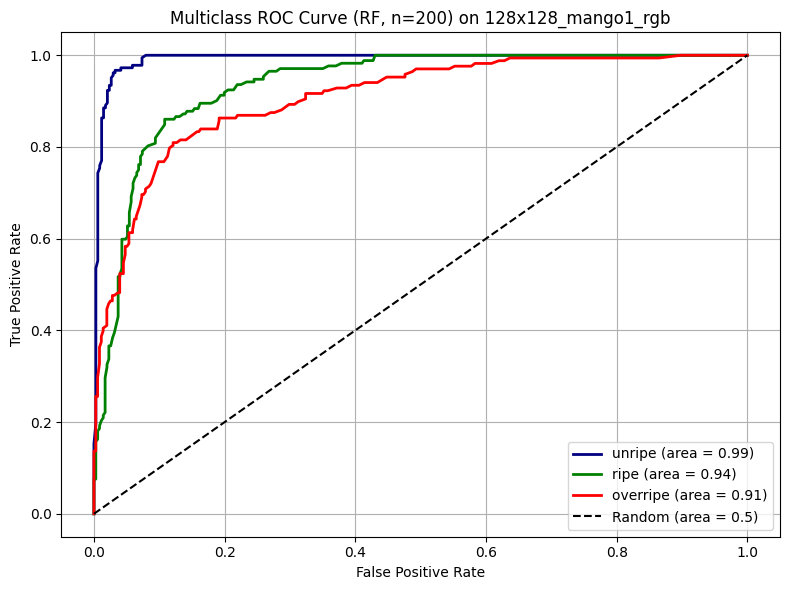

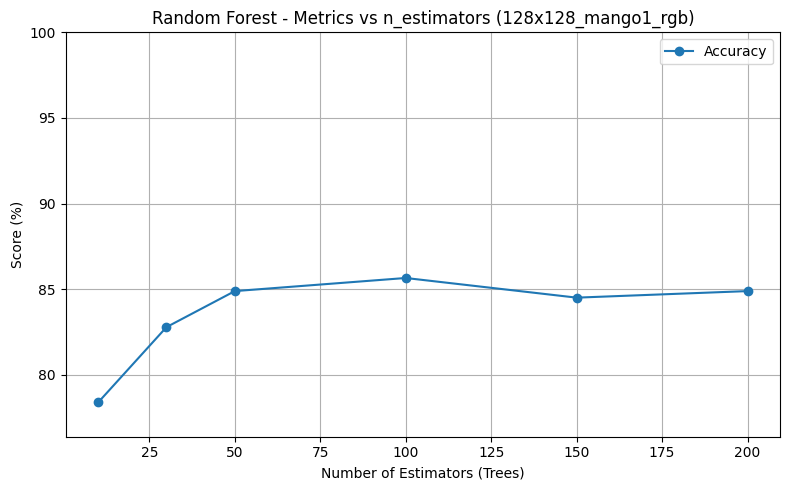

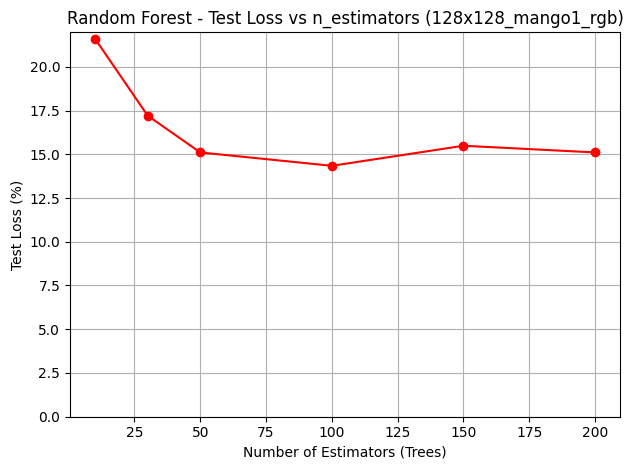

,n_estimators,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,10,78.393881,79.177307,78.393881,78.482949,21.606119,0.038001
1,30,82.791587,82.899549,82.791587,82.797308,17.208413,0.104510
2,50,84.894837,84.912833,84.894837,84.902049,15.105163,0.171514
3,100,85.659656,85.635464,85.659656,85.647082,14.340344,0.342774
4,150,84.512428,84.528132,84.512428,84.517145,15.487572,0.514104
5,200,84.894837,84.853497,84.894837,84.860186,15.105163,0.686896


In [20]:
from rf_classification import rf_classification

rf_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_rgb_test.csv",
    feature="128x128_mango1_rgb",
    class_order=['unripe', 'ripe', 'overripe']
)


--- Random Forest (n_estimators=10) on 128x128_mango1_his ---
              precision    recall  f1-score   support

      unripe     0.9448    0.9344    0.9396       183
        ripe     0.8500    0.8895    0.8693       172
    overripe     0.8519    0.8214    0.8364       168

    accuracy                         0.8834       523
   macro avg     0.8822    0.8818    0.8817       523
weighted avg     0.8837    0.8834    0.8833       523

Training time: 0.0320 seconds


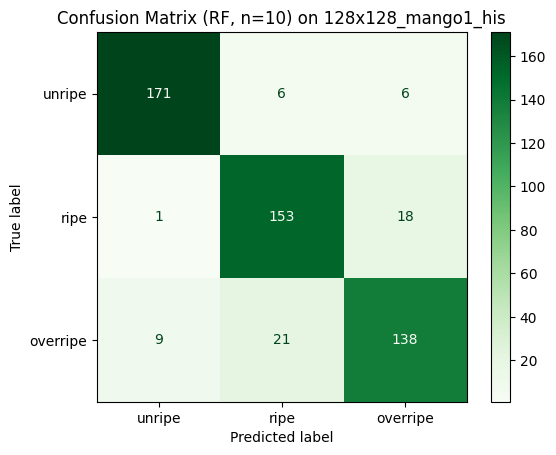

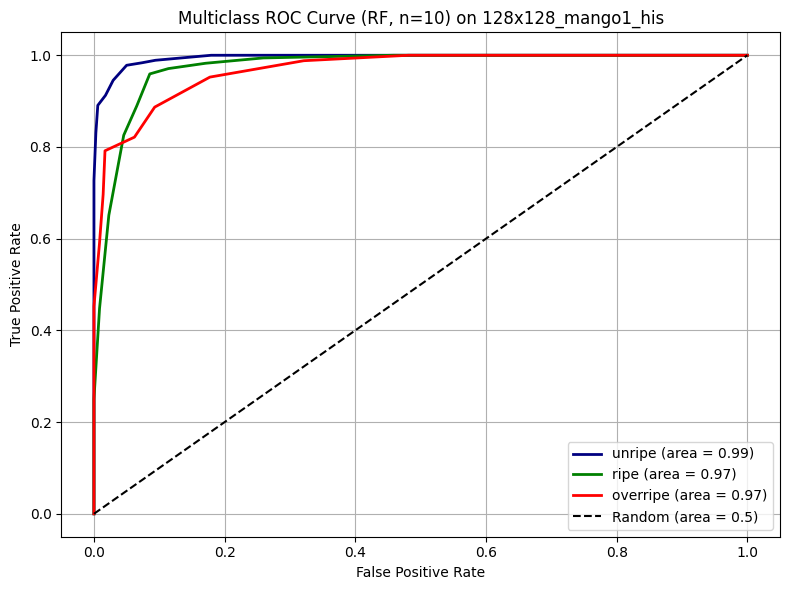


--- Random Forest (n_estimators=30) on 128x128_mango1_his ---
              precision    recall  f1-score   support

      unripe     0.9500    0.9344    0.9421       183
        ripe     0.8571    0.9070    0.8814       172
    overripe     0.8634    0.8274    0.8450       168

    accuracy                         0.8910       523
   macro avg     0.8902    0.8896    0.8895       523
weighted avg     0.8916    0.8910    0.8909       523

Training time: 0.0865 seconds


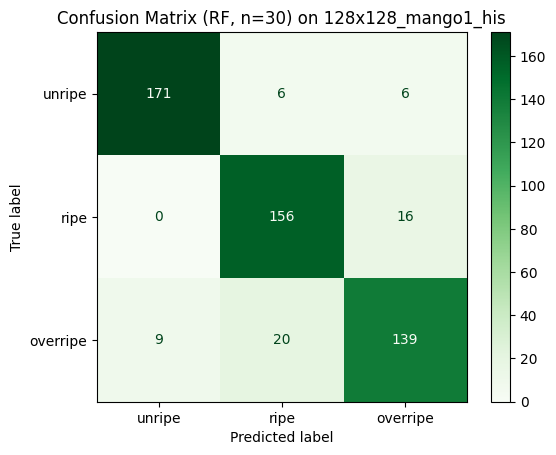

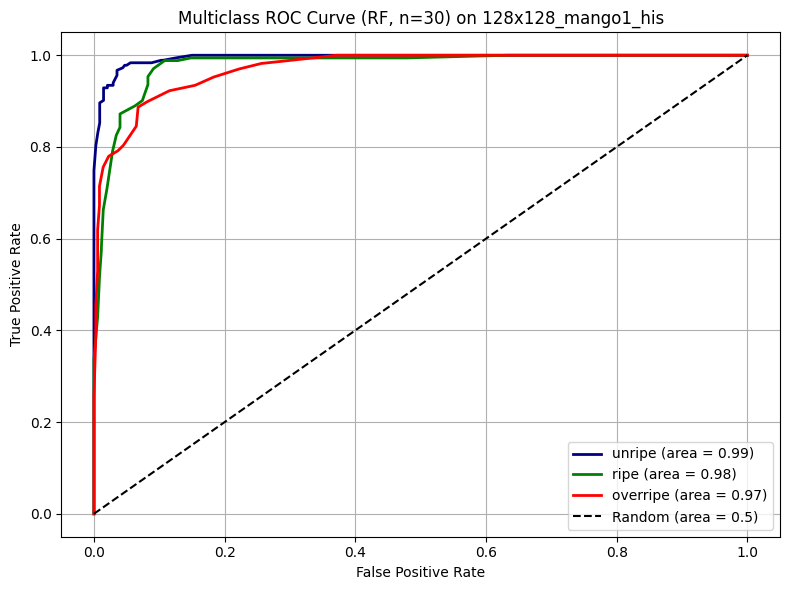


--- Random Forest (n_estimators=50) on 128x128_mango1_his ---
              precision    recall  f1-score   support

      unripe     0.9454    0.9454    0.9454       183
        ripe     0.8579    0.9128    0.8845       172
    overripe     0.8726    0.8155    0.8431       168

    accuracy                         0.8929       523
   macro avg     0.8920    0.8912    0.8910       523
weighted avg     0.8932    0.8929    0.8925       523

Training time: 0.1425 seconds


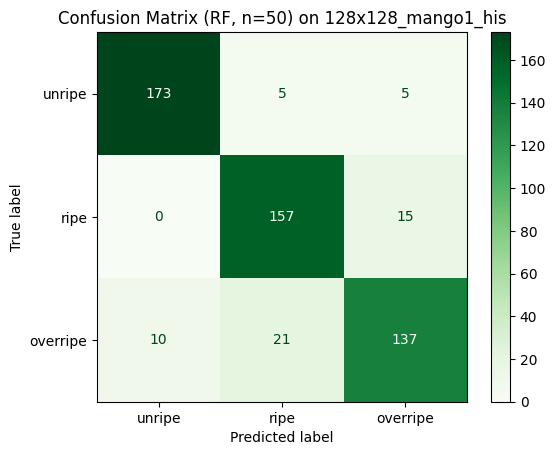

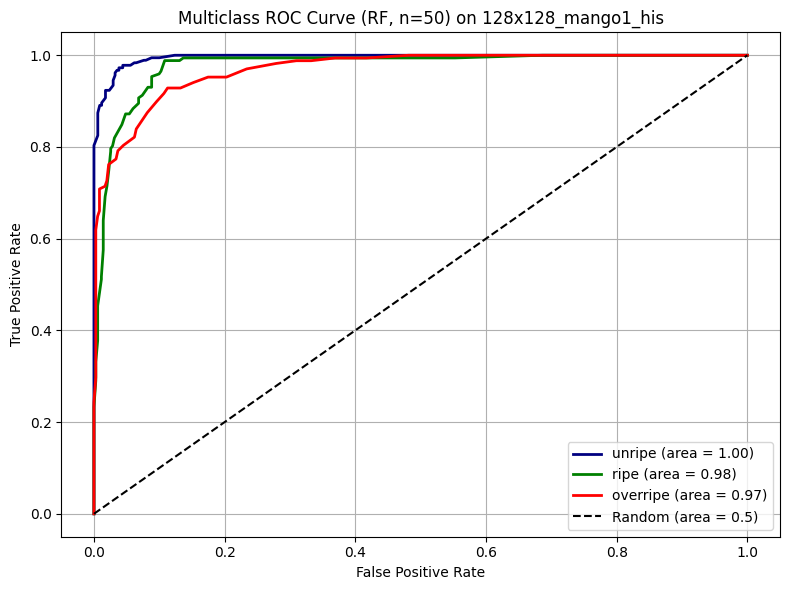


--- Random Forest (n_estimators=100) on 128x128_mango1_his ---
              precision    recall  f1-score   support

      unripe     0.9459    0.9563    0.9511       183
        ripe     0.8619    0.9070    0.8839       172
    overripe     0.8854    0.8274    0.8554       168

    accuracy                         0.8987       523
   macro avg     0.8977    0.8969    0.8968       523
weighted avg     0.8988    0.8987    0.8982       523

Training time: 0.2845 seconds


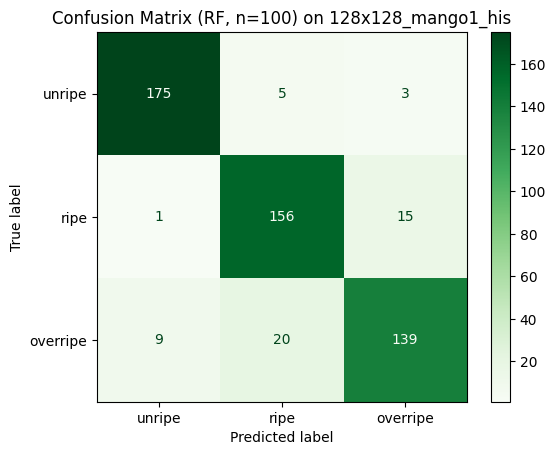

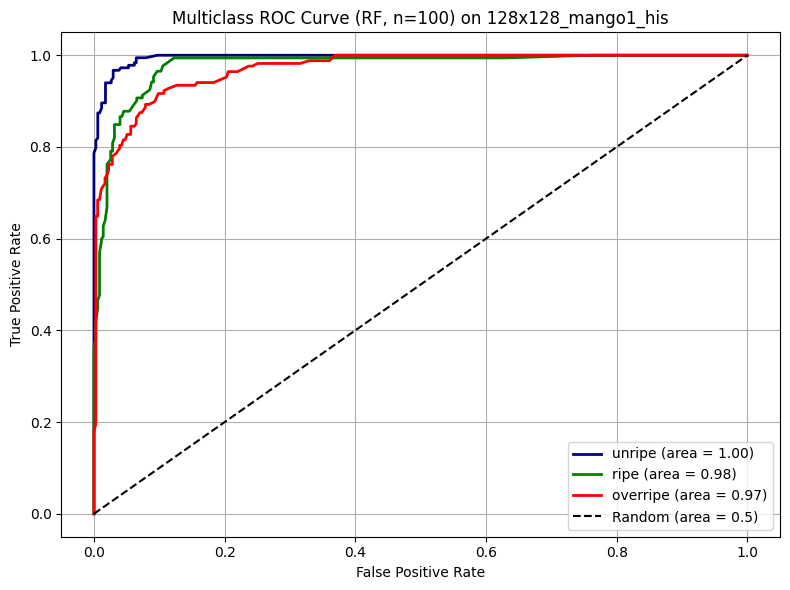


--- Random Forest (n_estimators=150) on 128x128_mango1_his ---
              precision    recall  f1-score   support

      unripe     0.9454    0.9454    0.9454       183
        ripe     0.8571    0.9070    0.8814       172
    overripe     0.8797    0.8274    0.8528       168

    accuracy                         0.8948       523
   macro avg     0.8941    0.8932    0.8932       523
weighted avg     0.8953    0.8948    0.8946       523

Training time: 0.4265 seconds


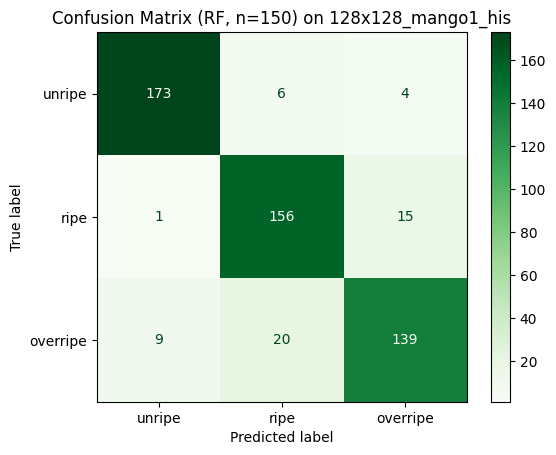

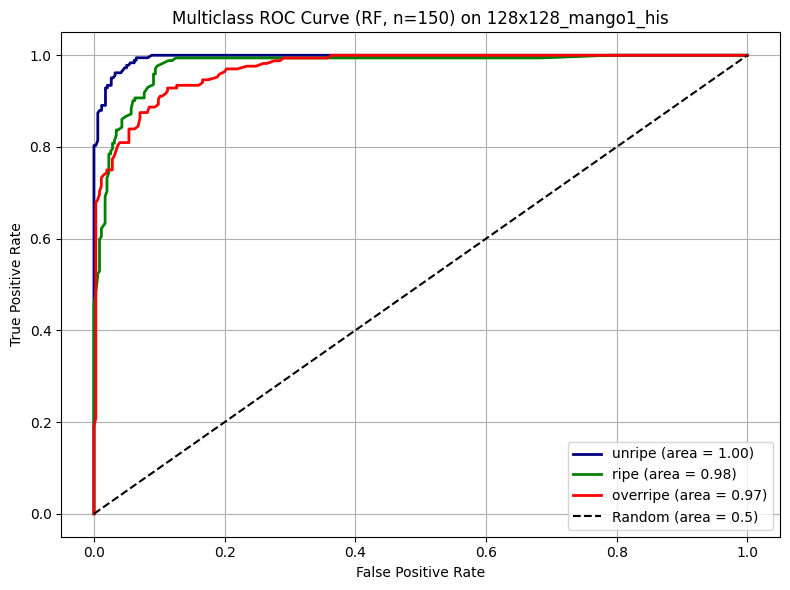


--- Random Forest (n_estimators=200) on 128x128_mango1_his ---
              precision    recall  f1-score   support

      unripe     0.9454    0.9454    0.9454       183
        ripe     0.8571    0.9070    0.8814       172
    overripe     0.8797    0.8274    0.8528       168

    accuracy                         0.8948       523
   macro avg     0.8941    0.8932    0.8932       523
weighted avg     0.8953    0.8948    0.8946       523

Training time: 0.5877 seconds


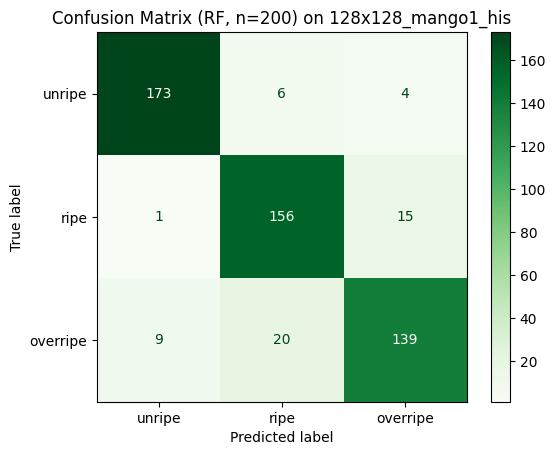

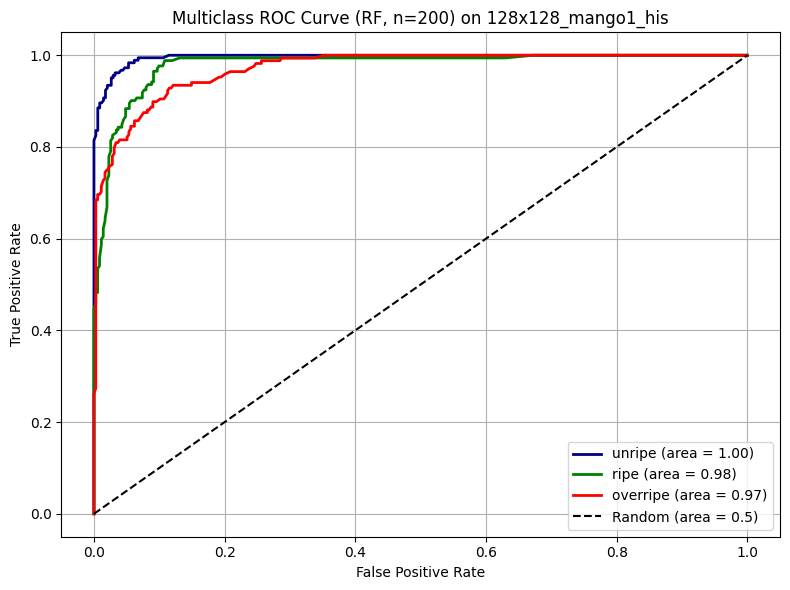

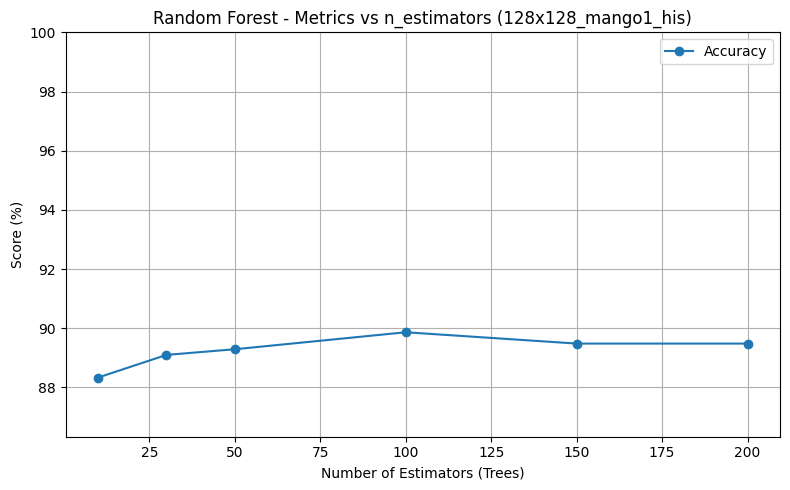

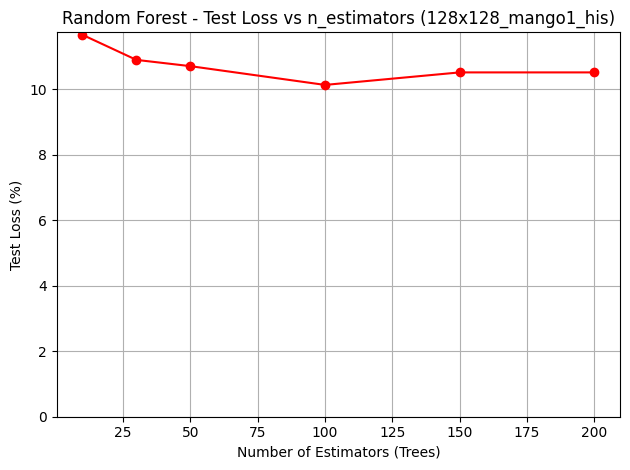

,n_estimators,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,10,88.336520,88.374878,88.336520,88.331048,11.663480,0.031999
1,30,89.101338,89.162916,89.101338,89.094434,10.898662,0.086512
2,50,89.292543,89.323435,89.292543,89.248974,10.707457,0.142511
3,100,89.866157,89.883376,89.866157,89.823364,10.133843,0.284529
4,150,89.483748,89.526967,89.483748,89.456410,10.516252,0.426457
5,200,89.483748,89.526967,89.483748,89.456410,10.516252,0.587716


In [21]:
from rf_classification import rf_classification

rf_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_his_test.csv",
    feature="128x128_mango1_his",
    class_order=['unripe', 'ripe', 'overripe']
)


--- Random Forest (n_estimators=10) on 128x128_mango1_lab ---
              precision    recall  f1-score   support

      unripe     0.9508    0.9508    0.9508       183
        ripe     0.9383    0.8837    0.9102       172
    overripe     0.8596    0.9107    0.8844       168

    accuracy                         0.9159       523
   macro avg     0.9162    0.9151    0.9151       523
weighted avg     0.9174    0.9159    0.9161       523

Training time: 0.0360 seconds


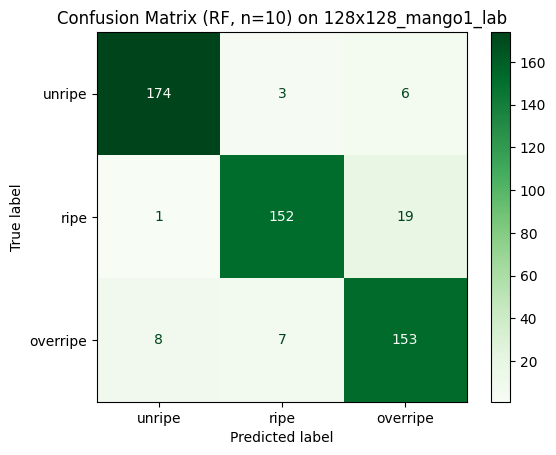

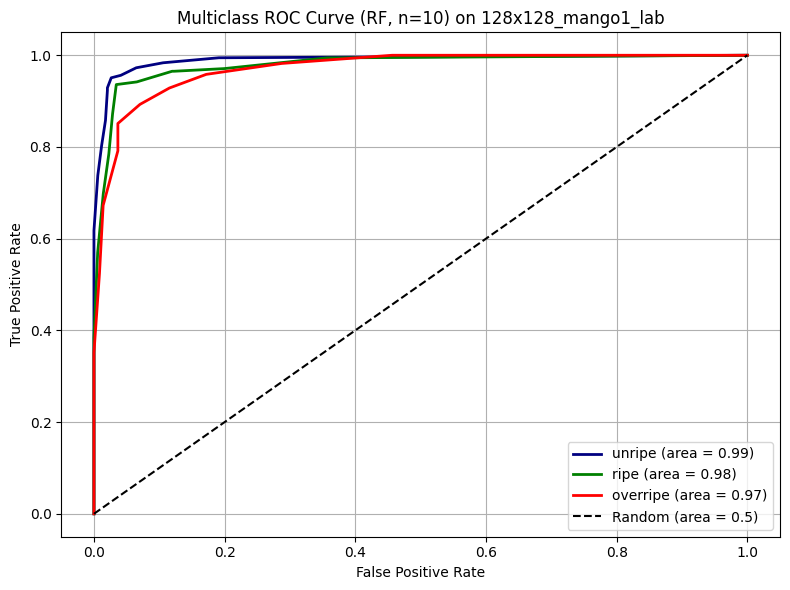


--- Random Forest (n_estimators=30) on 128x128_mango1_lab ---
              precision    recall  f1-score   support

      unripe     0.9553    0.9344    0.9448       183
        ripe     0.9302    0.9302    0.9302       172
    overripe     0.8895    0.9107    0.9000       168

    accuracy                         0.9254       523
   macro avg     0.9250    0.9251    0.9250       523
weighted avg     0.9259    0.9254    0.9256       523

Training time: 0.1071 seconds


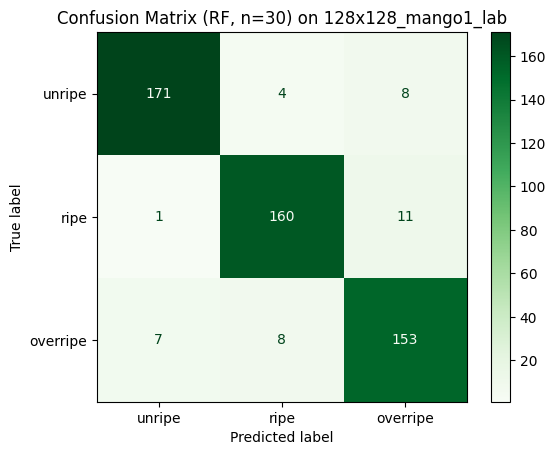

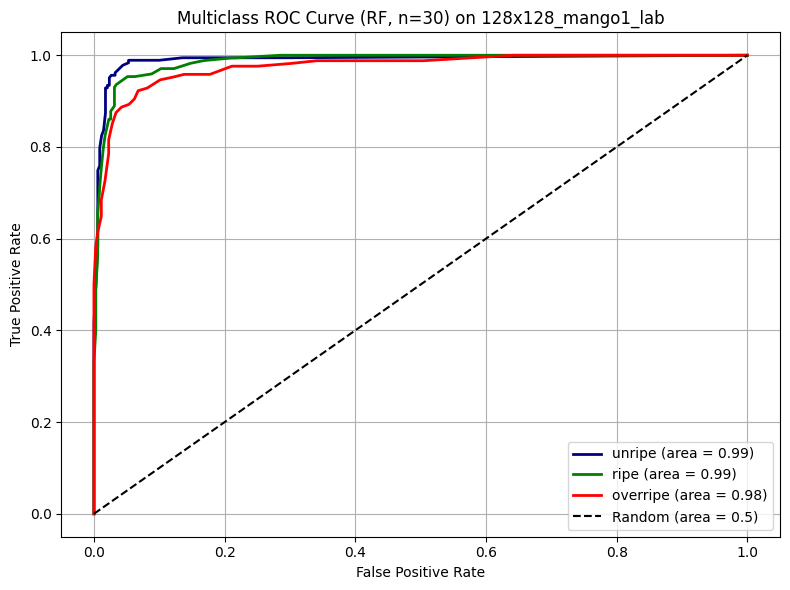


--- Random Forest (n_estimators=50) on 128x128_mango1_lab ---
              precision    recall  f1-score   support

      unripe     0.9663    0.9399    0.9529       183
        ripe     0.9298    0.9244    0.9271       172
    overripe     0.8908    0.9226    0.9064       168

    accuracy                         0.9293       523
   macro avg     0.9290    0.9290    0.9288       523
weighted avg     0.9301    0.9293    0.9295       523

Training time: 0.1790 seconds


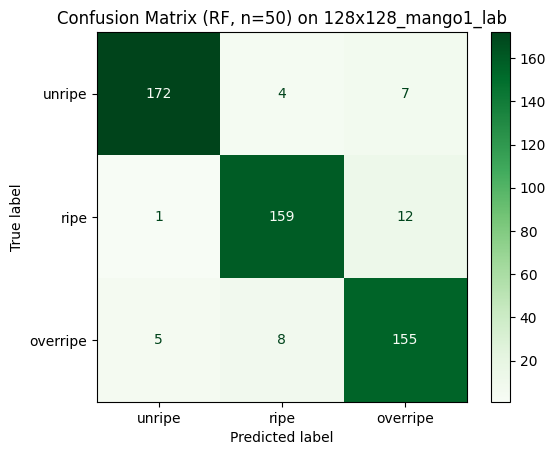

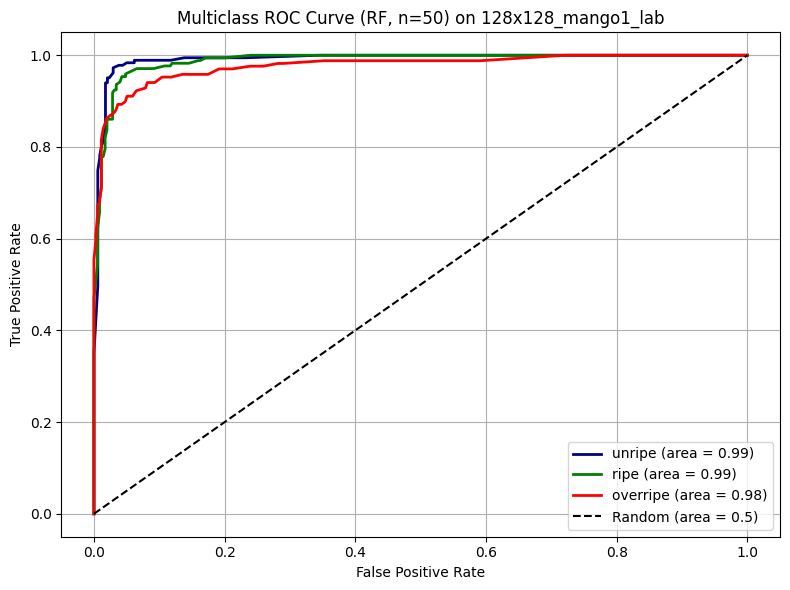


--- Random Forest (n_estimators=100) on 128x128_mango1_lab ---
              precision    recall  f1-score   support

      unripe     0.9661    0.9344    0.9500       183
        ripe     0.9298    0.9244    0.9271       172
    overripe     0.8857    0.9226    0.9038       168

    accuracy                         0.9273       523
   macro avg     0.9272    0.9272    0.9270       523
weighted avg     0.9283    0.9273    0.9276       523

Training time: 0.3395 seconds


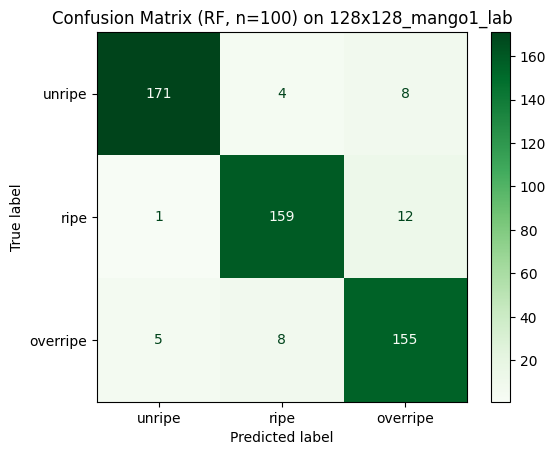

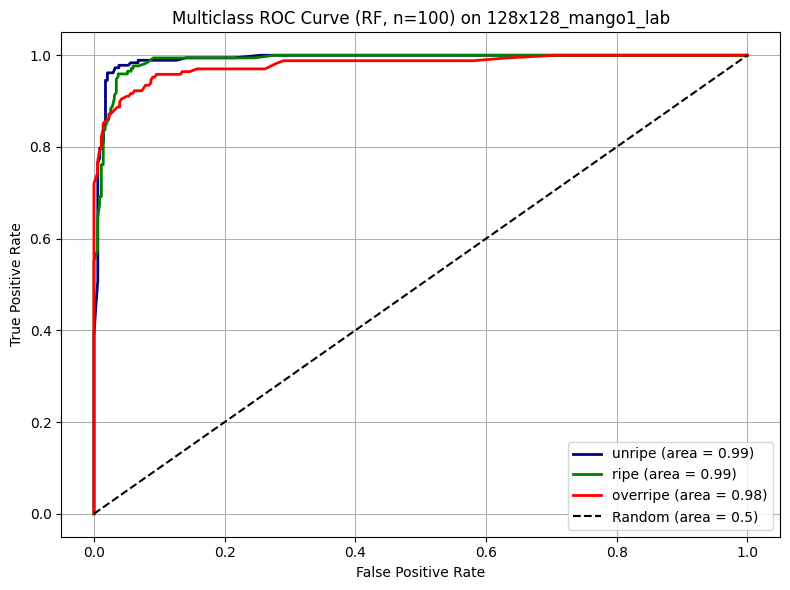


--- Random Forest (n_estimators=150) on 128x128_mango1_lab ---
              precision    recall  f1-score   support

      unripe     0.9661    0.9344    0.9500       183
        ripe     0.9298    0.9244    0.9271       172
    overripe     0.8857    0.9226    0.9038       168

    accuracy                         0.9273       523
   macro avg     0.9272    0.9272    0.9270       523
weighted avg     0.9283    0.9273    0.9276       523

Training time: 0.5160 seconds


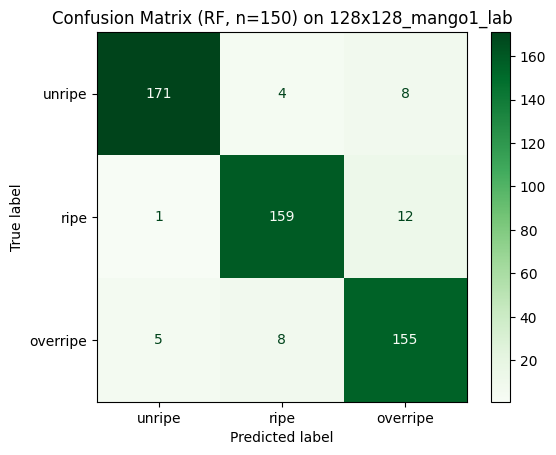

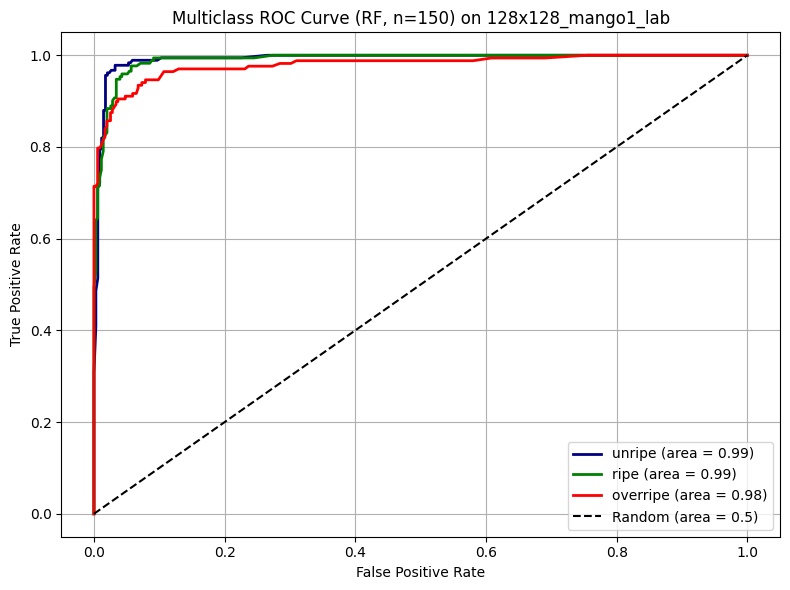


--- Random Forest (n_estimators=200) on 128x128_mango1_lab ---
              precision    recall  f1-score   support

      unripe     0.9661    0.9344    0.9500       183
        ripe     0.9298    0.9244    0.9271       172
    overripe     0.8857    0.9226    0.9038       168

    accuracy                         0.9273       523
   macro avg     0.9272    0.9272    0.9270       523
weighted avg     0.9283    0.9273    0.9276       523

Training time: 0.6794 seconds


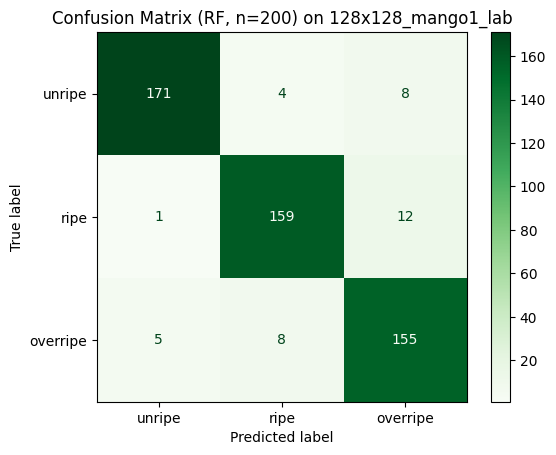

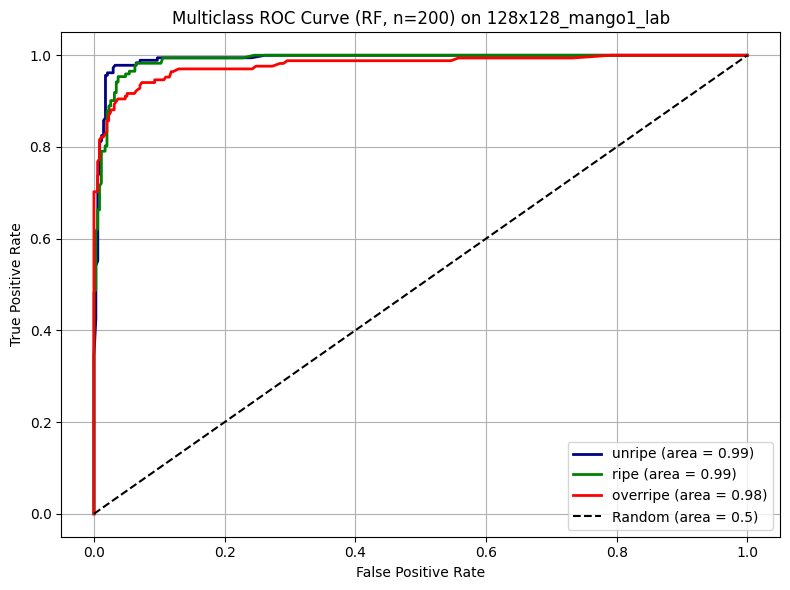

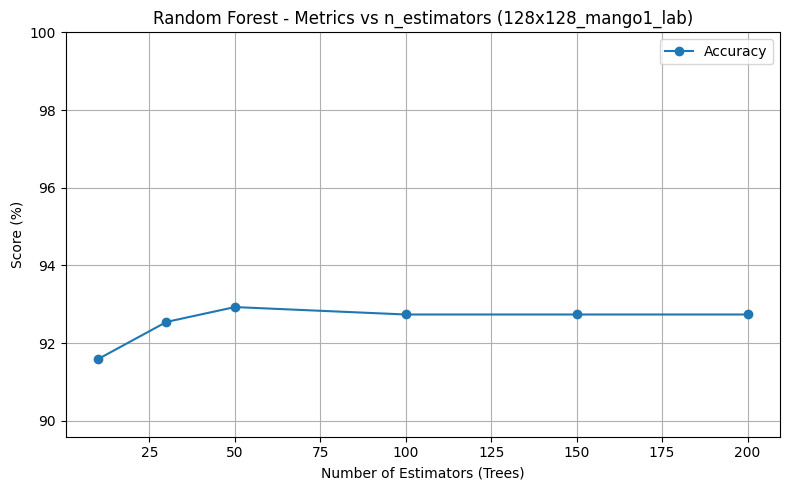

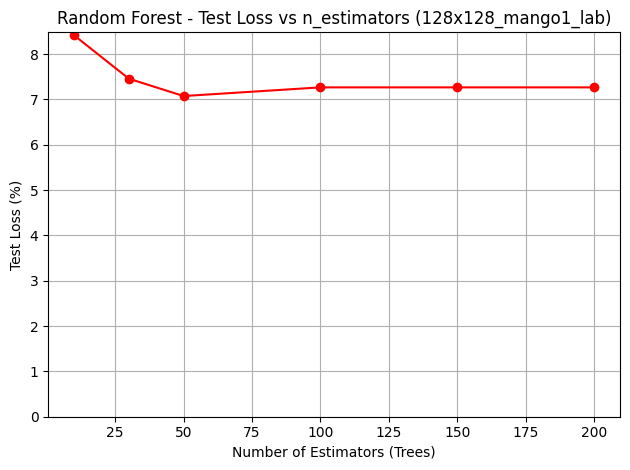

,n_estimators,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,10,91.586998,91.737516,91.586998,91.611651,8.413002,0.036001
1,30,92.543021,92.593325,92.543021,92.560134,7.456979,0.107136
2,50,92.925430,93.005059,92.925430,92.949623,7.074570,0.179027
3,100,92.734226,92.834882,92.734226,92.762962,7.265774,0.339530
4,150,92.734226,92.834882,92.734226,92.762962,7.265774,0.516015
5,200,92.734226,92.834882,92.734226,92.762962,7.265774,0.679352


In [22]:
from rf_classification import rf_classification

rf_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lab_test.csv",
    feature="128x128_mango1_lab",
    class_order=['unripe', 'ripe', 'overripe']
)


--- Random Forest (n_estimators=10) on 128x128_mango1_lbp ---
              precision    recall  f1-score   support

      unripe     0.8441    0.8579    0.8509       183
        ripe     0.8659    0.8256    0.8452       172
    overripe     0.8208    0.8452    0.8328       168

    accuracy                         0.8432       523
   macro avg     0.8436    0.8429    0.8430       523
weighted avg     0.8438    0.8432    0.8433       523

Training time: 0.0520 seconds


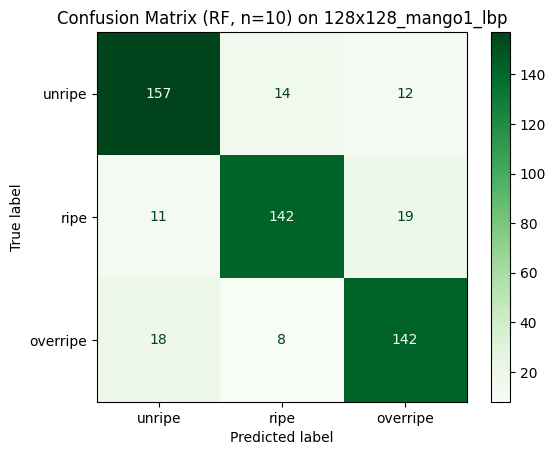

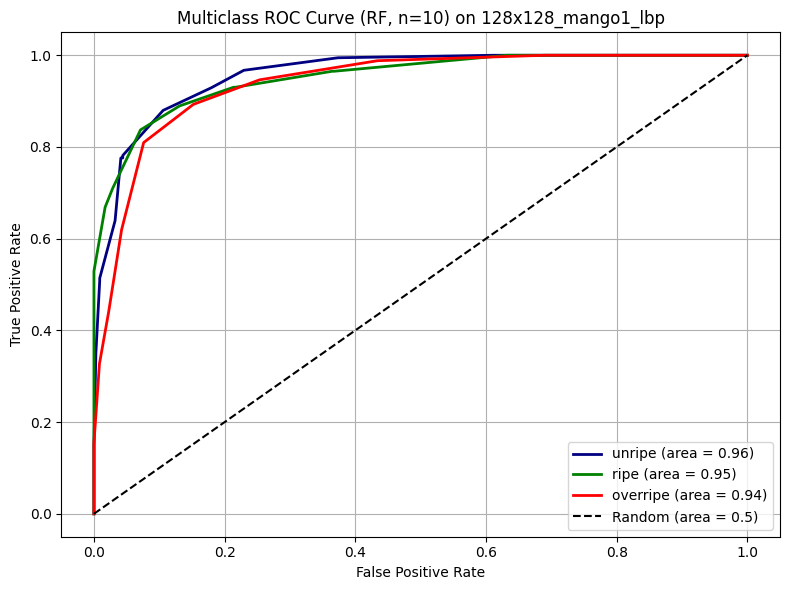


--- Random Forest (n_estimators=30) on 128x128_mango1_lbp ---
              precision    recall  f1-score   support

      unripe     0.8798    0.8798    0.8798       183
        ripe     0.8970    0.8605    0.8783       172
    overripe     0.8514    0.8869    0.8688       168

    accuracy                         0.8757       523
   macro avg     0.8761    0.8757    0.8756       523
weighted avg     0.8763    0.8757    0.8758       523

Training time: 0.1455 seconds


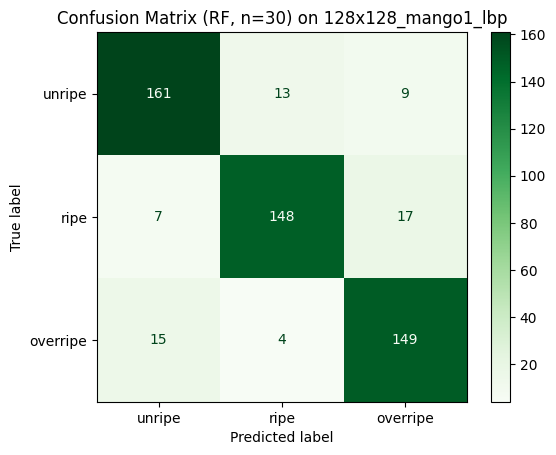

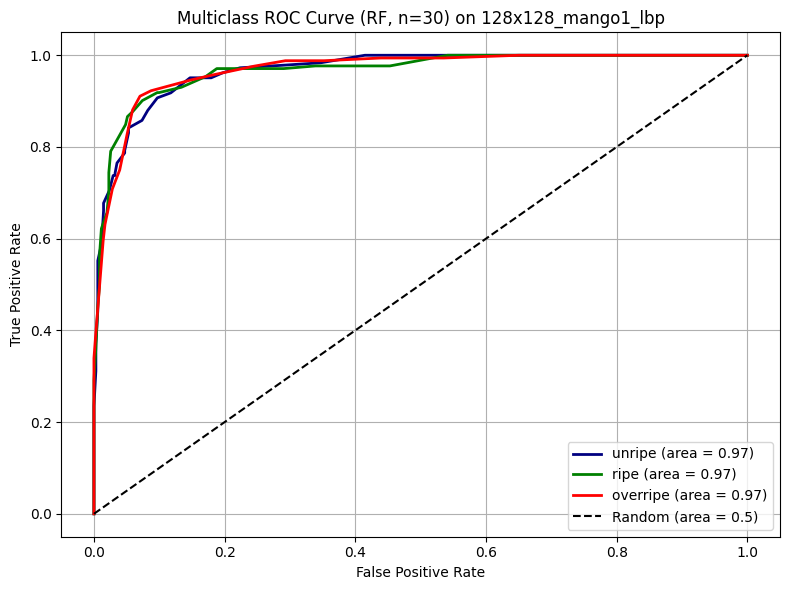


--- Random Forest (n_estimators=50) on 128x128_mango1_lbp ---
              precision    recall  f1-score   support

      unripe     0.8798    0.8798    0.8798       183
        ripe     0.9102    0.8837    0.8968       172
    overripe     0.8728    0.8988    0.8856       168

    accuracy                         0.8872       523
   macro avg     0.8876    0.8874    0.8874       523
weighted avg     0.8875    0.8872    0.8872       523

Training time: 0.2475 seconds


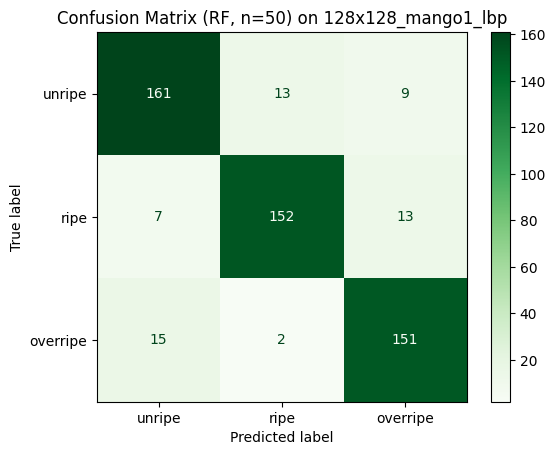

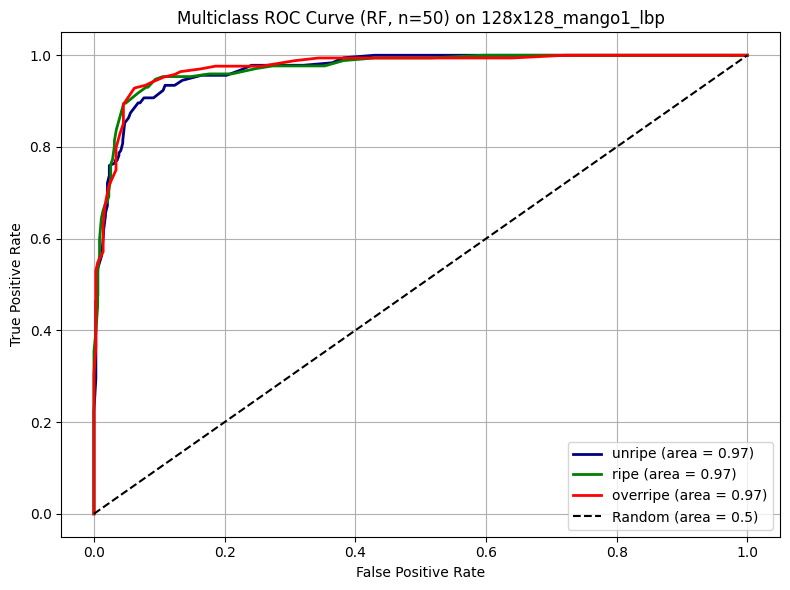


--- Random Forest (n_estimators=100) on 128x128_mango1_lbp ---
              precision    recall  f1-score   support

      unripe     0.8967    0.9016    0.8992       183
        ripe     0.9162    0.8895    0.9027       172
    overripe     0.8837    0.9048    0.8941       168

    accuracy                         0.8987       523
   macro avg     0.8989    0.8986    0.8987       523
weighted avg     0.8989    0.8987    0.8987       523

Training time: 0.4935 seconds


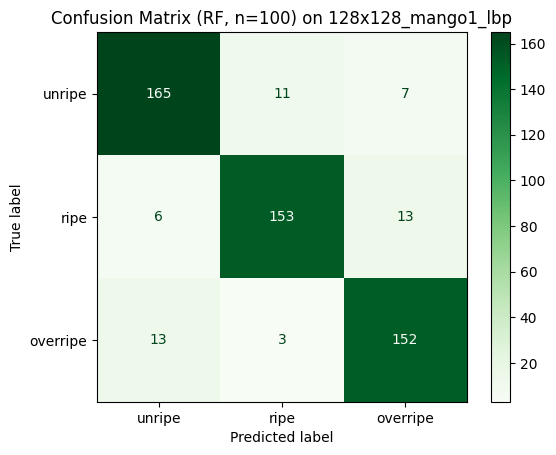

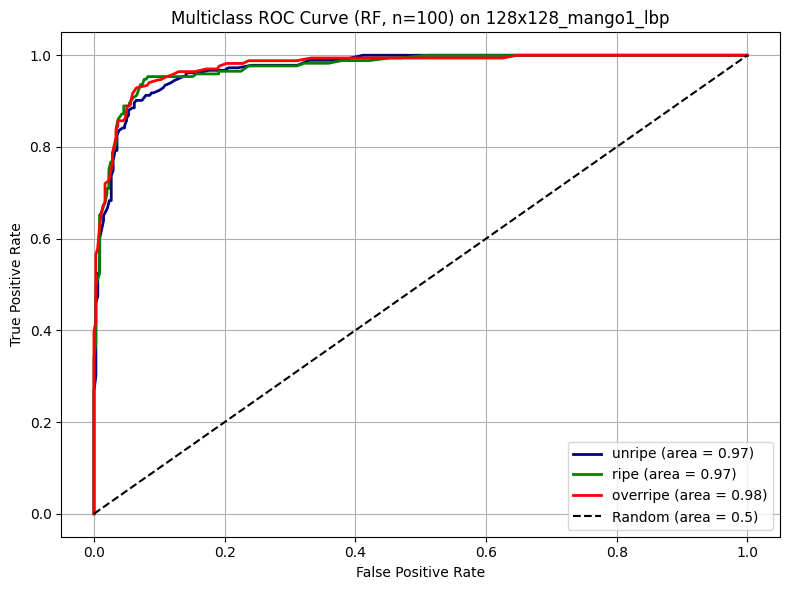


--- Random Forest (n_estimators=150) on 128x128_mango1_lbp ---
              precision    recall  f1-score   support

      unripe     0.8871    0.9016    0.8943       183
        ripe     0.9167    0.8953    0.9059       172
    overripe     0.8935    0.8988    0.8961       168

    accuracy                         0.8987       523
   macro avg     0.8991    0.8986    0.8988       523
weighted avg     0.8989    0.8987    0.8987       523

Training time: 0.7394 seconds


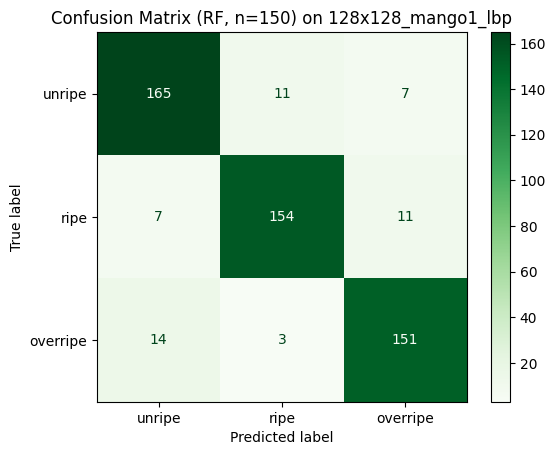

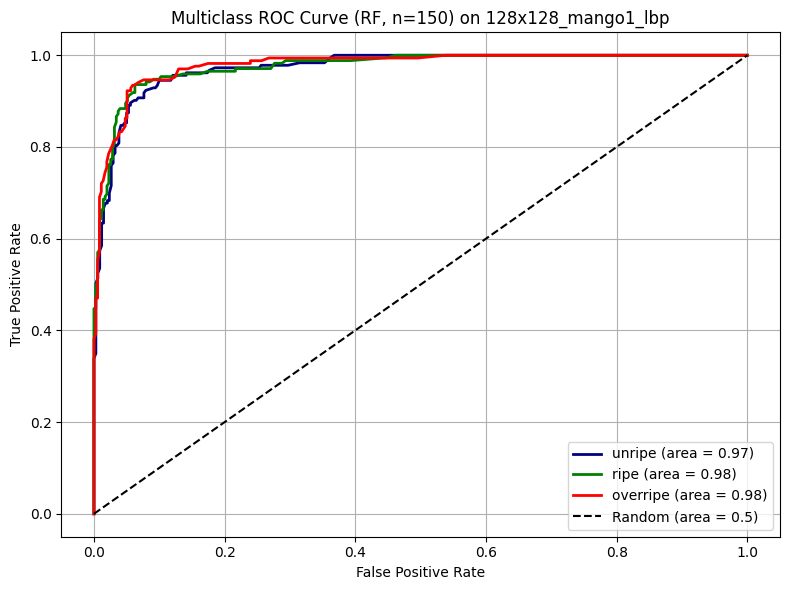


--- Random Forest (n_estimators=200) on 128x128_mango1_lbp ---
              precision    recall  f1-score   support

      unripe     0.8962    0.8962    0.8962       183
        ripe     0.9107    0.8895    0.9000       172
    overripe     0.8837    0.9048    0.8941       168

    accuracy                         0.8967       523
   macro avg     0.8969    0.8968    0.8968       523
weighted avg     0.8970    0.8967    0.8968       523

Training time: 0.9882 seconds


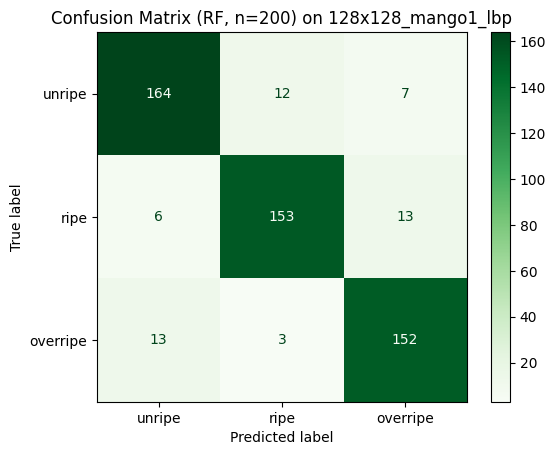

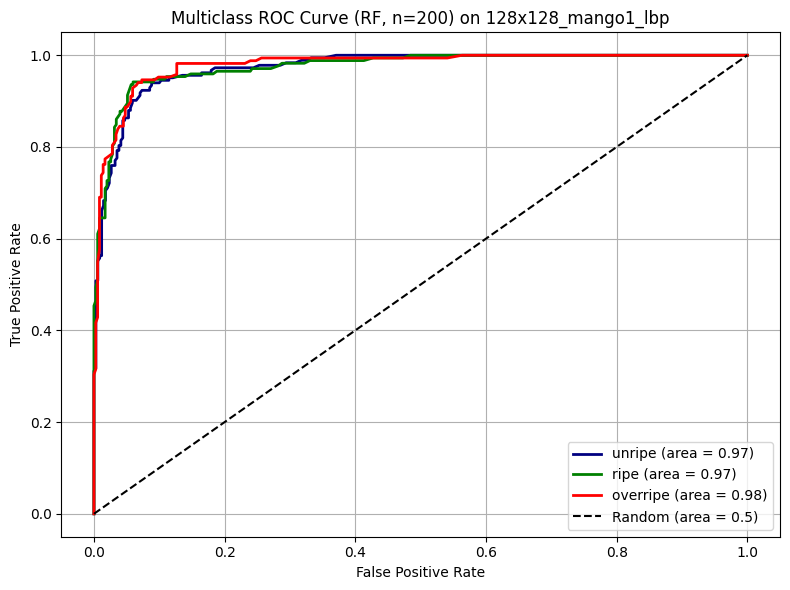

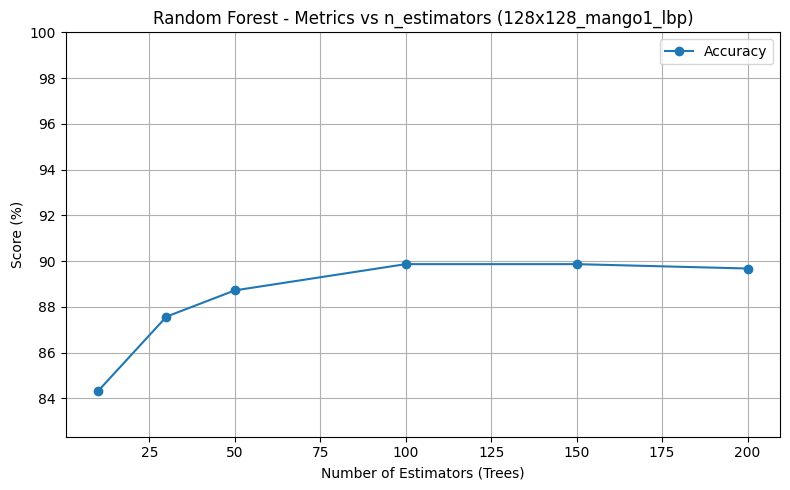

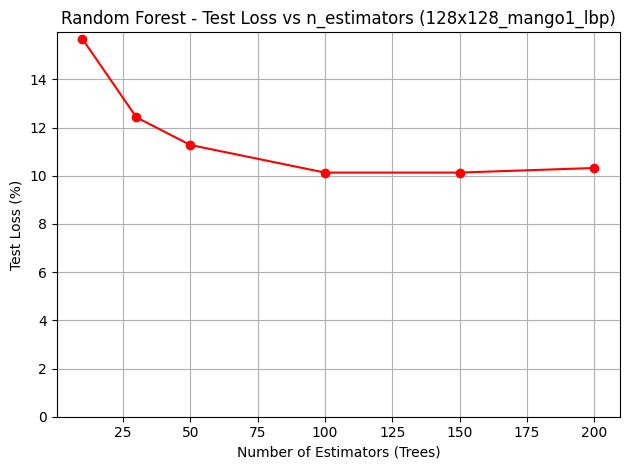

,n_estimators,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,10,84.321224,84.376773,84.321224,84.325510,15.678776,0.051997
1,30,87.571702,87.632655,87.571702,87.578082,12.428298,0.145509
2,50,88.718929,88.754634,88.718929,88.724247,11.281071,0.247538
3,100,89.866157,89.894687,89.866157,89.869753,10.133843,0.493527
4,150,89.866157,89.887550,89.866157,89.870407,10.133843,0.739446
5,200,89.674952,89.695597,89.674952,89.677202,10.325048,0.988180


In [23]:
from rf_classification import rf_classification

rf_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_lbp_test.csv",
    feature="128x128_mango1_lbp",
    class_order=['unripe', 'ripe', 'overripe']
)


--- Random Forest (n_estimators=10) on 128x128_mango1_glcm ---
              precision    recall  f1-score   support

      unripe     0.8854    0.9290    0.9067       183
        ripe     0.8701    0.7791    0.8221       172
    overripe     0.8249    0.8690    0.8464       168

    accuracy                         0.8604       523
   macro avg     0.8601    0.8590    0.8584       523
weighted avg     0.8609    0.8604    0.8595       523

Training time: 0.0400 seconds


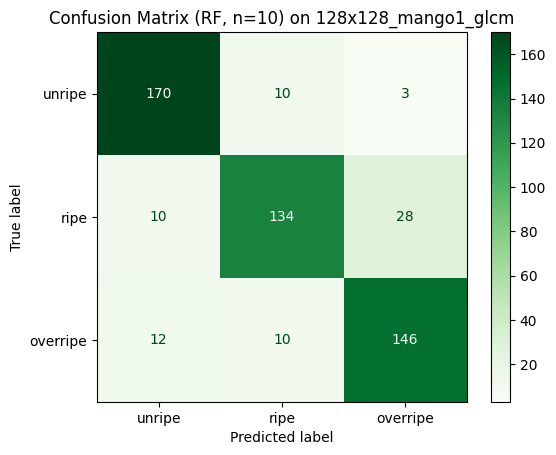

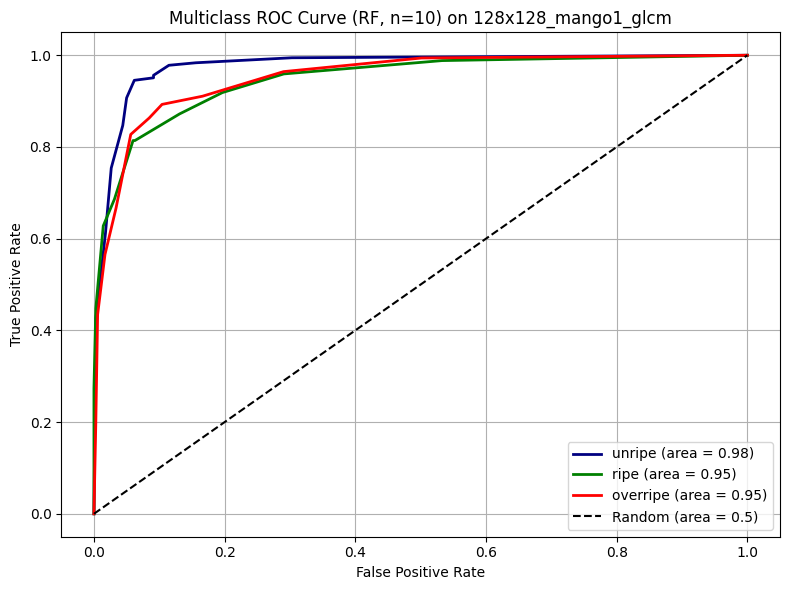


--- Random Forest (n_estimators=30) on 128x128_mango1_glcm ---
              precision    recall  f1-score   support

      unripe     0.8906    0.9344    0.9120       183
        ripe     0.8720    0.8314    0.8512       172
    overripe     0.8443    0.8393    0.8418       168

    accuracy                         0.8700       523
   macro avg     0.8690    0.8684    0.8683       523
weighted avg     0.8696    0.8700    0.8694       523

Training time: 0.1165 seconds


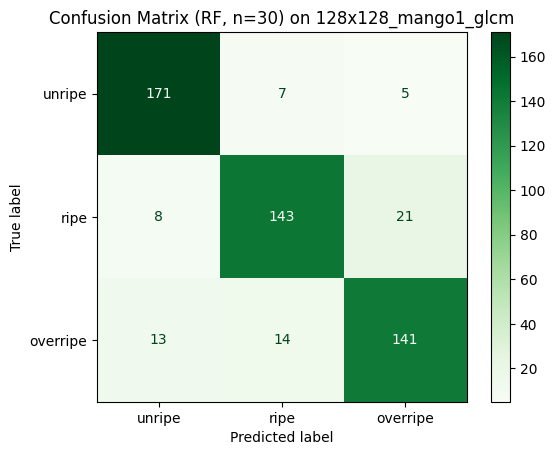

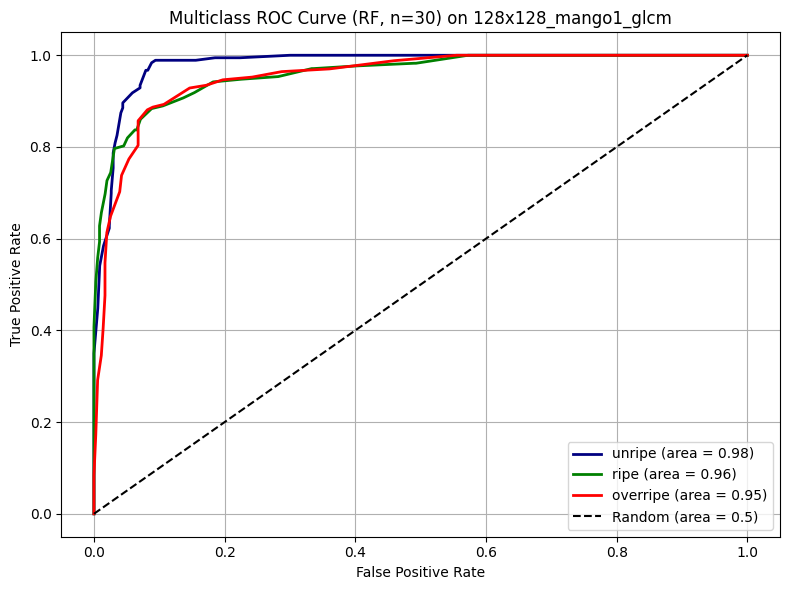


--- Random Forest (n_estimators=50) on 128x128_mango1_glcm ---
              precision    recall  f1-score   support

      unripe     0.8878    0.9508    0.9182       183
        ripe     0.9057    0.8372    0.8701       172
    overripe     0.8452    0.8452    0.8452       168

    accuracy                         0.8795       523
   macro avg     0.8796    0.8778    0.8778       523
weighted avg     0.8800    0.8795    0.8789       523

Training time: 0.1940 seconds


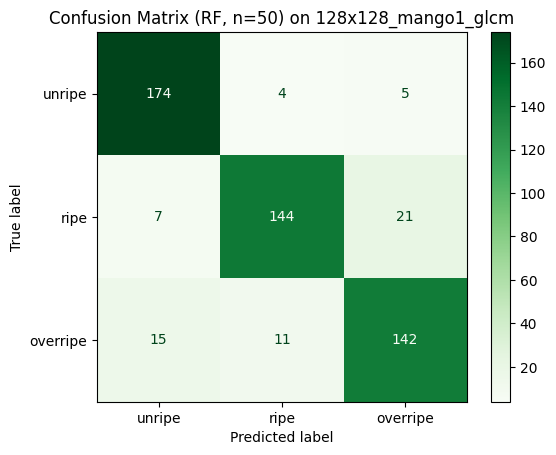

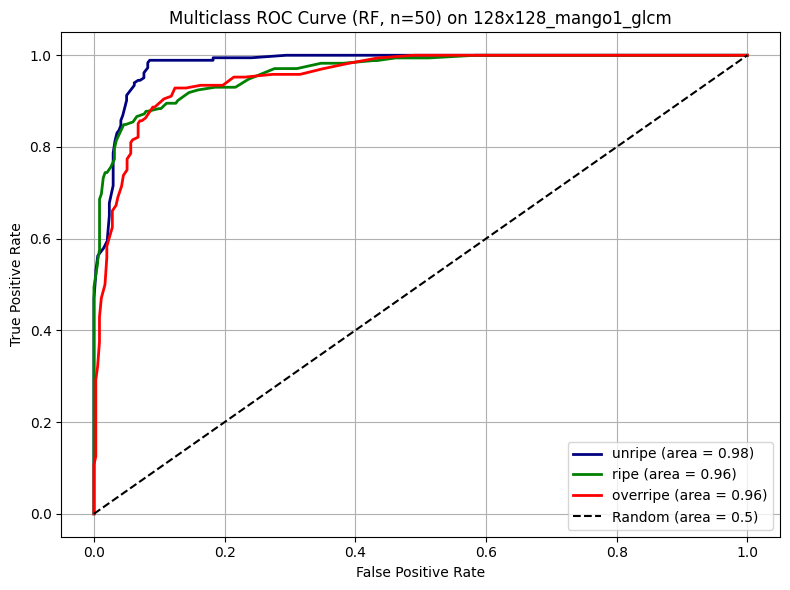


--- Random Forest (n_estimators=100) on 128x128_mango1_glcm ---
              precision    recall  f1-score   support

      unripe     0.8878    0.9508    0.9182       183
        ripe     0.8981    0.8198    0.8571       172
    overripe     0.8412    0.8512    0.8462       168

    accuracy                         0.8757       523
   macro avg     0.8757    0.8739    0.8738       523
weighted avg     0.8762    0.8757    0.8750       523

Training time: 0.3929 seconds


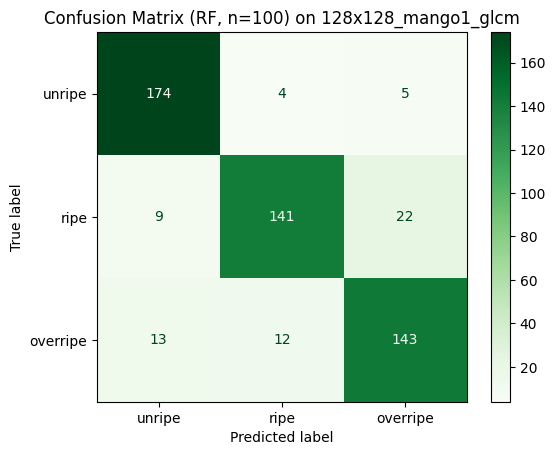

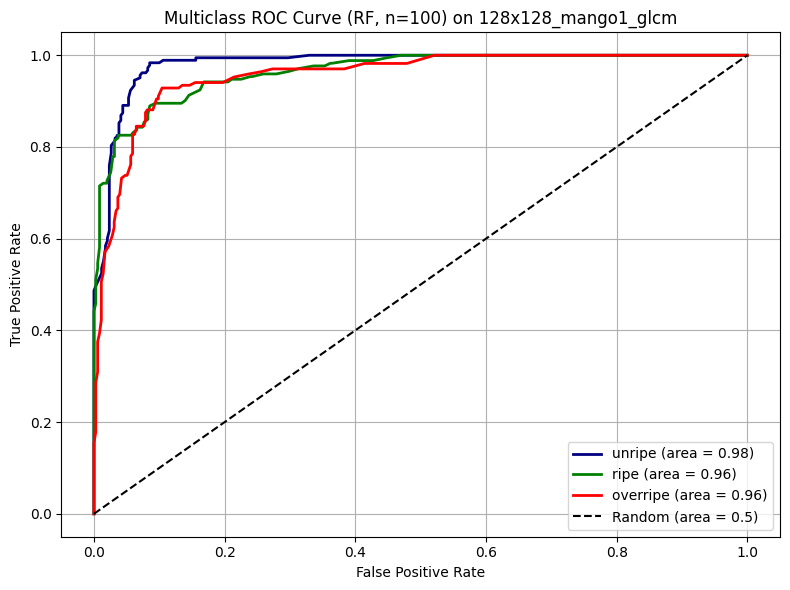


--- Random Forest (n_estimators=150) on 128x128_mango1_glcm ---
              precision    recall  f1-score   support

      unripe     0.8827    0.9454    0.9129       183
        ripe     0.8868    0.8198    0.8520       172
    overripe     0.8393    0.8393    0.8393       168

    accuracy                         0.8700       523
   macro avg     0.8696    0.8681    0.8681       523
weighted avg     0.8701    0.8700    0.8692       523

Training time: 0.5856 seconds


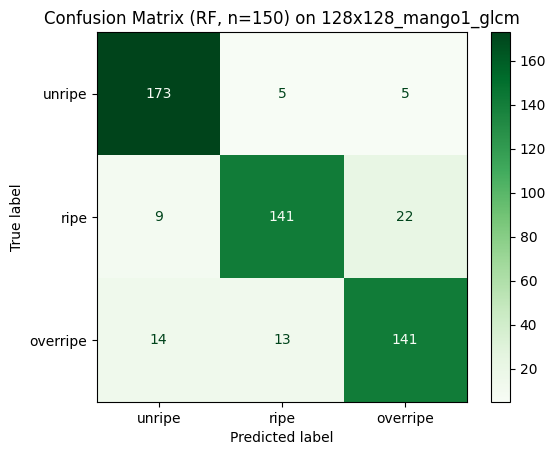

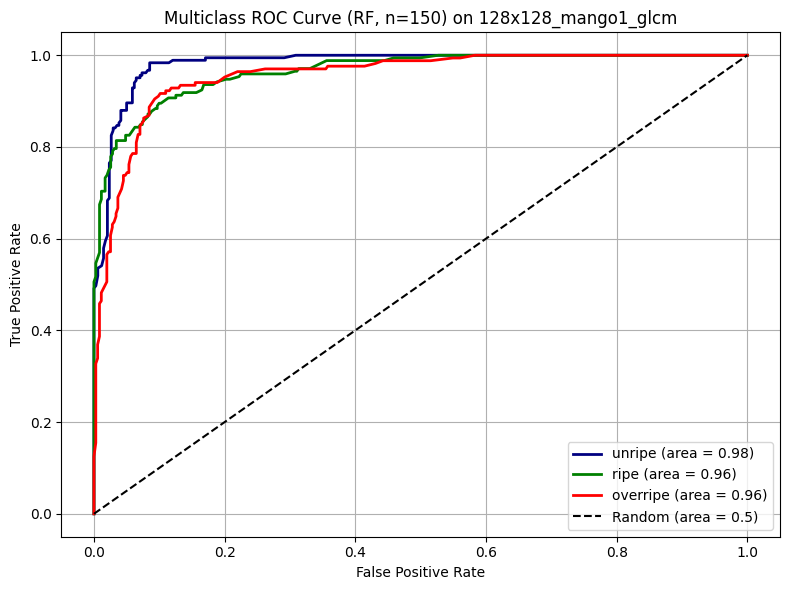


--- Random Forest (n_estimators=200) on 128x128_mango1_glcm ---
              precision    recall  f1-score   support

      unripe     0.8866    0.9399    0.9125       183
        ripe     0.8765    0.8256    0.8503       172
    overripe     0.8383    0.8333    0.8358       168

    accuracy                         0.8681       523
   macro avg     0.8672    0.8663    0.8662       523
weighted avg     0.8678    0.8681    0.8674       523

Training time: 0.7803 seconds


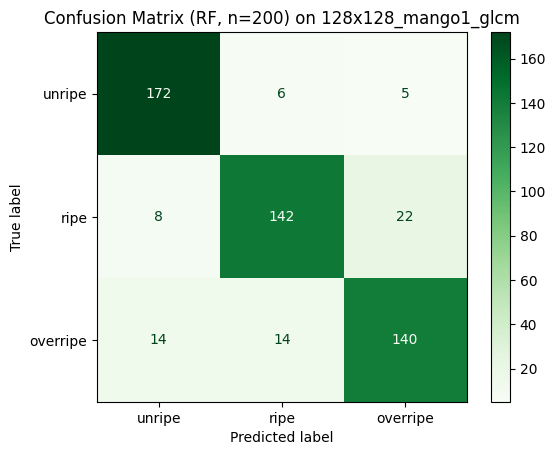

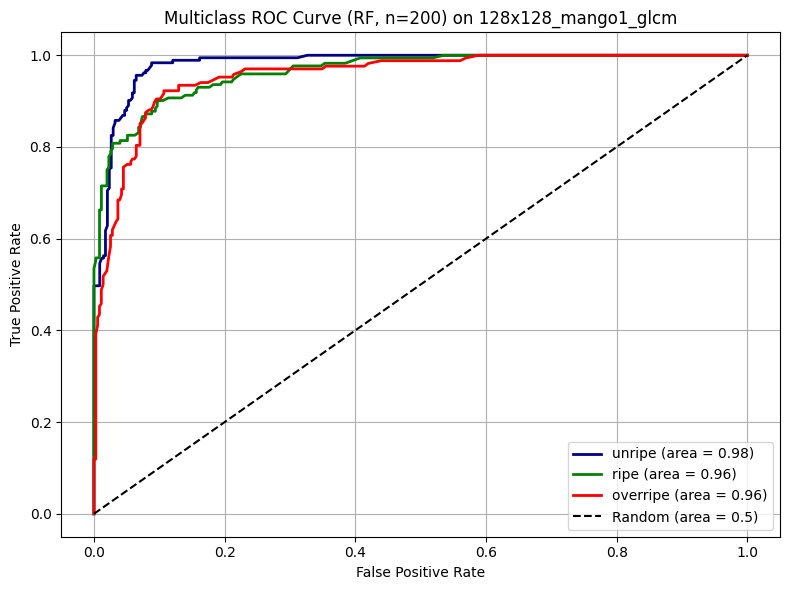

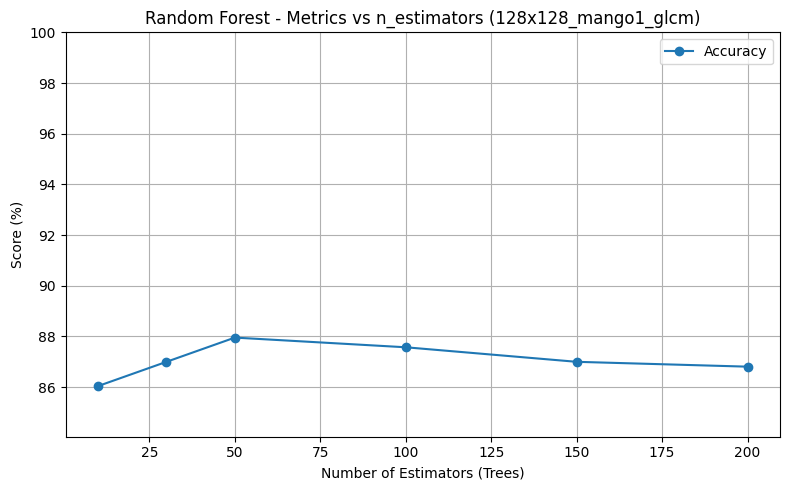

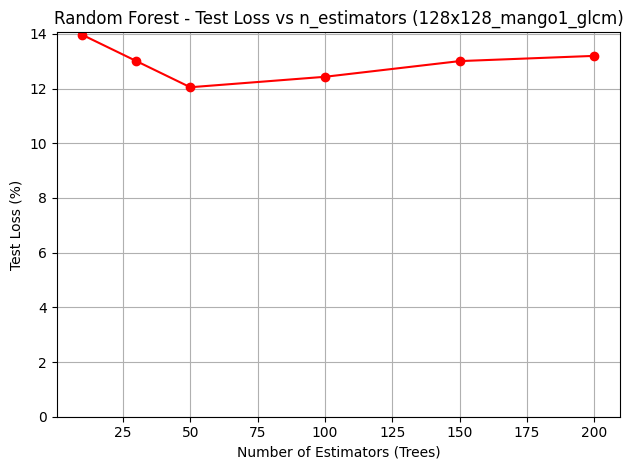

,n_estimators,Accuracy (%),Precision (%),Recall (%),F1-score (%),Test Loss (%),Training Time (s)
0,10,86.042065,86.093663,86.042065,85.948390,13.957935,0.040001
1,30,86.998088,86.960668,86.998088,86.944868,13.001912,0.116509
2,50,87.954111,87.998617,87.954111,87.894312,12.045889,0.194021
3,100,87.571702,87.619153,87.571702,87.497912,12.428298,0.392920
4,150,86.998088,87.008377,86.998088,86.922319,13.001912,0.585586
5,200,86.806883,86.778428,86.806883,86.740122,13.193117,0.780256


In [24]:
from rf_classification import rf_classification

rf_classification(
    train_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_train.csv", 
    test_csv=r"C:\Users\User\Desktop\FYP\Dataset\mango_1\128x128_glcm_test.csv",
    feature="128x128_mango1_glcm",
    class_order=['unripe', 'ripe', 'overripe']
)
